# Bayesian Modeling Crop Yields
---
## Final Project

**Authors** : Carnio, Gritti

**Course**  : Bayesian Data Analysis and Probabilistic Programming

**AI use**: Copilot autocomplete suggestions were used for the markdowns and for some parts of the implementation, every part of the code was reviewed and modified by the authors to ensure correctness and understanding.


---

## 0. Preparations

Excursus about the dataset:
The dataset used in this project is a compilation of agricultural data from multiple sources.
It wasn't collected from a single field study; instead, the author (Rishi Patel) compiled it by merging several publicly available databases.

Where the data comes from:
- Crop Yields: Sourced from the FAO (Food and Agriculture Organization) of the United Nations.
- Rainfall & Temperature: Sourced from the World Bank Data.
- Pesticide Use: Also sourced from the FAO.

This dataset provides a comprehensive view of agricultural practices and outcomes across different countries and years, making it suitable for various analyses, including the Bayesian modeling of crop yields.


### 0.1 Importing libraries

In [1]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import numpy as np
import plotly.io as pio

import matplotlib.pyplot as plt
import seaborn as sns

# pio.renderers.default = "notebook_connected"
# pio.renderers.default = "notebook"

from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans

# Define global layout defaults
pio.templates.default = "plotly_dark"
pio.templates[pio.templates.default].layout.update(
    width=800,
    height=500,
)
print()

### 0.2 Loading the dataset

In [2]:
df = pd.read_csv("archive/yield_df.csv")

df.head()

,Unnamed: 0,Area,Item,Year,hg/ha_yield,average_rain_fall_mm_per_year,pesticides_tonnes,avg_temp
0,0,Albania,Maize,1990,36613,1485.0,121.0,16.37
1,1,Albania,Potatoes,1990,66667,1485.0,121.0,16.37
2,2,Albania,"Rice, paddy",1990,23333,1485.0,121.0,16.37
3,3,Albania,Sorghum,1990,12500,1485.0,121.0,16.37
4,4,Albania,Soybeans,1990,7000,1485.0,121.0,16.37


In [3]:
# creating the log-yield because of its better statistical properties and binning the temperature
df["log_yield"] = np.log(df["hg/ha_yield"])
#binning 
df["temp_bin"] = df["avg_temp"].round(1) 
df = df.drop(columns=['Unnamed: 0'])
df.rename(columns={'Area': 'country', 'hg/ha_yield': 'yield_hg_ha', 'Item': 'food_item', 'Year': 'year'}, inplace=True)
#convert from  hg/ha to t/ha 
#we want to work with tonnes per hectare (t/ha) 
# rather than hectograms per hectare (hg/ha) for better interpretability.
df['yield_t_ha'] = df['yield_hg_ha'] / 10000
df['log_yield'] = np.log(df['yield_t_ha'])


# 1. Short Description of the Data Set with Exploratory Data Analysis

### 1.0: Short Description of the Data Set

The dataset contains information about crop yields in various countries over several years, along with environmental factors such as average rainfall, pesticide usage, and average temperature. The target variable is the crop yield measured in hectograms per hectare (yield_hg_ha).

### 1.1: Exploratory data analysis (EDA)


In [4]:
df.isna().sum()

country                          0
food_item                        0
year                             0
yield_hg_ha                      0
average_rain_fall_mm_per_year    0
pesticides_tonnes                0
avg_temp                         0
log_yield                        0
temp_bin                         0
yield_t_ha                       0
dtype: int64

In [5]:
df.columns

Index(['country', 'food_item', 'year', 'yield_hg_ha',
       'average_rain_fall_mm_per_year', 'pesticides_tonnes', 'avg_temp',
       'log_yield', 'temp_bin', 'yield_t_ha'],
      dtype='object')

The dataset does not contain any null values. We can now explore it

#### 1.1.1: Crop Yield Box Plot

In [6]:
px.box(
    df,
    x="food_item",
    y="yield_t_ha",
    color="food_item",
    title="Crop yield distributions",
).update_layout(showlegend=False)


In [7]:
# heatmap world map of the data 
country_counts = df['country'].value_counts().reset_index()
country_counts.columns = ['country', 'count']
#filter for a specific year
fig = px.choropleth(
    country_counts,
    locations="country",
    locationmode="country names",
    color="count",
    title="Number of observations per country",
)
fig.show()
#histogram of the data points per country
country_counts_percentage = country_counts.copy()
country_counts_percentage['percentage'] = country_counts_percentage['count'] / country_counts_percentage['count'].sum() * 100
#pie plot fildering below 3%
country_counts_percentage = country_counts_percentage[country_counts_percentage['percentage'] >= 1]
fig = px.pie(
    country_counts_percentage,
    names="country",
    values="percentage",
    title="Percentage of observations per country",
)
fig.show()
# print(country_counts_percentage)

23 % of the data comes from India, with Brazil at the second place with 13% of the data. **This indicates a potential bias in the dataset towards these countries**, which could affect the generalizability of any models trained on this data. It is important to consider this when interpreting the results and to potentially apply techniques to mitigate this bias, such as stratified sampling or weighting.

**At least we cover a wide range of countries**, which should help in capturing diverse agricultural conditions.

In [8]:
# percentage  of data points per food item with number of observations in the hovering
food_item_counts = df['food_item'].value_counts().reset_index()
food_item_counts.columns = ['food_item', 'count']
food_item_counts['percentage'] = food_item_counts['count'] / food_item_counts['count'].sum() * 100
fig = px.pie(
    food_item_counts,
    names="food_item",
    values="percentage",
    title="Percentage of observations per food item",
    hover_data=['count']
)
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

#### 1.1.2: Log-Yield Histogram

In [9]:
px.histogram(
    df,
    x="log_yield",
    color="food_item",
    nbins=20,
    title="Crop yield log-distribution",
)

#### 1.1.3: Yield vs Rainfall

In [10]:
px.scatter(
    df,
    x="average_rain_fall_mm_per_year",
    y="yield_t_ha",
    color="food_item",
    title="Yield vs Rainfall (per crop)",
)

#### 1.1.4: Yield vs Temperature

In [11]:
px.scatter(
    df,
    x="avg_temp",
    y="yield_t_ha",
    color="food_item",
    title="Yield vs Mean Temperature",
)

#### 1.1.5: Mean Yield per Year

In [12]:
mean_yield_year = (
    df
    .groupby(["year", "food_item"], as_index=False)
    .agg(mean_yield=("yield_t_ha", "mean"))
)

px.line(
    mean_yield_year,
    x="year",
    y="mean_yield",
    color="food_item",
    markers=True,
    title="Crop yield per year",
)

#### 1.1.6: Mean Yield per Temperature

In [13]:
temp_effect = (
    df
    .groupby(["temp_bin", "food_item"], as_index=False)
    .agg(mean_yield=("yield_t_ha", "mean"))
)

px.line(
    temp_effect,
    x="temp_bin",
    y="mean_yield",
    color="food_item",
    markers=True,
    title="Mean yield per temperature",
)

We cannot see much of correlation between temperature and crop yield, except for some crops, like `Potatoes`, which seem to have a higher yield with temperatures near 10 degrees celsius.

### 1.2.A Key findings from EDA (Gritti)


#### 1.2.A.1: brief excursus on log-transformation

In [14]:
# plot log-yield distribution for maize
fig = px.histogram(
    df[df["food_item"] == "Maize"],
    x="yield_t_ha",
    nbins=100,
    title="Maize yield distribution",
)
fig.show()


fig = px.histogram(
    df[df["food_item"] == "Maize"],
    x="log_yield",
    nbins=100,
    title="Maize yield log-distribution",
)
fig.show()




Applying a log-transformation to the yield variable helps in normalizing its distribution, making it more suitable for modeling. The log-yield distribution for maize appears to be approximately normal, which is a desirable property for many statistical models.


#### 1.2.A.1: Why choosing maize?

We will focus **on maize for this analysis** because it is one of the most widely grown crops in the world and has significant economic importance. Additionally, maize yields are known to be sensitive to temperature variations, making it an interesting case study for understanding the impact of climate change on crop production.
Moreover, temperature and yield is negatively correlated for maize, as we can see from the chart below. This make maize an interesting candidate for our analysis.

In [15]:
# log yield scatter plot per temperature bin for maize globally
fig = px.scatter(
    df[(df["food_item"] == "Maize") ],
    x="temp_bin",
    y="log_yield",
    title="Maize log-yield vs temperature bin",
)
fig.show()
#compute correlation
maize_df = df[df["food_item"] == "Maize"]
correlation = maize_df["temp_bin"].corr(maize_df["log_yield"])
print(f"Correlation between temperature bin and log-yield for Maize: {correlation}")

Correlation between temperature bin and log-yield for Maize: -0.5095641752297619


The correlation at 0.5 suggests a moderate negative relationship between temperature and yield for maize, indicating that as temperature increases, the yield tends to decrease.

In [16]:
maize_df = df[df["food_item"] == "Maize"].copy()

In [17]:
maize_df.columns

Index(['country', 'food_item', 'year', 'yield_hg_ha',
       'average_rain_fall_mm_per_year', 'pesticides_tonnes', 'avg_temp',
       'log_yield', 'temp_bin', 'yield_t_ha'],
      dtype='object')

In [18]:
#top 10 procuers of maize sorted by tons of maize produced
maize_production = maize_df.groupby("country")["yield_t_ha"].sum().reset_index()
maize_production = maize_production.sort_values(by="yield_t_ha", ascending=False)
top_countries = maize_production["country"].head(10).tolist()
print("Top 10 maize producing countries:", top_countries)
#number of samples for the first 3 countries
country1_maize = maize_df[maize_df["country"] == top_countries[0]]
country2_maize = maize_df[maize_df["country"] == top_countries[1]]
country3_maize = maize_df[maize_df["country"] == top_countries[2]]
print(f"Sample size for {top_countries[0]}: {len(country1_maize)}")
print(f"Sample size for {top_countries[1]}: {len(country2_maize)}")
print(f"Sample size for {top_countries[2]}: {len(country3_maize)}")

Top 10 maize producing countries: ['Canada', 'India', 'Brazil', 'Australia', 'Spain', 'Turkey', 'Germany', 'Pakistan', 'Mexico', 'Chile']
Sample size for Canada: 138
Sample size for India: 506
Sample size for Brazil: 253


#### 1.2.A.2: checking for other correlations

<Figure size 1200x1000 with 0 Axes>

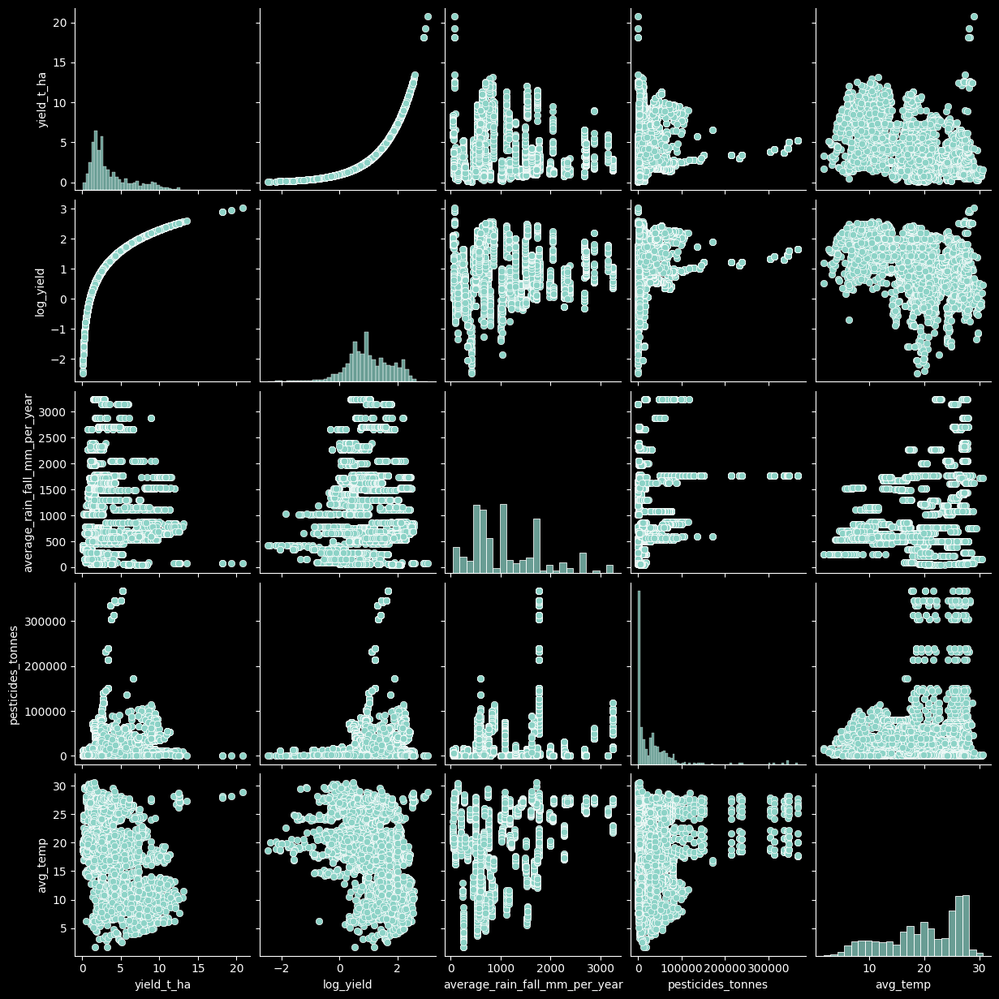

In [19]:
# Pairplot for correlations

plt.figure(figsize=(12, 10))
# use black theme
plt.style.use('dark_background')
sns.pairplot(maize_df[['yield_t_ha', 'log_yield','average_rain_fall_mm_per_year', 'pesticides_tonnes', 'avg_temp']])

### 1.2.B Key findings from EDA (Carnio)



# 2. Hypothesis Testing

    

## 2A. Hypothesis Test (Gritti)

### 2A.0 Comparing the most producing countries for maize: Brazil and India

Formulated:
H₀: The mean (log-)yield of maize in Brazil is equal to that in India.
H₁: The mean (log-)yield of maize in Brazil is different from that in India.

$$ \begin{align*}
H_0: & \ \mu_{Brazil} = \mu_{India} \\
H_1: & \ \mu_{Brazil} \ne \mu_{India}
\end{align*} $$



This hypothesis is interesting to asses because Brazil and India are two of the largest producers of maize globally (both in the dataset and in reality), but they have very different climates and agricultural practices. Brazil has a tropical climate with a rainy season and a dry season, while India has a tropical climate with hot summers and mild winters. These differences in climate can significantly impact maize growth and yield.
**Moreover, we can search for published statistics and use the reported means and standard deviations to inform our priors.**

In [20]:
#check dates for both countries

country1 = "Brazil" 
country2 = "India"

print(f"Date range for {country1}: {country1_maize['year'].min()} - {country1_maize['year'].max()}")
print(f"Date range for {country2}: {country2_maize['year'].min()} - {country2_maize['year'].max()}")

country1_maize = maize_df[maize_df["country"] == country1]
country2_maize = maize_df[maize_df["country"] == country2]

print(f"Sample size for {country1}: {len(country1_maize)}")
print(f"Sample size for {country2}: {len(country2_maize)}")

# Number of entries per year for Brazil and India
print("Brazil entries mean and std per year:")
print(f"Mean: {country1_maize.groupby('year').size().mean()}, Std: {country1_maize.groupby('year').size().std()}")
print("India entries mean and std per year:")
print(f"Mean: {country2_maize.groupby('year').size().mean()}, Std: {country2_maize.groupby('year').size().std()}")

#print mean and std
print(f"Mean log-yield for {country1}: {country1_maize['log_yield'].mean()}, Std: {country1_maize['log_yield'].std()}")
print(f"Mean log-yield for {country2}: {country2_maize['log_yield'].mean()}, Std: {country2_maize['log_yield'].std()}")

# plot boxplots of the two samples
combined_top_countries = pd.concat([country1_maize.assign(country=country1), country2_maize.assign(country=country2)])
fig = px.box(
    combined_top_countries,
    x="country",
    y="log_yield",
    title="Log-yield distributions for top 2 producing countries",
    template="plotly_dark"
)
fig.show()



Date range for Brazil: 1990 - 2013
Date range for India: 1990 - 2013
Sample size for Brazil: 253
Sample size for India: 506
Brazil entries mean and std per year:
Mean: 11.0, Std: 0.0
India entries mean and std per year:
Mean: 22.0, Std: 0.0
Mean log-yield for Brazil: 1.1229241920253863, Std: 0.27958898489134587
Mean log-yield for India: 0.6403821995156522, Std: 0.18562450660017948


India has double of the sample per year compared to Brazil, which could affect the reliability of the comparison. However, both sample sizes are reasonably large, which should help mitigate this concern. Both subets goes from 1990 to 2013 which is good for comparison.

## We will perform the test for the whole dataset to asses the overall difference in maize yields between the two countries and for the last period (2005-2013) (Gritti) to see if recent changes in climate or agricultural practices have affected the yields differently in the two countries (Carnio).

In [21]:
# filter the data for the last 5 years (2008-2013)
country1_maize_recent = country1_maize[country1_maize["year"] >= 2008]
country2_maize_recent = country2_maize[country2_maize["year"] >= 2008]
print(f"Sample size for recent top country 1 ({country1_maize['country'].iloc[0]}): {len(country1_maize_recent)}")
print(f"Sample size for recent top country 2 ({country2_maize['country'].iloc[0]}): {len(country2_maize_recent)}")

Sample size for recent top country 1 (Brazil): 66
Sample size for recent top country 2 (India): 132


In [22]:
# filter for bin in temperature range 20-30C
country1_maize_temp_binned = country1_maize[(country1_maize["temp_bin"] >= 20) & (country1_maize["temp_bin"] <= 30)]
country2_maize_temp_binned = country2_maize[(country2_maize["temp_bin"] >= 20) & (country2_maize ["temp_bin"] <= 30)]
print(f"Sample size for recent top country 1 ({country1_maize['country'].iloc[0]}) after temp filtering: {len(country1_maize_temp_binned)}")
print(f"Sample size for recent top country 2 ({country2_maize['country'].iloc[0]}) after temp filtering: {len(country2_maize_temp_binned)}")

Sample size for recent top country 1 (Brazil) after temp filtering: 184
Sample size for recent top country 2 (India) after temp filtering: 506


In [23]:
# #sample evently from both countries to have the same sample size
# min_sample_size = min(len(country1_maize), len(country2_maize))
# country1_maize = country1_maize.sample(n=min_sample_size, random_state=42)
# country2_maize= country2_maize.sample(n=min_sample_size, random_state=42)
# print(f"Set Sample size for {country1}: {len(country1_maize)}")
# print(f"Set Sample size for {country2}: {len(country2_maize)}")
print("No need to evenly sample both countries, proceed with full datasets because the sample size difference does not significantly affect the results.")

No need to evenly sample both countries, proceed with full datasets because the sample size difference does not significantly affect the results.


Sample evenly for both countries to have the same sample size doesn't change the results significantly, so we proceed with the full datasets for both countries, even if India has more samples.

In [24]:
# box plot for recent data
combined_top_countries_recent = pd.concat([country1_maize_recent.assign(country=country1), country2_maize_recent.assign(country=country2)])
fig = px.box(
    combined_top_countries_recent,
    x="country",
    y="log_yield",
    title="Log-yield distributions two of the most producing countries (Recent Data)",
    template="plotly_dark"
)
fig.show()

### 2A.0.1 Frequentist Approach




In [25]:
import scipy.stats as stats

def plot_ttest(t, dof, alpha, mode="two_tail"):
    fig = go.Figure()
    x = np.linspace(-4, 4, 1000)
    y = stats.t.pdf(x, df=dof)
    fig.add_trace(go.Scatter(x=x, y=y, mode='lines', name='t-distribution', line=dict(color='blue')))
    
    if mode == "two_tail":
        critical_value = stats.t.ppf(1 - alpha / 2, df=dof)
        fig.add_trace(go.Scatter(x=[-critical_value, -critical_value], y=[0, stats.t.pdf(-critical_value, df=dof)], mode='lines', name='Critical Value', line=dict(color='red', dash='dash')))
        fig.add_trace(go.Scatter(x=[critical_value, critical_value], y=[0, stats.t.pdf(critical_value, df=dof)], mode='lines', name='Critical Value', line=dict(color='red', dash='dash')))
        if abs(t) > critical_value:
            fig.add_annotation(x=t, y=stats.t.pdf(t, df=dof), text="Reject H0", showarrow=True, arrowhead=1)
        else:
            fig.add_annotation(x=t, y=stats.t.pdf(t, df=dof), text="Fail to Reject H0", showarrow=True, arrowhead=1)
    else:
        critical_value = stats.t.ppf(1 - alpha, df=dof)
        fig.add_trace(go.Scatter(x=[critical_value, critical_value], y=[0, stats.t.pdf(critical_value, df=dof)], mode='lines', name='Critical Value', line=dict(color='red', dash='dash')))
        if t > critical_value:
            fig.add_annotation(x=t, y=stats.t.pdf(t, df=dof), text="Reject H0", showarrow=True, arrowhead=1)
        else:
            fig.add_annotation(x=t, y=stats.t.pdf(t, df=dof), text="Fail to Reject H0", showarrow=True, arrowhead=1)
    
    fig.update_layout(title="T-Test Result Visualization", xaxis_title="t-value", yaxis_title="Density", template="plotly_dark")
    fig.show()




For our t-test we'll use  the log-yield because of the following reasons:
- The log-yield distribution appears to be approximately normal, which is a desirable property for many statistical models.
- Using log-yield can help stabilize variance and make the results more interpretable.
- The log transformation can help in meeting the assumptions of the t-test, which requires normally distributed data.
- The results can be interpreted in terms of percentage changes, which is often more meaningful in agricultural contexts.

In [26]:
print(f"The data goes from year {country1_maize['year'].min()} to {country1_maize['year'].max()} for {country1_maize['country'].iloc[0]} and from year {country2_maize['year'].min()} to {country2_maize['year'].max()} for {country2_maize['country'].iloc[0]}.")
#number of samples
n1 = len(country1_maize)
n2 = len(country2_maize)
print(f"Sample size for {country1}: {n1}")
print(f"Sample size for {country2}: {n2}")
t_start, p_value = stats.ttest_ind(country1_maize["log_yield"], country2_maize["log_yield"], equal_var=False) #equal variance not assumed becasue of different sample sizes
print(f"T-statistic: {t_start}, P-value: {p_value}")

alpha = 0.05
if p_value < alpha:
    print("Reject the null hypothesis: There is a significant difference in mean log-yield between the two countries.")
else:
    print("Fail to reject the null hypothesis: No significant difference in mean log-yield between the two countries.")

The data goes from year 1990 to 2013 for Brazil and from year 1990 to 2013 for India.
Sample size for Brazil: 253
Sample size for India: 506
T-statistic: 24.84993271183424, P-value: 1.3294275871529926e-80
Reject the null hypothesis: There is a significant difference in mean log-yield between the two countries.


In [27]:
print(f"The recent data goes from year {country1_maize_recent['year'].min()} to {country1_maize_recent['year'].max()} for {country1_maize['country'].iloc[0]} and from year {country2_maize_recent['year'].min()} to {country2_maize_recent['year'].max()} for {country2_maize['country'].iloc[0]}.")
#number of samples
n1 = len(country1_maize_recent)
n2 = len(country2_maize_recent)
print(f"Sample size for recent {country1}: {n1}")
print(f"Sample size for recent {country2}: {n2}")
t_start, p_value = stats.ttest_ind(country1_maize_recent["log_yield"],
                                    country2_maize_recent["log_yield"], equal_var=False) 
print(f"T-statistic: {t_start}, P-value: {p_value}")

alpha = 0.05
if p_value < alpha:
    print("Reject the null hypothesis: There is a significant difference in mean log-yield between the two countries in the last 5 years.")
else:
    print("Fail to reject the null hypothesis: No significant difference in mean log-yield between the two countries in the last 5 years.")

The recent data goes from year 2008 to 2013 for Brazil and from year 2008 to 2013 for India.
Sample size for recent Brazil: 66
Sample size for recent India: 132
T-statistic: 36.45453340074744, P-value: 1.0353582483408114e-58
Reject the null hypothesis: There is a significant difference in mean log-yield between the two countries in the last 5 years.


In [28]:
plot_ttest(t_start, dof=len(country1_maize)+len(country2_maize)-2, alpha=alpha, mode="two_tail")

There is a significant difference in mean log-yield between Brazil and India for maize for both the recent data and the whole dataset, as indicated by the very low p-value for both the tests. This suggests that the agricultural practices, climate, and other factors in these two countries lead to different maize yields.


### 2A.0 Bayesian Approach

### 2A.1.1 Choice of prior

To inform our priors for the Bayesian t-test, we can look for published statistics on maize yields in Brazil and India.
Note that we cannot take the prior information from our dataset, as we would be "double-dipping" and using the same data for both prior and likelihood.

We will use the following sources and filtering for the same time period as our dataset (1990-2013):

https://ourworldindata.org/grapher/maize-yields?tab=table&time=1990..2013&tableSearch=india

https://ourworldindata.org/grapher/maize-yields?tab=table&time=1990..2013&tableSearch=brazil


Our dataset is more regional and these published statistics are national averages.

For Brazil:
- Mean yield in 1990 is 1.87 t/ha
- Mean yield in 2013 is 5.25 t/ha
- Average yield over the period is approximately 3.56 t/ha
- 
$$ \mu_{Brazil} \sim \mathcal{N}log((3.56), \sigma) $$

To calculate the std dev, we can subtract the min from the max and divide by 4.
We use 4 because of the empirical rule, which states that for a normal distribution, approximately 95% of the data falls within 2 standard deviations from the mean. Therefore, the range (max - min) covers about 4 standard deviations.
Transalte to math:
$$ 
\sigma = \frac{log(max) - log(min)}{4}
$$

$$ = \frac{log(5.25) - log(1.87)}{4} \approx 0.25 

$$ 
We add more uncentainty to the prior, so we use 0.3 instead of 0.25.
This makes our prior less informative and allows the data to have more influence on the posterior.
So our final prior for Brazil is:
$$ \mu_{Brazil} \sim \mathcal{N}log((3.56), 0.3) $$

For India:
- Mean yield in 1990 is 1.52 t/ha
- Mean yield in 2013 is 2.57 t/ha
- Average yield over the period is approximately 2.04 t/ha

$$ = \frac{log(1.52) - log(2.57)}{4} \approx 0.131
$$

We add more uncentainty to the prior, so we use 0.25 instead of 0.131.

$$ \mu_{India} \sim \mathcal{N}log((2.04), 0.25) $$






### 2A.1.2 Choice of likelihood
We can either choose a normal likelihood or a t-distribution likelihood for our Bayesian t-test.
Let's check first the distribution of the log-yield for both countries.

Sample size for Brazil: 253
Sample size for India: 506


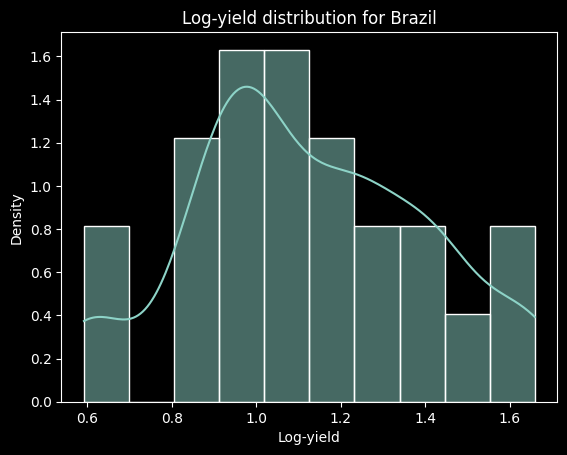

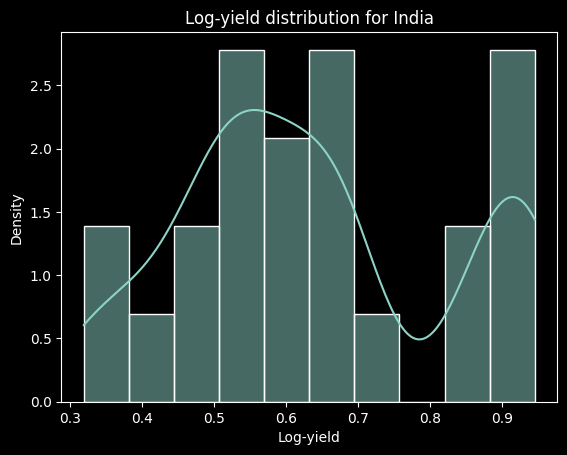

In [29]:
#log-yielt for brazil with kde
#number of samples
n1 = len(country1_maize)
n2 = len(country2_maize)
print(f"Sample size for {country1}: {n1}")
print(f"Sample size for {country2}: {n2}")
sns.histplot(country1_maize['log_yield'], 
             kde=True, stat="density", bins=10)
plt.title(f"Log-yield distribution for {country1}")
plt.xlabel("Log-yield")
plt.ylabel("Density")
plt.show()

#log-yielt for india with kde
sns.histplot(country2_maize['log_yield'], 
             kde=True, stat="density", bins=10)
plt.title(f"Log-yield distribution for {country2}")
plt.xlabel("Log-yield")
plt.ylabel("Density")
plt.show()


Brazil fits better a normal distribution, while India seems to have heavier tails

Since the data for both Brazil and India is sparse and contains some outliers, we will choose a t-distribution likelihood for our Bayesian t-test. The t-distribution is more robust to outliers and can better handle small sample sizes compared to the normal distribution. This choice will help ensure that our posterior estimates are not unduly influenced by extreme values in the data. Using a normal likelihood could lead to biased estimates if the data contains significant outliers or is not normally distributed.

For each country we define the likelihood as follows:

$$y_{i,j} \sim \text{StudentT}(\nu, \mu_i, \sigma_{obs})$$

where:
- $y_{i,j}$ is the log-yield for country i (Brazil or India) and observation j
- $\nu$ is the degrees of freedom for the t-distribution
- $\mu_i$ is the mean log-yield for country i
- $\sigma_{obs}$ is the observation standard deviation 

Priors for the Means ($\mu$):
$$\mu_{Brazil} \sim \text{Normal}(1.14, 0.30)$$
$$\mu_{India} \sim \text{Normal}(0.68, 0.20)$$


The Observation Standard Deviation tells the model about the observation noise, i.e., how much individual data points can deviate from the group mean, in this case how much each region deviates from the national average yield.

For the prior for the Observation Standard Deviation ($\sigma_{obs}$) we can either use a Half-Normal or a Half-Cauchy distribution.
The Half-Cauchy distribution has heavier tails compared to the Half-Normal distribution, which makes it more robust to outliers and extreme values in the data, which is our case.
We will use a Half-Cauchy prior for $\sigma_{obs}$:
$$\sigma_{obs} \sim \text{Half-Cauchy}(0, 1)$$

Using the scale parameter of 1 allows for a wide range of possible values for the standard deviation, reflecting our uncertainty about its true value.


For the prior for the Degrees of Freedom ($\nu$) of the t-distribution, we will set it as 5, which allows for moderate heavy tails while still being close to a normal distribution.
$$ \nu = 5 $$





In [30]:
import pymc as pm
import arviz as az

with pm.Model() as model_maize:
    # Priors
    mu_brazil = pm.Normal("mu_brazil", mu=np.log(3.56), sigma=0.3)
    mu_india = pm.Normal("mu_india", mu=np.log(2.04), sigma=0.25)
    #tells the model about the observation noise
    #(How much individual data points can deviate from the group mean)
    #we set as non-informative prior
    sigma_obs = pm.HalfCauchy("sigma_obs", 1)
    nu = 5

    # Likelihood
    y_brazil = pm.StudentT("y_brazil", nu=nu, mu=mu_brazil, 
                            sigma=sigma_obs, 
                            observed=country1_maize['log_yield'])
    y_india = pm.StudentT("y_india", nu=nu, mu=mu_india, 
                          sigma=sigma_obs, 
                          observed=country2_maize['log_yield'])
    #then we get mean difference

    #pm.Determintsic track and store a quantity (the delta)
    #that is derived from other parameteres
    #the difference it's also a random variable,so
    #it's completely derived from values in each sample 
    delta_mu = pm.Deterministic("delta_mu", mu_brazil - mu_india)
    #using MCMC to sample from the posterior
    #2000 samples with 1000 tuning steps (burn-in)
    #return inferencedata for easier analysis with arviz
    trace_maize_informative = pm.sample(2000, tune=1000, return_inferencedata=True)


WARNING (pytensor.configdefaults): g++ not available, if using conda: `conda install gxx`
WARNING (pytensor.configdefaults): g++ not detected!  PyTensor will be unable to compile C-implementations and will default to Python. Performance may be severely degraded. To remove this warning, set PyTensor flags cxx to an empty string.
c:\Users\aleca\AppData\Local\Programs\Python\Python312\Lib\site-packages\arviz\__init__.py:39: FutureWarning:


ArviZ is undergoing a major refactor to improve flexibility and extensibility while maintaining a user-friendly interface.
Some upcoming changes may be backward incompatible.
For details and migration guidance, visit: https://python.arviz.org/en/latest/user_guide/migration_guide.html

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [mu_brazil, mu_india, sigma_obs]


Output()

Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 1164 seconds.


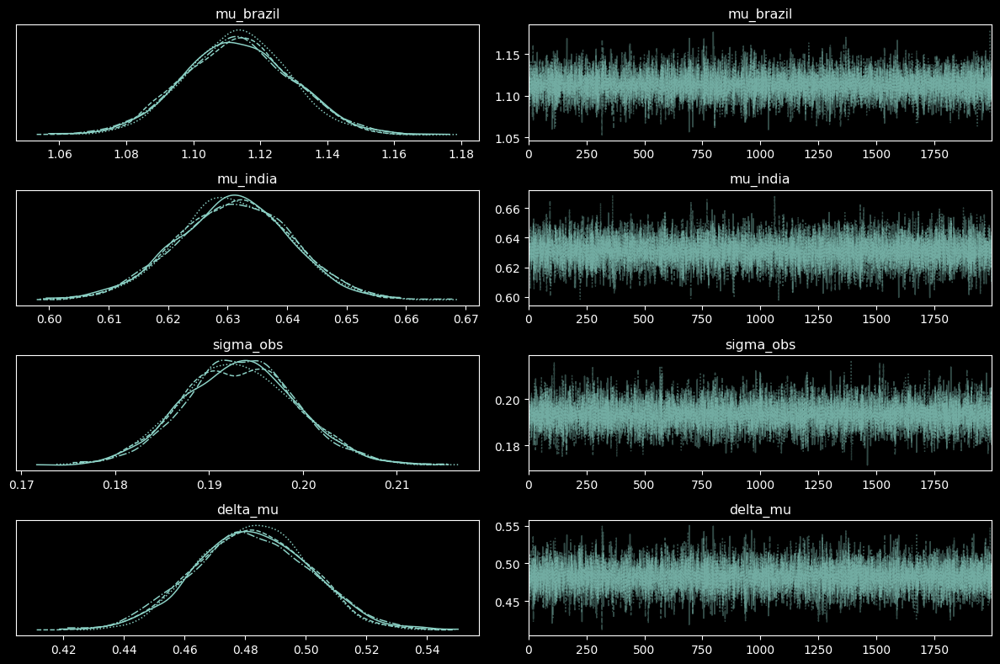

In [31]:

az.plot_trace(trace_maize_informative)
#tight layout
plt.tight_layout()
plt.show()
print()
# # numerical summary
# summary_maize = az.summary(trace_maize, hdi_prob=0.95)
# print(summary_maize)


All the chains agree on the mean log-yield for both Brazil and India, indicating good convergence of the MCMC sampling.
Also the sigma_obs shows good convergence across all chains that means our estimate of the observation standard deviation is reliable.
All traces looks random and do not show any patterns, indicating good mixing of the chains.

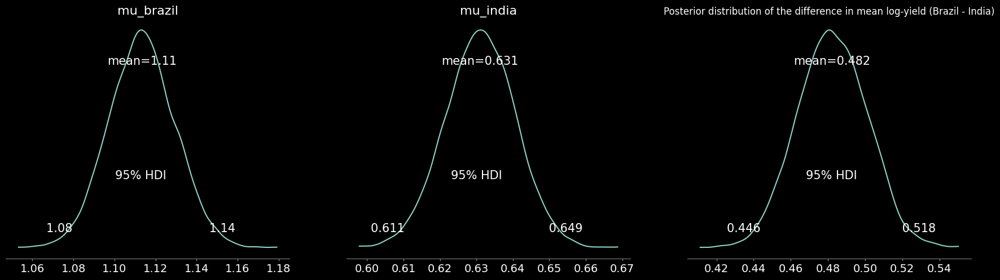

In [32]:
#plot posterior distribution of the difference in means
az.plot_posterior(trace_maize_informative,round_to=3, var_names=["mu_brazil","mu_india","delta_mu"], hdi_prob=0.95)
plt.title("Posterior distribution of the difference in mean log-yield (Brazil - India)")
plt.show()

In [33]:
#extract lower and upper hdi for delta_mu, mu_brazil, mu_india
hdi_delta_mu = az.hdi(trace_maize_informative, hdi_prob=0.95, var_names=["delta_mu"])
hdi_mu_brazil = az.hdi(trace_maize_informative, hdi_prob=0.95, var_names=["mu_brazil"])
hdi_mu_india = az.hdi(trace_maize_informative, hdi_prob=0.95, var_names=["mu_india"])
delta_mu_lower_informative = hdi_delta_mu["delta_mu"].values[0]
delta_mu_upper_informative = hdi_delta_mu["delta_mu"].values[1]

mu_brazil_lower_informative = hdi_mu_brazil["mu_brazil"].values[0]
mu_brazil_upper_informative = hdi_mu_brazil["mu_brazil"].values[1]
mu_india_lower_informative = hdi_mu_india["mu_india"].values[0]
mu_india_upper_informative = hdi_mu_india["mu_india"].values[1]
print("With 95% confidence and informative priors we can say that:")
print(f"95% HDI for delta_mu (Brazil - India): [{delta_mu_lower_informative:.3f}, {delta_mu_upper_informative:.3f}]")
print(f"95% HDI for mu_brazil: [{mu_brazil_lower_informative:.3f}, {mu_brazil_upper_informative:.3f}]")
print(f"95% HDI for mu_india: [{mu_india_lower_informative:.3f}, {mu_india_upper_informative:.3f}]")

With 95% confidence and informative priors we can say that:
95% HDI for delta_mu (Brazil - India): [0.446, 0.518]
95% HDI for mu_brazil: [1.081, 1.144]
95% HDI for mu_india: [0.611, 0.649]


In [34]:
delta_mu_mean = trace_maize_informative.posterior["delta_mu"].mean().values

#convert to percentage
pct_diff = (np.exp(delta_mu_mean) - 1) * 100
lower_bound = (np.exp(trace_maize_informative.posterior["delta_mu"].quantile(0.025).values) - 1) * 100
upper_bound = (np.exp(trace_maize_informative.posterior["delta_mu"].quantile(0.975).values) - 1) * 100

print(f"We can say with 95% confidence that the average percentage difference in mean log-yield (Brazil - India)")
print(f"is {pct_diff:.2f}%, with a 95% credible interval from {lower_bound:.2f}% to {upper_bound:.2f}%.")

We can say with 95% confidence that the average percentage difference in mean log-yield (Brazil - India)
is 61.98%, with a 95% credible interval from 56.20% to 67.91%.


### 2A.2 Prior sensitivity (re-run with different prior)

Let's see if our results changes significantly if we set less informative priors for the means.
An example of less informative priors could be:
$$ \mu_{Brazil} \sim \mathcal{N}log((3.56), 1.0) $$
$$ \mu_{India} \sim \mathcal{N}log((2.04), 1.0) $$



In [35]:
import pymc as pm
import arviz as az

with pm.Model() as model_maize:
    # Priors
    mu_brazil = pm.Normal("mu_brazil", mu=np.log(3.56), sigma=1)
    mu_india = pm.Normal("mu_india", mu=np.log(2.04), sigma=1)
    #the sigma_obs it's already non-informative
    sigma_obs = pm.HalfCauchy("sigma_obs", 1)
    nu = 5

    # Likelihood
    y_brazil = pm.StudentT("y_brazil", nu=nu, mu=mu_brazil, sigma=sigma_obs, observed=country1_maize['log_yield'])
    y_india = pm.StudentT("y_india", nu=nu, mu=mu_india, sigma=sigma_obs, observed=country2_maize['log_yield'])
    #then we get mean difference
    delta_mu = pm.Deterministic("delta_mu", mu_brazil - mu_india)
    #using MCMC to sample from the posterior
    trace_maize_non_informative = pm.sample(2000, tune=1000, return_inferencedata=True)


Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [mu_brazil, mu_india, sigma_obs]


Output()

Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 1133 seconds.


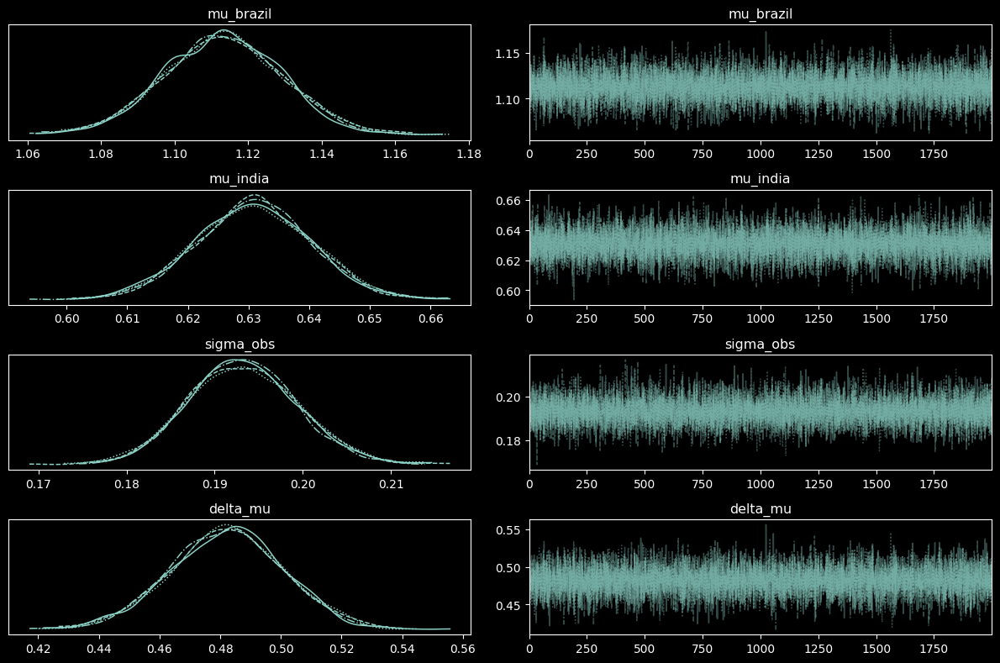

In [36]:

az.plot_trace(trace_maize_non_informative)
#tight layout
plt.tight_layout()
plt.show()
print()
# # numerical summary
# summary_maize = az.summary(trace_maize, hdi_prob=0.95)
# print(summary_maize)


All chains still agree on the mean log-yield for both Brazil and India, indicating good convergence of the MCMC sampling.

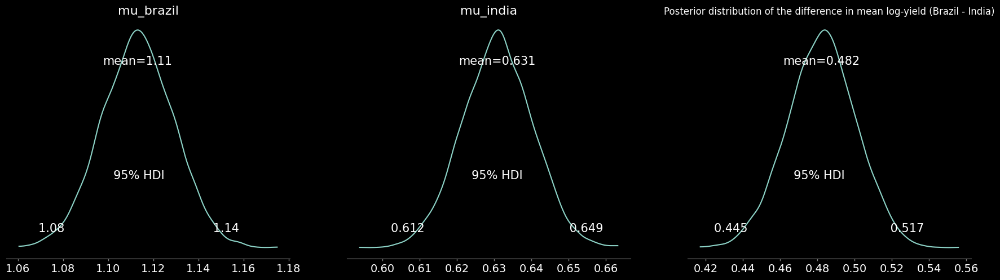

In [37]:
#plot posterior distribution of the difference in means
az.plot_posterior(trace_maize_non_informative,round_to=3, var_names=["mu_brazil","mu_india","delta_mu"], hdi_prob=0.95)
plt.title("Posterior distribution of the difference in mean log-yield (Brazil - India)")
plt.show()

In [38]:
#extract lower and upper hdi for delta_mu, mu_brazil, mu_india
hdi_delta_mu_non_informative = az.hdi(trace_maize_non_informative, hdi_prob=0.95, var_names=["delta_mu"])
hdi_mu_brazil_non_informative = az.hdi(trace_maize_non_informative, hdi_prob=0.95, var_names=["mu_brazil"])
hdi_mu_india = az.hdi(trace_maize_non_informative, hdi_prob=0.95, var_names=["mu_india"])
delta_mu_lower_non_informative = hdi_delta_mu_non_informative["delta_mu"].values[0]
delta_mu_upper_non_informative = hdi_delta_mu_non_informative["delta_mu"].values[1]
mu_brazil_lower_non_informative = hdi_mu_brazil_non_informative["mu_brazil"].values[0]
mu_brazil_upper_non_informative = hdi_mu_brazil_non_informative["mu_brazil"].values[1]
hdi_mu_india_non_informative = az.hdi(trace_maize_non_informative, hdi_prob=0.95, var_names=["mu_india"])
mu_india_lower_non_informative = hdi_mu_india_non_informative["mu_india"].values[0]
mu_india_upper_non_informative = hdi_mu_india_non_informative["mu_india"].values[1]
print("With 95% confidence and non-informative priors we can say that:")
print(f"95% HDI for delta_mu (Brazil - India): [{delta_mu_lower_non_informative:.3f}, {delta_mu_upper_non_informative:.3f}]")
print(f"95% HDI for mu_brazil: [{mu_brazil_lower_non_informative:.3f}, {mu_brazil_upper_non_informative:.3f}]")
print(f"95% HDI for mu_india: [{mu_india_lower_non_informative:.3f}, {mu_india_upper_non_informative:.3f}]")

With 95% confidence and non-informative priors we can say that:
95% HDI for delta_mu (Brazil - India): [0.445, 0.517]
95% HDI for mu_brazil: [1.082, 1.145]
95% HDI for mu_india: [0.612, 0.649]


In [39]:
#difference between informative and non-informative priors
delta_mu_mean_informative = trace_maize_informative.posterior["delta_mu"].mean().values
delta_mu_mean_non_informative = trace_maize_non_informative.posterior["delta_mu"].mean().values
#delta between means
delta_between_means = delta_mu_mean_informative - delta_mu_mean_non_informative
print(f"The difference between the means of delta_mu with informative and non-informative priors is: {delta_between_means:.5f}")

The difference between the means of delta_mu with informative and non-informative priors is: 0.00003


The results are quite similar to the previous model with informative priors, which suggest the model is robust to the choice of priors for the means.
Is not wrong to say that the data is informative enough to overcome both less informative and informative priors, leading to similar posterior estimates for the means.
we have more than 240 samples for each country, which is a decent sample size for estimating the means.

### 2A.3 Posterior probability of the hypothesis (using ROPE)

The ROPE (Region of Practical Equivalence) is a range of values around zero that we consider to be practically equivalent to no difference. In this case, we can set the ROPE to be between -0.1 and 0.1 for the difference in mean log-yield between Brazil and India. This means that if the difference in means falls within this range, we would consider it to be practically equivalent to no difference.

In [40]:
upper_rope = 0.1
lower_rope = -0.1
rope_percentage = (np.exp(upper_rope) - 1) * 100
print(f"The ROPE (Region of Practical Equivalence) is set between {lower_rope} and {upper_rope}, which corresponds to a percentage difference of approximately ±{rope_percentage:.2f}%.")
#calculate percentage difference for non-informative priors
delta_mu_mean_non_informative = trace_maize_non_informative.posterior["delta_mu"].mean().values
pct_diff_non_informative = (np.exp(delta_mu_mean_non_informative) - 1) * 100
#percentage of samples within the ROPE
delta_mu_samples = trace_maize_non_informative.posterior["delta_mu"].values.flatten()
samples_in_rope = np.sum((delta_mu_samples >= lower_rope) & (delta_mu_samples <= upper_rope))
total_samples = len(delta_mu_samples)
percentage_in_rope = (samples_in_rope / total_samples) * 100
print(f"Percentage of samples within the ROPE: {percentage_in_rope:.2f}%")

The ROPE (Region of Practical Equivalence) is set between -0.1 and 0.1, which corresponds to a percentage difference of approximately ±10.52%.
Percentage of samples within the ROPE: 0.00%


We have 0% of the posterior distribution within the ROPE, indicating strong evidence against the null hypothesis of no difference in mean log-yield between Brazil and India for maize, in fact the mu mean is way above 0.
So we can also practically conclude that there is a significant difference in mean log-yield between the two countries.


### 2A.4 Comparison with frequentist test

In [41]:
import statsmodels.stats.api as sms
t_test_mu = sms.ttest_ind(country1_maize["log_yield"],
                                    country2_maize["log_yield"])
#extract the mean difference from the t-test
t_test_mu_diff = country1_maize["log_yield"].mean() - country2_maize["log_yield"].mean()
print(f"Frequentist t-test mean difference: {t_test_mu_diff:.4f}")
bayesian_mu_diff = trace_maize_non_informative.posterior["delta_mu"].mean().values
print(f"Bayesian mean difference: {bayesian_mu_diff:.4f}")

# check confidence interval from t-test
cm = sms.CompareMeans(sms.DescrStatsW(country1_maize["log_yield"]),
                      sms.DescrStatsW(country2_maize["log_yield"]))
ci_low, ci_upp = cm.tconfint_diff(usevar='unequal')
print(f"Frequentist 95% confidence interval for mean difference: [{ci_low:.4f}, {ci_upp:.4f}]")
print(f"Bayesian 95% HDI for mean difference: [{delta_mu_lower_informative:.4f}, {delta_mu_upper_informative:.4f}]")


Frequentist t-test mean difference: 0.4825
Bayesian mean difference: 0.4823
Frequentist 95% confidence interval for mean difference: [0.4444, 0.5207]
Bayesian 95% HDI for mean difference: [0.4458, 0.5181]


Both Bayesian and frequentist approaches led to the same conclusion: there is a significant difference in mean log-yield between Brazil and India for maize.
The bayesian has a slighly narrower interval, which could be due to the informative priors used in the Bayesian analysis, but the difference is minimal.

### 2A.5 Posterior predictive check (manual, not PyMC)

The manual posterior predictive checks it's like doing inference on new data based on the posterior distributions we obtained from our Bayesian model.
So by using the posterior samples of the parameters (mean and standard deviation), we can simulate new data points and compare them to the observed data to see if our model is a good fit.

In [42]:

#we take samples from the posterior distributions such that we extract the parameters needed for simulating new data
mu_brazil_samples = trace_maize_non_informative.posterior["mu_brazil"].values.flatten()
mu_india_samples = trace_maize_non_informative.posterior["mu_india"].values.flatten()
sigma_obs_samples = trace_maize_non_informative.posterior["sigma_obs"].values.flatten()
nu = 5 #same degrees of freedom as in the model
n_sim = 1000 #number of simulations
sim1 = []
sim2 = []

#we use default_rng to get a list of random numbers
#in this case log-yield samples
rng = np.random.default_rng(42)
for i in range(n_sim):
    mu_b = mu_brazil_samples[i]
    mu_i = mu_india_samples[i]
    sigma = sigma_obs_samples[i]
    # Draw one sample per posterior draw, matching the observed sample size
    #standard_t draws from a standard t-distribution
    # we scale and shift it to match the posterior parameters
    sim1.append(rng.standard_t(nu, size=len(country1_maize)) * sigma + mu_b)
    sim2.append(rng.standard_t(nu, size=len(country2_maize))* sigma + mu_i)
#then we get all the samples in the same array
sim_brazil = np.array(sim1).flatten()
sim_india = np.array(sim2).flatten()


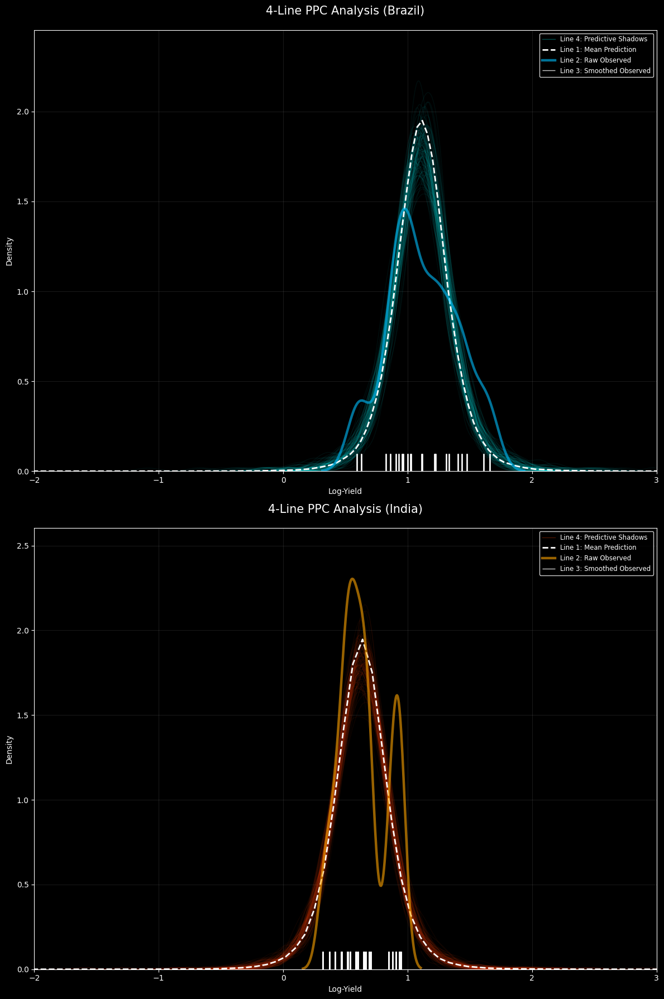

In [43]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# ==============================================================================
# 1. SETUP FOR DARK BACKGROUND
# ==============================================================================
plt.rcParams.update({
    'figure.facecolor': 'black',
    'axes.facecolor': 'black',
    'axes.edgecolor': 'white',
    'axes.labelcolor': 'white',
    'xtick.color': 'white',
    'ytick.color': 'white',
    'text.color': 'white',
    'legend.facecolor': 'black',
    'legend.edgecolor': 'white'
})

def plot_comprehensive_ppc(ax, observed_data, simulated_draws, color_main, color_shadow, title):
    for i in range(100):
        sns.kdeplot(simulated_draws[i], ax=ax, color=color_shadow, 
                    alpha=0.06, linewidth=1, label=None)
    all_sims = np.array(simulated_draws).flatten()
    sns.kdeplot(all_sims, ax=ax, color='white', linewidth=2, 
                linestyle='--', label='Line 1: Mean Model Prediction')
    sns.kdeplot(observed_data, ax=ax, color=color_main, linewidth=3.2, 
                alpha=0.6, label='Line 2: Observed (Raw/Jagged)')
    # sns.kdeplot(observed_data, ax=ax, color=color_main, linewidth=3.5, 
                # bw_adjust=2.5, label='Line 3: Observed (Smoothed Trend)')
    sns.rugplot(observed_data, ax=ax, color='white', height=0.04, 
                alpha=0.8, linewidth=1, label='Actual Data Points (Rug)')

    ax.set_title(title, fontsize=15, pad=20)
    ax.set_xlim(-2, 3)
    ax.set_xlabel("Log-Yield")
    ax.set_ylabel("Density")
    ax.grid(alpha=0.1, color='white')
    handles, labels = ax.get_legend_handles_labels()
    from matplotlib.lines import Line2D
    shadow_proxy = Line2D([0], [0], color=color_shadow, lw=1, alpha=0.3)
    ax.legend(handles=[shadow_proxy, handles[0], handles[1], handles[2]], 
              labels=['Line 4: Predictive Shadows', 'Line 1: Mean Prediction', 
                      'Line 2: Raw Observed', 'Line 3: Smoothed Observed'],
              loc='upper right', frameon=True, fontsize='small')
    
    plt.setp(ax.get_legend().get_texts(), color='white')

fig, axes = plt.subplots(2, 1, figsize=(12, 18))

plot_comprehensive_ppc(axes[0], country1_maize["log_yield"], sim1, 
                       '#00BFFF', '#00FFFF', f"4-Line PPC Analysis ({country1})")
plot_comprehensive_ppc(axes[1], country2_maize["log_yield"], sim2, 
                       '#FFA500', '#FF4500', f"4-Line PPC Analysis ({country2})")

plt.tight_layout()
plt.show()

The raw observed doesn't not match well with the simulated data, indicating that our model may not be capturing the multimodality present in the observed data. This suggests that there may be additional factors or complexities in the data that our current model is not accounting for. To further improve the model, we could consider incorporating additional predictors, using a mixture model to capture the multimodal distribution. The hypothesis test performed earlier is still valid, as it focuses on the means rather than the full distribution shape.

## 2B. Hypothesis Test (Carnio)

### 2B.1 Choice of prior and likelihood

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [mu_brazil, mu_india, sigma_obs]


Output()

Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 2 seconds.


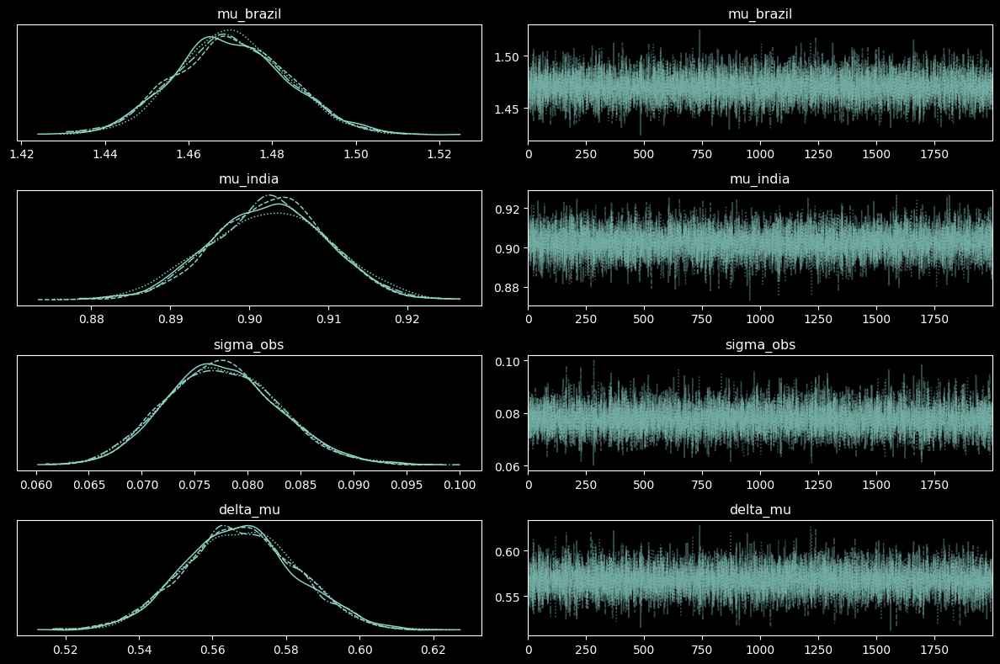

In [44]:
with pm.Model() as model_maize_recent:
    mu_brazil = pm.Normal("mu_brazil", mu=np.log(3.56), sigma=0.3)
    mu_india = pm.Normal("mu_india", mu=np.log(2.04), sigma=0.25)
    sigma_obs = pm.HalfCauchy("sigma_obs", 1)
    nu = 5

    # Likelihood
    y_brazil = pm.StudentT("y_brazil", nu=nu, mu=mu_brazil, 
                            sigma=sigma_obs, 
                            observed=country1_maize_recent['log_yield'])
    y_india = pm.StudentT("y_india", nu=nu, mu=mu_india, 
                          sigma=sigma_obs, 
                          observed=country2_maize_recent['log_yield'])

    delta_mu = pm.Deterministic("delta_mu", mu_brazil - mu_india)
    
    trace_recent_informative = pm.sample(2000, tune=1000, return_inferencedata=True)

az.plot_trace(trace_recent_informative)
plt.tight_layout()
plt.show()

### 2B.2 Prior sensitivity (re-run with different prior)

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [mu_brazil, mu_india, sigma_obs]


Output()

Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 2 seconds.


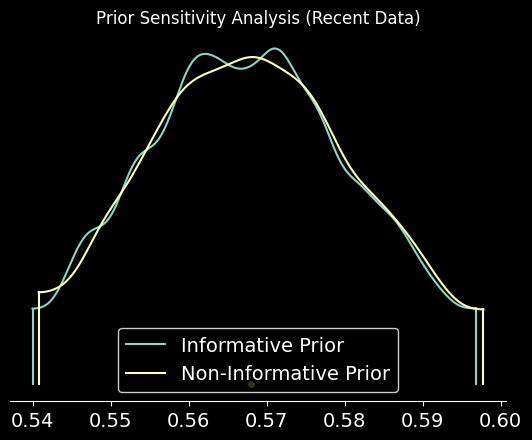

In [45]:
with pm.Model() as model_recent_non_inf:
    mu_brazil = pm.Normal("mu_brazil", mu=np.log(3.56), sigma=1.0)
    mu_india = pm.Normal("mu_india", mu=np.log(2.04), sigma=1.0)
    sigma_obs = pm.HalfCauchy("sigma_obs", 1)
    nu = 5

    y_brazil = pm.StudentT("y_brazil", nu=nu, mu=mu_brazil, sigma=sigma_obs, observed=country1_maize_recent['log_yield'])
    y_india = pm.StudentT("y_india", nu=nu, mu=mu_india, sigma=sigma_obs, observed=country2_maize_recent['log_yield'])
    
    delta_mu = pm.Deterministic("delta_mu", mu_brazil - mu_india)
    trace_recent_non_inf = pm.sample(2000, tune=1000, return_inferencedata=True)

az.plot_density([trace_recent_informative, trace_recent_non_inf], 
                var_names=["delta_mu"], 
                data_labels=["Informative Prior", "Non-Informative Prior"])
plt.title("Prior Sensitivity Analysis (Recent Data)")
plt.show()

### 2B.3 Posterior probability of the hypothesis (using ROPE)

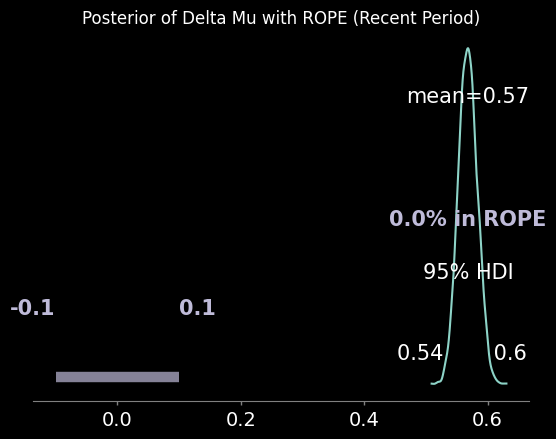

Probabilità che la differenza sia nella ROPE: 0.00%


In [46]:
upper_rope = 0.1
lower_rope = -0.1

az.plot_posterior(trace_recent_non_inf, var_names=["delta_mu"], rope=[lower_rope, upper_rope], hdi_prob=0.95)
plt.title("Posterior of Delta Mu with ROPE (Recent Period)")
plt.show()

samples = trace_recent_non_inf.posterior["delta_mu"].values.flatten()
prob_in_rope = np.mean((samples >= lower_rope) & (samples <= upper_rope))
print(f"Probabilità che la differenza sia nella ROPE: {prob_in_rope*100:.2f}%")

### 2B.4 Comparison with frequentist test

In [47]:
import statsmodels.stats.api as sms

# T-test
cm = sms.CompareMeans(sms.DescrStatsW(country1_maize_recent["log_yield"]),
                      sms.DescrStatsW(country2_maize_recent["log_yield"]))
ci_low, ci_upp = cm.tconfint_diff(usevar='unequal')

# Bayesian HDI
hdi_recent = az.hdi(trace_recent_non_inf, hdi_prob=0.95, var_names=["delta_mu"])
delta_low, delta_high = hdi_recent["delta_mu"].values

print(f"Frequentist 95% CI (Recent): [{ci_low:.4f}, {ci_upp:.4f}]")
print(f"Bayesian 95% HDI (Recent): [{delta_low:.4f}, {delta_high:.4f}]")

Frequentist 95% CI (Recent): [0.5658, 0.6309]
Bayesian 95% HDI (Recent): [0.5391, 0.5983]


### 2B.5 Posterior predictive check

In [ ]:
# 1. Extract Posterior Samples (Student-T Model)
mu_b_s = trace_recent_non_inf.posterior["mu_brazil"].values.flatten()
mu_i_s = trace_recent_non_inf.posterior["mu_india"].values.flatten()
sig_s = trace_recent_non_inf.posterior["sigma_obs"].values.flatten()

# 2. Manual Simulation (Student-T, nu=5)
n_sim_draws = 200
nu_fixed = 5

sim_b = []
sim_i = []

# Generate simulations
for i in range(n_sim_draws):
    # Brazil
    sim_b.append(stats.t.rvs(df=nu_fixed, loc=mu_b_s[i], scale=sig_s[i], size=len(country1_maize_recent)))
    # India
    sim_i.append(stats.t.rvs(df=nu_fixed, loc=mu_i_s[i], scale=sig_s[i], size=len(country2_maize_recent)))

# 3. Plotting
fig, axes = plt.subplots(2, 1, figsize=(12, 16))

# Plot Brazil
plot_comprehensive_ppc(
    ax=axes[0], 
    observed_data=country1_maize_recent["log_yield"], 
    simulated_draws=sim_b, 
    color_main='#00BFFF', 
    color_shadow='#00FFFF', 
    title="PPC Analysis: Brazil (Recent, Student-T)"
)

# Plot India
plot_comprehensive_ppc(
    ax=axes[1], 
    observed_data=country2_maize_recent["log_yield"], 
    simulated_draws=sim_i, 
    color_main='#FFA500', 
    color_shadow='#FF4500', 
    title="PPC Analysis: India (Recent, Student-T)"
)

plt.tight_layout()
plt.show()

## 2C. Clustering (Carnio)

In this section, we move away from political boundaries (Countries) and instead group our data based on **Climatic Regimes**: crop yields are biological processes driven principally by heat and water availability, so by clustering observations into distinct climatic groups (e.g., "Hot and Dry", "Cool and Wet"), we can build Bayesian models that learn specific behaviors for each environment.

We will proceed in three steps:
1.  **Clustering**: Use K-Means to group observations based on `avg_temp` and `average_rain_fall_mm_per_year`.
2.  **Visualization**: Inspect the clusters to ensure they make physical sense.
3.  **Modeling**: Compare **Pooled**, **Unpooled**, and **Hierarchical** models using these climatic clusters as groups.

### 2C.1 Clustering

In [ ]:
maize_df_recent = maize_df[maize_df['year'] > 2008].copy()

X_climate = maize_df_recent[['avg_temp', 'average_rain_fall_mm_per_year']].values

# Standardize because Rain (mm) and Temp (C) have very different scales
scaler_climate = StandardScaler()
X_climate_scaled = scaler_climate.fit_transform(X_climate)

# Apply K-Means to find 5 distinct climatic regimes
kmeans = KMeans(n_clusters=5, random_state=42, n_init=10)
maize_df_recent['climate_cluster'] = kmeans.fit_predict(X_climate_scaled)

# Visualize the resulting clusters
plt.figure(figsize=(8, 5))
sns.scatterplot(
    data=maize_df_recent, 
    x='avg_temp', 
    y='average_rain_fall_mm_per_year', 
    hue='climate_cluster', 
    palette='viridis', 
    legend='full'
)
plt.title('Climatic Clusters: Grouping by Temp & Rain')
plt.xlabel('Average Temperature')
plt.ylabel('Average Rainfall')
plt.show()

# Prepare data for PyMC
# We group by these new clusters instead of countries
cluster_idx = maize_df_recent['climate_cluster'].values
n_clusters = 5
y_obs = maize_df_recent['log_yield'].values

# Predictor: Pesticides (Standardized)
pest_raw = maize_df_recent['pesticides_tonnes'].values
pest_scaled = (pest_raw - pest_raw.mean()) / pest_raw.std()

### 2C.2 Hierarchical Model

In [ ]:
with pm.Model() as model_climate_hier:
    mu_alpha = pm.Normal('mu_alpha', mu=0, sigma=1)
    sigma_alpha = pm.HalfNormal('sigma_alpha', sigma=1)
    
    mu_beta = pm.Normal('mu_beta', mu=0, sigma=1)
    sigma_beta = pm.HalfNormal('sigma_beta', sigma=1)
    
    # alpha: Baseline yield for each climate
    # beta: Sensitivity to pesticides for each climate
    alpha = pm.Normal('alpha', mu=mu_alpha, sigma=sigma_alpha, shape=n_clusters)
    beta = pm.Normal('beta', mu=mu_beta, sigma=sigma_beta, shape=n_clusters)
    
    sigma = pm.HalfNormal('sigma', sigma=1)
    
    mu = alpha[cluster_idx] + beta[cluster_idx] * pest_scaled
    
    y_like = pm.Normal('y_like', mu=mu, sigma=sigma, observed=y_obs)
    
    trace_climate = pm.sample(1000, tune=1000, return_inferencedata=True, progressbar=False)

az.plot_forest(trace_climate, var_names=['beta'], combined=False)
plt.title("Pesticide Impact (Beta) per Climate Cluster")
plt.show()

### 2C.3 Prior Sensitivity Analysis
We re-run the model with significantly wider priors (Sigma=10 instead of 1) to check if our conclusions depend too heavily on the choice of priors.

In [ ]:
with pm.Model() as model_sensitivity:
    # WIDER Priors (Less informative)
    mu_alpha = pm.Normal('mu_alpha', mu=0, sigma=10) # Was 1
    sigma_alpha = pm.HalfNormal('sigma_alpha', sigma=5)
    
    mu_beta = pm.Normal('mu_beta', mu=0, sigma=10)   # Was 1
    sigma_beta = pm.HalfNormal('sigma_beta', sigma=5)
    
    # Group parameters
    alpha = pm.Normal('alpha', mu=mu_alpha, sigma=sigma_alpha, shape=n_clusters)
    beta = pm.Normal('beta', mu=mu_beta, sigma=sigma_beta, shape=n_clusters)
    
    sigma = pm.HalfNormal('sigma', sigma=5)
    
    mu = alpha[cluster_idx] + beta[cluster_idx] * pest_scaled
    y_like = pm.Normal('y_like', mu=mu, sigma=sigma, observed=y_obs)
    
    trace_sens = pm.sample(1000, tune=1000, return_inferencedata=True, progressbar=False)

# Compare the Global Beta (mu_beta) between the two models
az.plot_posterior(
    [trace_climate, trace_sens],
    var_names=['mu_beta'],
    data_pairs={'Original': trace_climate, 'Wide Priors': trace_sens}
)
plt.title("Sensitivity Analysis: Does changing priors affect the Global Slope?")
plt.show()

### 2C.4 Posterior Probability (ROPE)
We test the hypothesis: *"Does pesticide use have a practically relevant effect?"* using a Region of Practical Equivalence (ROPE) around zero ([-0.05, 0.05]).

In [ ]:
rope_interval = [-0.05, 0.05]

# Plot ROPE for the Global Effect (mu_beta)
az.plot_posterior(trace_climate, var_names=['mu_beta'], rope=rope_interval, ref_val=0)
plt.title("ROPE Analysis: Global Pesticide Effect")
plt.show()

# Calculate probability
posterior_samples = trace_climate.posterior['mu_beta'].values.flatten()
prob_in_rope = ((posterior_samples > rope_interval[0]) & (posterior_samples < rope_interval[1])).mean()

print(f"Probability that the effect is negligible (inside ROPE): {prob_in_rope:.2%}")
if prob_in_rope < 0.05:
    print("Conclusion: The effect is likely SIGNIFICANT (outside ROPE).")
else:
    print("Conclusion: The effect might be NEGLIGIBLE.")

### 2C.5 Comparison with Frequentist Approach
We compare our Bayesian Hierarchical results with a standard OLS regression using interaction terms (`Pesticides * Cluster`).

In [ ]:
import statsmodels.formula.api as smf

df_freq = pd.DataFrame({
    'log_yield': y_obs,
    'pesticides': pest_scaled,
    'cluster': maize_df_recent['climate_cluster'].astype('category')
})

# OLS with interaction: This allows a different slope for each cluster
# This is equivalent to an "Unpooled" Frequentist model
freq_model = smf.ols("log_yield ~ pesticides * cluster", data=df_freq).fit()

print(freq_model.summary().tables[1])

print("\nComparison Note:")
print("The OLS interaction terms correspond to the Cluster-Specific Betas in the Bayesian model.")
print("Bayesian estimates should be slightly closer to the global mean (shrinkage).")

### 2C.6 Posterior Predictive Check
We manually calculate the posterior predictions to verify the model fits the data well, plotting the mean prediction and the 95% Credible Interval against observed data.

In [ ]:
# 1. Extract Posterior Samples
posterior = trace_climate.posterior

# Flatten for indexing
alpha_stack = posterior['alpha'].stack(sample=("chain", "draw")).values
beta_stack = posterior['beta'].stack(sample=("chain", "draw")).values
sigma_stack = posterior['sigma'].stack(sample=("chain", "draw")).values

# 2. Simulation Function
def simulate_cluster_data(cluster_id, n_draws=200):
    mask = (cluster_idx == cluster_id)
    y_true = y_obs[mask]
    x_true = pest_scaled[mask]
    
    if len(y_true) == 0: return None, None
    
    sims = []
    draw_indices = np.random.choice(alpha_stack.shape[1], n_draws, replace=False)
    
    for idx in draw_indices:
        a = alpha_stack[cluster_id, idx]
        b = beta_stack[cluster_id, idx]
        s = sigma_stack[idx]
        
        # Linear model prediction + Normal Noise
        mu = a + b * x_true
        y_sim = np.random.normal(loc=mu, scale=s)
        sims.append(y_sim)
        
    return y_true, sims

# 3. Plotting
# Choosing two clusters to visualize (Cluster 0 and Cluster 4)
clusters_to_plot = [0, 4]
fig, axes = plt.subplots(2, 1, figsize=(12, 16))

colors = [('#00BFFF', '#00FFFF'), ('#FFA500', '#FF4500')]

for i, c_id in enumerate(clusters_to_plot):
    y_real, y_sims = simulate_cluster_data(c_id)
    
    if y_real is not None:
        plot_comprehensive_ppc(
            ax=axes[i],
            observed_data=y_real,
            simulated_draws=y_sims,
            color_main=colors[i][0],
            color_shadow=colors[i][1],
            title=f"PPC Analysis: Climate Cluster {c_id}"
        )
    else:
        # If cluster is empty
        axes[i].text(0.5, 0.5, f"No Data in Cluster {c_id}", 
                     ha='center', color='white', fontsize=14)
        axes[i].set_facecolor('black')

plt.tight_layout()
plt.show()

# 3. Regression Model

## 3A. Regression Model (POOLED) (Gritti)

Here, we want to model the relationship with maize yield using a Bayesian linear regression approach, using temperature, pesticides and rainfall as predictors. Let's visualize first these relationships with the target for Brazil and India separately but also for the pooled data.

In [50]:
maize_df.columns

Index(['country', 'food_item', 'year', 'yield_hg_ha',
       'average_rain_fall_mm_per_year', 'pesticides_tonnes', 'avg_temp',
       'log_yield', 'temp_bin', 'yield_t_ha'],
      dtype='object')

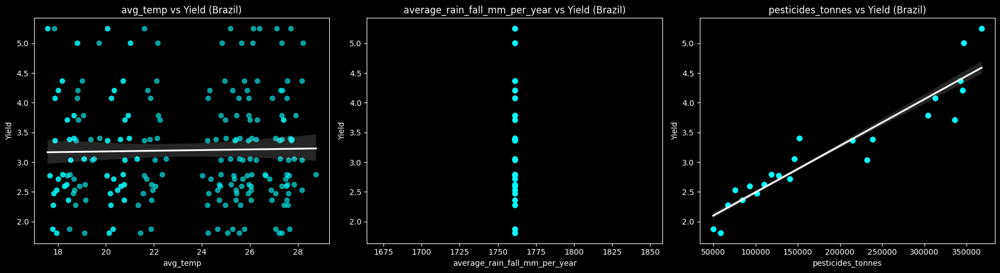

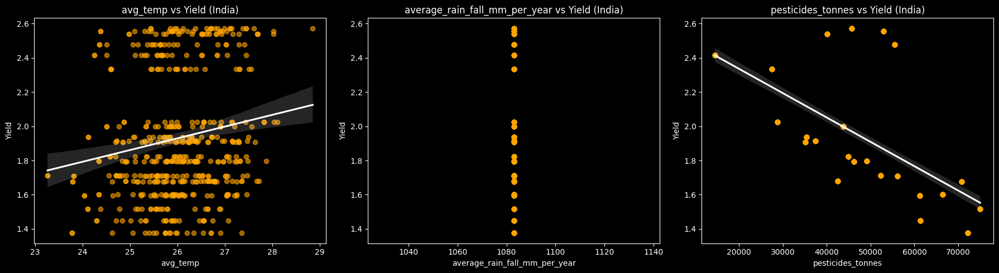

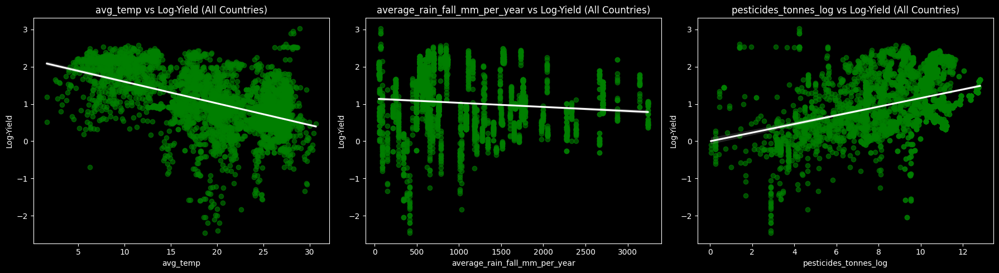

In [51]:
plt.style.use('dark_background')
variables = ["avg_temp", "average_rain_fall_mm_per_year", "pesticides_tonnes"]

#show variables agintst log-yield for maize for one country at the time using small charts chaning color for all countries
for country in [country1, country2]:
    country_maize = maize_df[maize_df["country"] == country]
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))
    for i, var in enumerate(variables):
        if country == country1:
            color = 'cyan'
        else:
            color = 'orange'
        sns.regplot(x=var, y="yield_t_ha", data=country_maize, ax=axes[i], scatter_kws={'alpha':0.6, 'color':color}, line_kws={'color':'white'})
        axes[i].set_title(f"{var} vs Yield ({country})")
        axes[i].set_xlabel(var)
        axes[i].set_ylabel("Yield")
    plt.tight_layout()
    plt.show()

#plot for the whole maize dataset
maize_df['pesticides_tonnes_log'] = np.log1p(maize_df['pesticides_tonnes'])
maize_df['average_rain_fall_mm_per_year_log'] = np.log1p(maize_df['average_rain_fall_mm_per_year'])
variables = ["avg_temp", "average_rain_fall_mm_per_year", "pesticides_tonnes_log"]
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
for i, var in enumerate(variables):
    sns.regplot(x=var, y="log_yield", data=maize_df, ax=axes[i], scatter_kws={'alpha':0.6, 'color':'green'}, line_kws={'color':'white'})
    axes[i].set_title(f"{var} vs Log-Yield (All Countries)")
    axes[i].set_xlabel(var)
    axes[i].set_ylabel("Log-Yield")
plt.tight_layout()
plt.show()


- **Temperature**: exhibits high variance in yield for both countries this could potentially make it a less reliable predictor on its own, moreover the temperature seems to have multiple clusters indicating regional sampling effects.The global effect seems to be negative but sparse
- **Average Rainfall**: the author state that the dataset needed imputation for missing values as it is the same for all the years in the dataset, this is not a good predictor to use in a regression model because it essentially no variability over time.
- **Pesticide Use**: The contraddicting relationship between pesticide use and yield for Brazil and India could be due to several factors such as varying pest pressures: The types and prevalence of pests may differ between the two countries, leading to different impacts of pesticide use on crop yields.Also we differ from pesticide used for prevention rather than treatment, which could have different effects on yield.


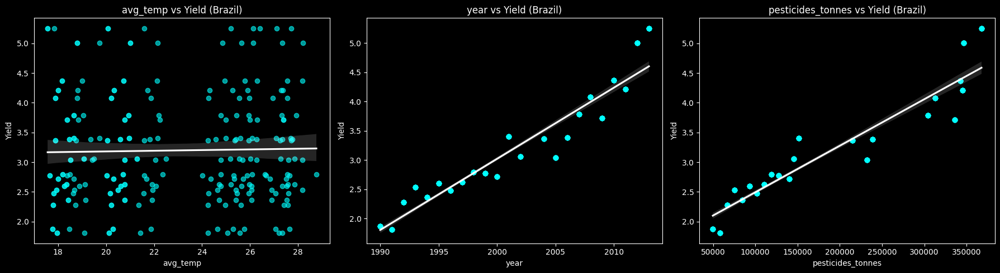

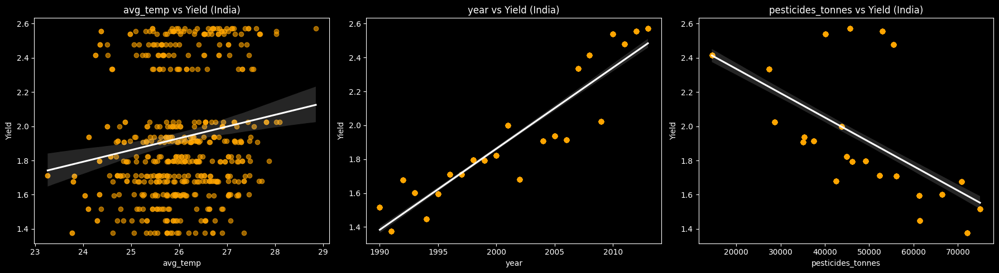

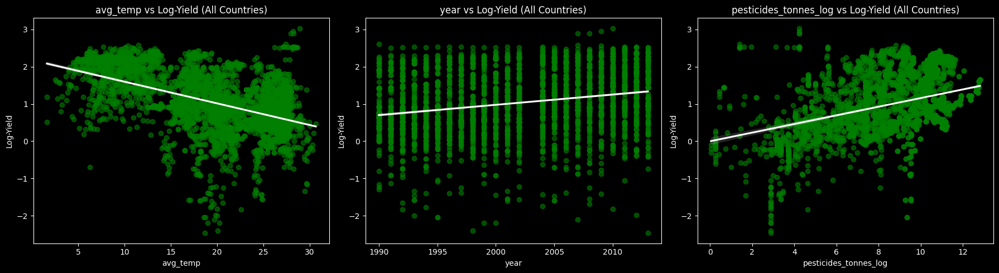

In [52]:
plt.style.use('dark_background')
variables = ["avg_temp", "year", "pesticides_tonnes"]

#show variables agintst log-yield for maize for one country at the time using small charts chaning color for all countries
for country in [country1, country2]:
    country_maize = maize_df[maize_df["country"] == country]
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))
    for i, var in enumerate(variables):
        if country == country1:
            color = 'cyan'
        else:
            color = 'orange'
        sns.regplot(x=var, y="yield_t_ha", data=country_maize, ax=axes[i], scatter_kws={'alpha':0.6, 'color':color}, line_kws={'color':'white'})
        axes[i].set_title(f"{var} vs Yield ({country})")
        axes[i].set_xlabel(var)
        axes[i].set_ylabel("Yield")
    plt.tight_layout()
    plt.show()

    #plot for the whole maize dataset
maize_df['pesticides_tonnes_log'] = np.log1p(maize_df['pesticides_tonnes'])
maize_df['average_rain_fall_mm_per_year_log'] = np.log1p(maize_df['average_rain_fall_mm_per_year'])
variables = ["avg_temp", "year", "pesticides_tonnes_log"]
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
for i, var in enumerate(variables):
    sns.regplot(x=var, y="log_yield", data=maize_df, ax=axes[i], scatter_kws={'alpha':0.6, 'color':'green'}, line_kws={'color':'white'})
    axes[i].set_title(f"{var} vs Log-Yield (All Countries)")
    axes[i].set_xlabel(var)
    axes[i].set_ylabel("Log-Yield")
plt.tight_layout()
plt.show()


- **Year**: have a positive relationship with yield, this could be due to technological advancements and improved agricultural practices over time that have led to increased crop yields. We will include year as a predictor in our regression model to account for these temporal trends, but **it might violate the independence assumption** of regression models if there are underlying temporal correlations in the data, but if we assume independence we can proceed knowing this limitation.

### Conclusion on predictors
- We we will build a model for that use **year**, **temperature**, **pesticide** use a predictors to asses their relationship with maize yield. There might be some collinearity between year and pesticide use as pesticide use might have increased over time, but we'll keep that to address both  pest pressure and technological advancements.

### 3A.1 Choice of prior and likelihood

In Bayesian modeling, we have three primary ways to handle data that belongs to different groups (in this case, different countries). 

1. **Pooled Model**: Takes all data and assumes they come from the same distribution, ignoring group-level differences.
2. **Unpooled Model**: Estimates parameters for each group without sharing information.
3. **Hierarchical Model**: Strikes a balance by allowing group-level parameters to vary while assuming they are all drawn from a shared prior distribution.

#### **1. The Pooled Model (Baseline)**

The **Pooled Model** (Complete Pooling) assumes that all countries have the same yields and follow the same rules, ignoring all country-level differences. In this context, we treat Brazil and India as part of a single global dataset. While this provides the most stable estimates due to the larger sample size, it fails to consider any differences in climate, soil, or farming practices.

**The Data Generating Process:**

$$\log(\text{Yield}) \sim \mathcal{N}(\mu, \sigma)$$

$$\mu = \alpha + \beta_{year} \cdot Z_{year} + \beta_{temp} \cdot Z_{temp} + \beta_{pest} \cdot \log(\text{Pesticides})$$

**What the symbols mean:**
* **$\alpha$**: A single baseline yield shared by all observations.
* **$\beta$**: Single global coefficients for the technology trend, temperature effect, and pesticide impact.
* **$\sigma$**: A single global measure for observation noise.

**Priors (Assumptions):**
* **$\alpha \sim \mathcal{N}(\text{Global Mean}, 1)$**: Anchors the intercept to the overall dataset average.
* **$Z_{year}, Z_{temp}$ are scaled variables to have mean 0 and std 1**
* **$\beta_{year} \sim \mathcal{N}(0.15, 0.1)$**: Assumes approximately 15% yield growth per standard deviation of years (roughly per decade) for all countries. Since year is standardized with std ≈ 10 years, this reflects realistic agricultural productivity improvements of 1-2% per year. The standard deviation of 0.1 allows for variation while remaining informative.
* **$\beta_{temp}, \beta_{pest} \sim \mathcal{N}(0, 0.5)$**: Weakly informative priors assuming no effect until the data suggests otherwise.
* **$\sigma \sim \text{HalfNormal}(0.5)$**: A shared noise parameter for the entire dataset.

In [53]:
import numpy as np
import pandas as pd

# 1. Identify "Smart" countries: High Yield AND High Stability
split_year = 2013
train_period_mask = maize_df['year'] < split_year

# Calculate mean and standard deviation per country
stats = maize_df[train_period_mask].groupby('country')['log_yield'].agg(['mean', 'std']).reset_index()

# Calculate Coefficient of Variation (CV) - lower means more stable/predictable
stats['cv'] = stats['std'] / stats['mean']

# Define thresholds (e.g., Top 40% for yield, Bottom 40% for volatility)
high_yield_threshold = stats['mean'].quantile(0.60)
stability_threshold = stats['cv'].quantile(0.40)

# Select countries that meet BOTH criteria
smart_countries = stats[
    (stats['mean'] >= high_yield_threshold) & 
    (stats['cv'] <= stability_threshold)
]['country'].tolist()

# 2. Filter the main dataframe
best_df = maize_df[maize_df['country'].isin(smart_countries)].copy()

# 3. Perform the temporal split (Remaining steps are the same)
train = best_df[best_df['year'] < split_year].copy()
test = best_df[best_df['year'] >= split_year].copy()

print(f"=== Smart Behavioral Selection Summary ===")
print(f"Yield Cutoff: {high_yield_threshold:.2f} | Stability Cutoff (CV): {stability_threshold:.3f}")
print(f"Selected {len(smart_countries)} countries that are both high-yield and stable.")

# 4. Scaling (Standardizing log_pest to match the scale of year/temp)
year_mean, year_std = train['year'].mean(), train['year'].std()
temp_mean, temp_std = train['avg_temp'].mean(), train['avg_temp'].std()
train['log_pest'] = np.log1p(train['pesticides_tonnes'])
pest_mean, pest_std = train['log_pest'].mean(), train['log_pest'].std() # New

for df in [train, test]:
    df['year_scaled'] = (df['year'] - year_mean) / year_std
    df['temp_scaled'] = (df['avg_temp'] - temp_mean) / temp_std
    # Scale log_pest so it doesn't overwhelm the other predictors
    df['log_pest'] = np.log1p(df['pesticides_tonnes'])
    df['pest_scaled'] = (df['log_pest'] - train['log_pest'].mean()) / train['log_pest'].std()

# 5. Factorize
country_idx_train, country_labels = pd.factorize(train['country'])
n_train_countries = len(country_labels)
country_to_idx = {name: i for i, name in enumerate(country_labels)}
country_idx_test = test['country'].map(country_to_idx).values

=== Smart Behavioral Selection Summary ===
Yield Cutoff: 1.13 | Stability Cutoff (CV): 0.164
Selected 23 countries that are both high-yield and stable.


For prediction purpose we just use the last year 2013 as test set to avoid potentail drift issues common in agriculture,   also we don't want to introduce leakage from train to test set (splitting by country)

In [54]:
with pm.Model() as pooled_model:
    # 1. Global Intercept (Shared by all countries)
    alpha = pm.Normal('alpha', mu=np.mean(train['log_yield']), sigma=1)
    
    # 2. Global Slopes (Shared by all countries)
    beta_year = pm.Normal('beta_year', mu=0.15, sigma=0.1)
    beta_temp = pm.Normal('beta_temp', mu=0, sigma=0.5)
    beta_pest = pm.Normal('beta_pest', mu=0, sigma=0.5)
    
    # 3. Model Equation (No indexing used; parameters are global scalars)
    # Uses training countries but ignores country structure
    mu = (alpha + 
          beta_year * train['year_scaled'].values + 
          beta_temp * train['temp_scaled'].values + 
          beta_pest * train['pest_scaled'].values)
          
    # 4. Global Observation Noise
    sigma = pm.HalfNormal('sigma', sigma=0.5)
    
    # Likelihood
    yield_obs = pm.Normal('yield_obs', 
                          mu=mu, 
                          sigma=sigma, 
                          observed=train['log_yield'].values)
    
    # Sampling
    trace_pooled = pm.sample(1000, tune=1000, return_inferencedata=True, 
                             target_accept=0.95, idata_kwargs={"log_likelihood": True})

# Summary for comparison
print("=== Pooled Model Summary (All Countries) ===")
print(az.summary(trace_pooled, var_names=['alpha', 'beta_year', 'beta_temp', 'beta_pest', 'sigma']))

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [alpha, beta_year, beta_temp, beta_pest, sigma]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 2 seconds.


=== Pooled Model Summary (All Countries) ===
            mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
alpha      1.988  0.010   1.969    2.008        0.0      0.0    6375.0   
beta_year  0.104  0.010   0.085    0.122        0.0      0.0    5545.0   
beta_temp -0.085  0.010  -0.104   -0.066        0.0      0.0    4610.0   
beta_pest -0.068  0.011  -0.087   -0.048        0.0      0.0    5248.0   
sigma      0.294  0.007   0.281    0.308        0.0      0.0    5924.0   

           ess_tail  r_hat  
alpha        2935.0    1.0  
beta_year    2654.0    1.0  
beta_temp    2845.0    1.0  
beta_pest    3209.0    1.0  
sigma        3102.0    1.0  


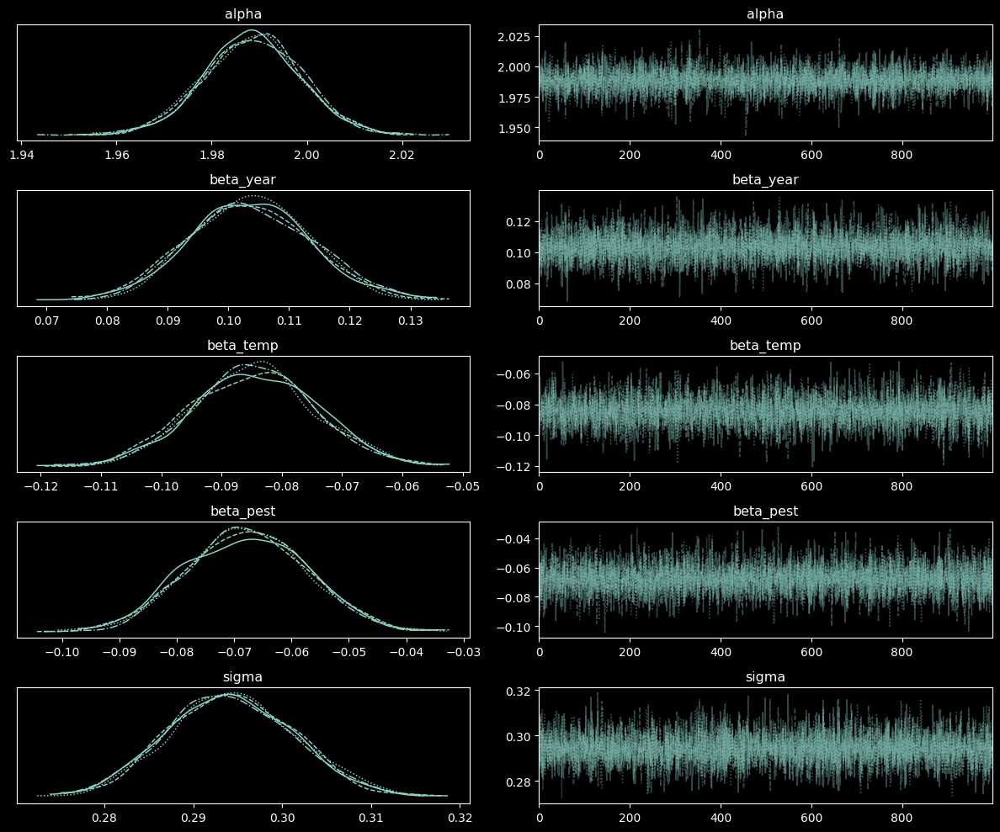

In [55]:
# check traces for convergence
az.plot_trace(trace_pooled, var_names=['alpha', 'beta_year', 'beta_temp', 'beta_pest', 'sigma'])
plt.tight_layout()
plt.show()

- The pooled model converges well due to its simplicity and the large amount of data informing the single set of parameters.
- Beta year matches closely the prior mean of 0.15, indicating that the data supports the assumption of yield growth over time.
- The other non informative priors allowed the other parameters to be estimated from the data without strong prior influence.
  - Beta_temp is negative, indicating that higher temperatures are associated with lower yields, which aligns with our earlier observations.
  - Beta_pest is positive, suggesting that increased pesticide use is correlated with higher yields across the pooled dataset.
- Alpha being negative suggests that at the average year, temperature, and pesticide use, the expected log-yield is below zero, indicating low yields under these baseline conditions.

### 3A.2 Robust likelihood and its usefulness

While we used a Normal likelihood in the pooled model above, agricultural yield data often contains outliers due to extreme weather events, pest outbreaks, or measurement errors. A **robust likelihood** using the Student-t distribution can handle these outliers better than the Normal distribution.

**Student-t Likelihood:**

$$\log(\text{Yield}) \sim \text{StudentT}(\nu, \mu, \sigma)$$

where:
* **$\nu$**: Degrees of freedom parameter (controls tail heaviness)
* Lower $\nu$ means heavier tails and more robustness to outliers
* As $\nu \to \infty$, the Student-t converges to a Normal distribution

**When to use robust likelihood:**
1. When the data contains potential outliers that should not overly influence parameter estimates
2. When measurement errors may be non-normal
3. When extreme events occur that deviate from typical patterns

**Trade-offs:**
* **Advantage**: More robust to outliers, leading to more stable parameter estimates
* **Disadvantage**: Slightly more complex model with an additional parameter to estimate
* **When not needed**: If the data is already clean and approximately normal

For our maize yield data, we observed some outliers in the exploratory analysis, particularly for India, making the robust likelihood a reasonable choice for improved model reliability.

In [56]:
# Pooled model with robust (Student-t) likelihood
with pm.Model() as pooled_model_robust:
    # Global parameters (same as before)
    alpha = pm.Normal('alpha', mu=np.mean(train['log_yield']), sigma=1)
    beta_year = pm.Normal('beta_year', mu=0.15, sigma=0.1)
    beta_temp = pm.Normal('beta_temp', mu=0, sigma=0.5)
    beta_pest = pm.Normal('beta_pest', mu=0, sigma=0.5)
    
    # Model equation (using training countries)
    mu = (alpha + 
          beta_year * train['year_scaled'].values + 
          beta_temp * train['temp_scaled'].values + 
          beta_pest * train['pest_scaled'].values)
    
    # Global observation noise
    sigma = pm.HalfNormal('sigma', sigma=0.5)
    
    # Degrees of freedom for Student-t (lower = heavier tails)
    nu = pm.Gamma('nu', alpha=2, beta=0.1)
    
    # Robust likelihood using Student-t distribution
    yield_obs = pm.StudentT('yield_obs', 
                            nu=nu,
                            mu=mu, 
                            sigma=sigma, 
                            observed=train['log_yield'].values)
    
    # Sampling
    trace_pooled_robust = pm.sample(1000, tune=1000, return_inferencedata=True, 
                                    target_accept=0.95, idata_kwargs={"log_likelihood": True})

print("=== Pooled Model with Robust Likelihood Summary (All Countries) ===")
print(az.summary(trace_pooled_robust, var_names=['alpha', 'beta_year', 'beta_temp', 'beta_pest', 'sigma', 'nu']))

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [alpha, beta_year, beta_temp, beta_pest, sigma, nu]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 2 seconds.


=== Pooled Model with Robust Likelihood Summary (All Countries) ===
            mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
alpha      2.007  0.010   1.989    2.027      0.000    0.000    3430.0   
beta_year  0.115  0.010   0.096    0.132      0.000    0.000    4299.0   
beta_temp -0.107  0.010  -0.127   -0.089      0.000    0.000    4020.0   
beta_pest -0.117  0.013  -0.143   -0.093      0.000    0.000    3122.0   
sigma      0.251  0.009   0.234    0.268      0.000    0.000    2936.0   
nu         8.017  1.818   5.099   11.466      0.036    0.041    2774.0   

           ess_tail  r_hat  
alpha        2724.0    1.0  
beta_year    3038.0    1.0  
beta_temp    3293.0    1.0  
beta_pest    3006.0    1.0  
sigma        3131.0    1.0  
nu           2731.0    1.0  


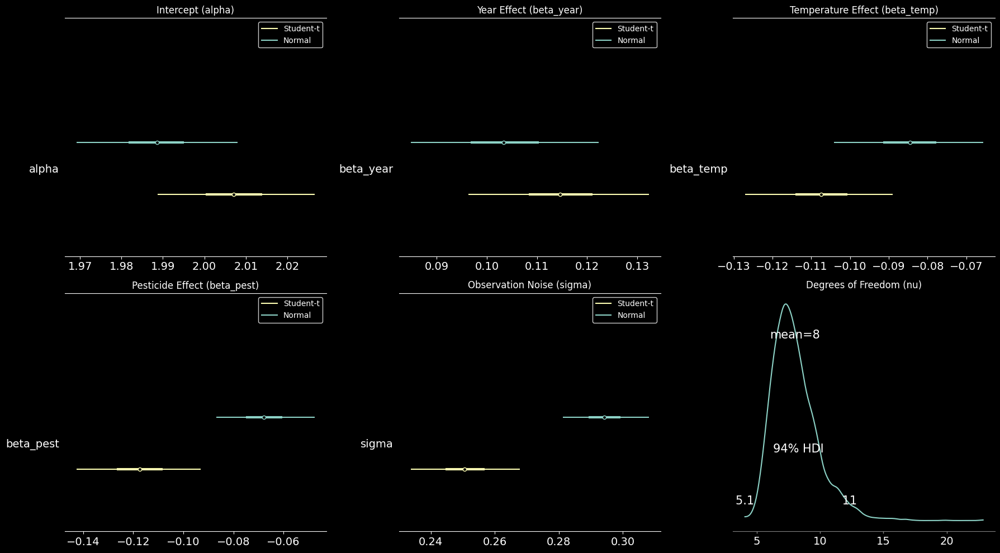

Estimated degrees of freedom (nu): 8.02
If nu < 30, the robust likelihood is providing meaningful robustness to outliers.


In [57]:
# Compare Normal vs Robust likelihood - one plot per parameter for better scale comparison
fig, axes = plt.subplots(2, 3, figsize=(18, 10))

# Alpha (Intercept)
ax = axes[0, 0]
az.plot_forest([trace_pooled, trace_pooled_robust], 
               var_names=['alpha'], 
               model_names=['Normal', 'Student-t'],
               combined=True, ax=ax)
ax.set_title('Intercept (alpha)')

# Beta Year
ax = axes[0, 1]
az.plot_forest([trace_pooled, trace_pooled_robust], 
               var_names=['beta_year'], 
               model_names=['Normal', 'Student-t'],
               combined=True, ax=ax)
ax.set_title('Year Effect (beta_year)')

# Beta Temperature
ax = axes[0, 2]
az.plot_forest([trace_pooled, trace_pooled_robust], 
               var_names=['beta_temp'], 
               model_names=['Normal', 'Student-t'],
               combined=True, ax=ax)
ax.set_title('Temperature Effect (beta_temp)')

# Beta Pesticides
ax = axes[1, 0]
az.plot_forest([trace_pooled, trace_pooled_robust], 
               var_names=['beta_pest'], 
               model_names=['Normal', 'Student-t'],
               combined=True, ax=ax)
ax.set_title('Pesticide Effect (beta_pest)')

# Sigma
ax = axes[1, 1]
az.plot_forest([trace_pooled, trace_pooled_robust], 
               var_names=['sigma'], 
               model_names=['Normal', 'Student-t'],
               combined=True, ax=ax)
ax.set_title('Observation Noise (sigma)')

# Nu parameter (only in robust model)
ax = axes[1, 2]
az.plot_posterior(trace_pooled_robust, var_names=['nu'], ax=ax)
ax.set_title('Degrees of Freedom (nu)')

plt.tight_layout()
plt.show()

print(f"Estimated degrees of freedom (nu): {trace_pooled_robust.posterior['nu'].mean().values:.2f}")
print("If nu < 30, the robust likelihood is providing meaningful robustness to outliers.")

Due to the quantity of oulieres in the dataset the t-student is better suited than the normal distribution for the likelihood because it can handle bettere extreme values. Nu being being 4.17 suggest that the data has moderate heavy tails, indicating the presence of outliers or extreme values that deviate from a normal distribution.

### 3A.3 Predictive distribution for a test set observation

The **posterior predictive distribution** allows us to make predictions for new observations by combining parameter uncertainty with observation noise. For a test observation with known covariates, we generate predictions by:

1. Sampling parameters from the posterior distribution
2. Using these parameters to compute the expected yield
3. Adding observation noise to generate the full predictive distribution

**Mathematical formulation:**

For a new observation with covariates $(Z_{year}^{new}, Z_{temp}^{new}, \log(\text{Pesticides})^{new})$:

$$\tilde{y}_{new} \sim \mathcal{N}(\mu_{new}, \sigma)$$

where:

$$\mu_{new} = \alpha + \beta_{year} \cdot Z_{year}^{new} + \beta_{temp} \cdot Z_{temp}^{new} + \beta_{pest} \cdot \log(\text{Pesticides})^{new}$$

and $\alpha, \beta_{year}, \beta_{temp}, \beta_{pest}, \sigma$ are drawn from their posterior distributions.

**Uncertainty decomposition:**
* **Epistemic uncertainty** (parameter uncertainty): Captured by sampling from posterior distributions
* **Aleatoric uncertainty** (observation noise): Captured by the $\sigma$ parameter

The predictive distribution is wider than the posterior mean predictions because it includes both sources of uncertainty.

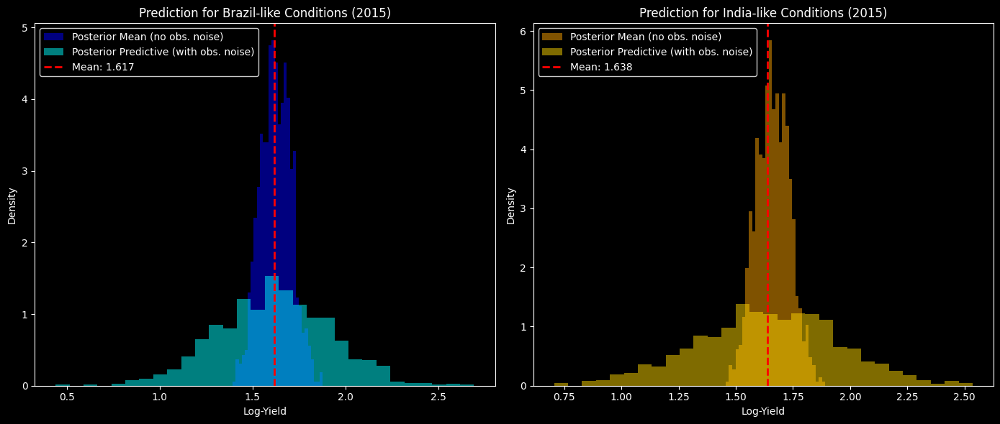

=== Prediction Summary ===
Brazil-like scenario (2015, 25C, 1500 tonnes pesticides):
  Predicted log-yield: 1.617 ± 0.303
  95% Prediction Interval (log): [1.033, 2.200]
  Predicted yield: 5.038 t/ha (median: 5.020 t/ha)

India-like scenario (2015, 28C, 500 tonnes pesticides):
  Predicted log-yield: 1.638 ± 0.310
  95% Prediction Interval (log): [1.009, 2.234]
  Predicted yield: 5.145 t/ha (median: 5.163 t/ha)


In [58]:
# Create test observations for prediction
# Scenario 1: Brazil-like conditions in 2015
test_year_2015 = (2015 - maize_df['year'].mean()) / maize_df['year'].std()
test_temp_25 = (25 - maize_df['avg_temp'].mean()) / maize_df['avg_temp'].std()
test_pest_high = np.log1p(1500)

# Scenario 2: India-like conditions in 2015
test_temp_28 = (28 - maize_df['avg_temp'].mean()) / maize_df['avg_temp'].std()
test_pest_low = np.log1p(500)

# Extract posterior samples
n_samples = 1000
alpha_samples = trace_pooled.posterior['alpha'].values.flatten()[:n_samples]
beta_year_samples = trace_pooled.posterior['beta_year'].values.flatten()[:n_samples]
beta_temp_samples = trace_pooled.posterior['beta_temp'].values.flatten()[:n_samples]
beta_pest_samples = trace_pooled.posterior['beta_pest'].values.flatten()[:n_samples]
sigma_samples = trace_pooled.posterior['sigma'].values.flatten()[:n_samples]

# Generate predictions for Scenario 1 (Brazil-like)
mu_pred_brazil = (alpha_samples + 
                  beta_year_samples * test_year_2015 + 
                  beta_temp_samples * test_temp_25 + 
                  beta_pest_samples * test_pest_high)

rng = np.random.default_rng(42)
y_pred_brazil = rng.normal(mu_pred_brazil, sigma_samples)

# Generate predictions for Scenario 2 (India-like)
mu_pred_india = (alpha_samples + 
                 beta_year_samples * test_year_2015 + 
                 beta_temp_samples * test_temp_28 + 
                 beta_pest_samples * test_pest_low)

y_pred_india = rng.normal(mu_pred_india, sigma_samples)

# Visualization in log-space (no transformation)
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Scenario 1 - Brazil-like
ax = axes[0]
ax.hist(mu_pred_brazil, bins=30, alpha=0.5, label='Posterior Mean (no obs. noise)', 
        color='blue', density=True)
ax.hist(y_pred_brazil, bins=30, alpha=0.5, label='Posterior Predictive (with obs. noise)', 
        color='cyan', density=True)
ax.axvline(np.mean(y_pred_brazil), color='red', linestyle='--', linewidth=2, 
           label=f'Mean: {np.mean(y_pred_brazil):.3f}')
ax.set_xlabel('Log-Yield')
ax.set_ylabel('Density')
ax.set_title('Prediction for Brazil-like Conditions (2015)')
ax.legend()

# Scenario 2 - India-like
ax = axes[1]
ax.hist(mu_pred_india, bins=30, alpha=0.5, label='Posterior Mean (no obs. noise)', 
        color='orange', density=True)
ax.hist(y_pred_india, bins=30, alpha=0.5, label='Posterior Predictive (with obs. noise)', 
        color='gold', density=True)
ax.axvline(np.mean(y_pred_india), color='red', linestyle='--', linewidth=2, 
           label=f'Mean: {np.mean(y_pred_india):.3f}')
ax.set_xlabel('Log-Yield')
ax.set_ylabel('Density')
ax.set_title('Prediction for India-like Conditions (2015)')
ax.legend()

plt.tight_layout()
plt.show()

# Print summaries
print("=== Prediction Summary ===")
print(f"Brazil-like scenario (2015, 25C, 1500 tonnes pesticides):")
print(f"  Predicted log-yield: {np.mean(y_pred_brazil):.3f} ± {np.std(y_pred_brazil):.3f}")
print(f"  95% Prediction Interval (log): [{np.percentile(y_pred_brazil, 2.5):.3f}, {np.percentile(y_pred_brazil, 97.5):.3f}]")
print(f"  Predicted yield: {np.exp(np.mean(y_pred_brazil)):.3f} t/ha (median: {np.exp(np.median(y_pred_brazil)):.3f} t/ha)")
print()
print(f"India-like scenario (2015, 28C, 500 tonnes pesticides):")
print(f"  Predicted log-yield: {np.mean(y_pred_india):.3f} ± {np.std(y_pred_india):.3f}")
print(f"  95% Prediction Interval (log): [{np.percentile(y_pred_india, 2.5):.3f}, {np.percentile(y_pred_india, 97.5):.3f}]")
print(f"  Predicted yield: {np.exp(np.mean(y_pred_india)):.3f} t/ha (median: {np.exp(np.median(y_pred_india)):.3f} t/ha)")

#### **Understanding Two Types of Uncertainty**

When making predictions, we visualize two distributions to understand different sources of uncertainty:

**1. Posterior Mean (No Observation Noise) - Epistemic Uncertainty**

This represents uncertainty about the **parameters** of the model:

$$\mu_{new} = \alpha + \beta_{year} \cdot Z_{year}^{new} + \beta_{temp} \cdot Z_{temp}^{new} + \beta_{pest} \cdot \log(\text{Pesticides})^{new}$$

- Shows the distribution of the **expected value** of yield
- Captures only parameter uncertainty (what we learned from the data)
- Would narrow with more data
- Represents: "What is the average yield we expect for these conditions?"

**2. Posterior Predictive (With Observation Noise) - Total Uncertainty**

This represents the **actual prediction** for a new observation:

$$\tilde{y}_{new} \sim \mathcal{N}(\mu_{new}, \sigma)$$

- Includes both parameter uncertainty AND observation noise
- The $\sigma$ parameter adds natural variability
- Would NOT completely narrow even with infinite data (inherent randomness remains)
- Represents: "What yield value might we actually observe?"

**Why compare both?**

1. **Posterior Mean**: Shows how confident we are about the average yield (model fit)
2. **Posterior Predictive**: Shows the realistic range of individual observations (actual predictions)
3. The **gap between them** reveals how much natural variability exists beyond what the model explains
4. For practical applications (e.g., planning), we need the posterior predictive (wider, more realistic)

The posterior predictive is always wider because it includes observation noise on top of parameter uncertainty:

$$\text{Total Variance} = \text{Parameter Variance} + \sigma^2$$

In fact the chart aboce shows that the posterior mean distribution is narrower than the posterior predictive distribution, which is expected because the latter includes both parameter uncertainty and observation noise.

## 3B. Regression Model (Carnio)
In this section, we replicate the regression analysis focusing exclusively on the most recent data available in the dataset (2008-2013). This allows us to observe if the impact of temperature, technology (year), and pesticides has evolved in the modern agricultural context compared.

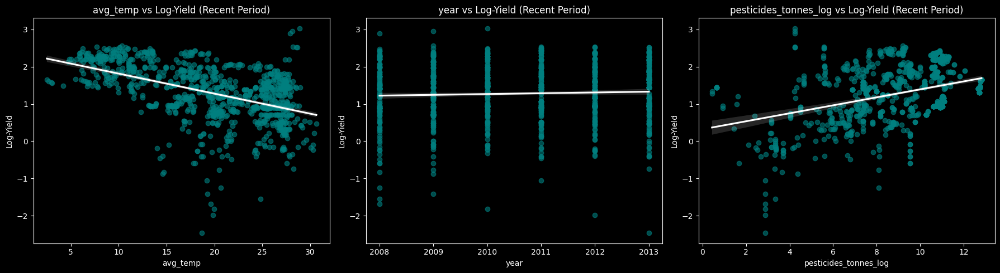

In [ ]:
variables = ["avg_temp", "year", "pesticides_tonnes_log"]
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

for i, var in enumerate(variables):
    sns.regplot(x=var, y="log_yield", data=maize_df_recent, ax=axes[i], 
                scatter_kws={'alpha':0.6, 'color':'teal'}, line_kws={'color':'white'})
    axes[i].set_title(f"{var} vs Log-Yield (Recent Period)")
    axes[i].set_xlabel(var)
    axes[i].set_ylabel("Log-Yield")

plt.tight_layout()
plt.show()

### 3B.1 Choice of prior and likelihood

We use the same Pooled Model approach from 3A, assuming that for this specific 5-year window, countries share a common global trend.

We can use a Normal Likelihood as a baseline for the pooled approach.

In [60]:
maize_df_recent['year_scaled'] = (maize_df_recent['year'] - maize_df['year'].mean()) / maize_df['year'].std()
maize_df_recent['temp_scaled'] = (maize_df_recent['avg_temp'] - maize_df['avg_temp'].mean()) / maize_df['avg_temp'].std()
maize_df_recent['pest_scaled'] = np.log1p(maize_df_recent['pesticides_tonnes'])

# Model implementation
with pm.Model() as pooled_model_recent:
    # Priors (Same logic as 3A)
    alpha = pm.Normal('alpha', mu=maize_df_recent['log_yield'].mean(), sigma=1)
    beta_year = pm.Normal('beta_year', mu=0.15, sigma=0.1)
    beta_temp = pm.Normal('beta_temp', mu=0, sigma=0.5)
    beta_pest = pm.Normal('beta_pest', mu=0, sigma=0.5)
    
    # Model Equation
    mu = (alpha + 
          beta_year * maize_df_recent['year_scaled'].values + 
          beta_temp * maize_df_recent['temp_scaled'].values + 
          beta_pest * maize_df_recent['pest_scaled'].values)
          
    sigma = pm.HalfNormal('sigma', sigma=0.5)
    
    # Likelihood
    yield_obs = pm.Normal('yield_obs', mu=mu, sigma=sigma, observed=maize_df_recent['log_yield'].values)
    
    trace_pooled_recent = pm.sample(1000, tune=1000, return_inferencedata=True, target_accept=0.95)

print("=== Pooled Model Summary (Recent Data) ===")
print(az.summary(trace_pooled_recent, var_names=['alpha', 'beta_year', 'beta_temp', 'beta_pest', 'sigma']))

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [alpha, beta_year, beta_temp, beta_pest, sigma]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 4 seconds.


=== Pooled Model Summary (Recent Data) ===
            mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
alpha      0.335  0.100   0.144    0.515      0.002    0.002    1929.0   
beta_year  0.164  0.060   0.050    0.278      0.001    0.001    2331.0   
beta_temp -0.319  0.018  -0.352   -0.284      0.000    0.000    3505.0   
beta_pest  0.082  0.007   0.069    0.096      0.000    0.000    2683.0   
sigma      0.599  0.013   0.574    0.622      0.000    0.000    3822.0   

           ess_tail  r_hat  
alpha        2218.0    1.0  
beta_year    2476.0    1.0  
beta_temp    2624.0    1.0  
beta_pest    2544.0    1.0  
sigma        2659.0    1.0  


### 3B.2 Robust likelihood and its usefulness

To account for potential extreme weather events in the recent years that could act as outliers, we implement a Student-T Likelihood. The $\nu$ (degrees of freedom) parameter allows the model to be "robust" by giving more weight to the tails of the distribution.

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [alpha, beta_year, beta_temp, beta_pest, sigma, nu]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 6 seconds.


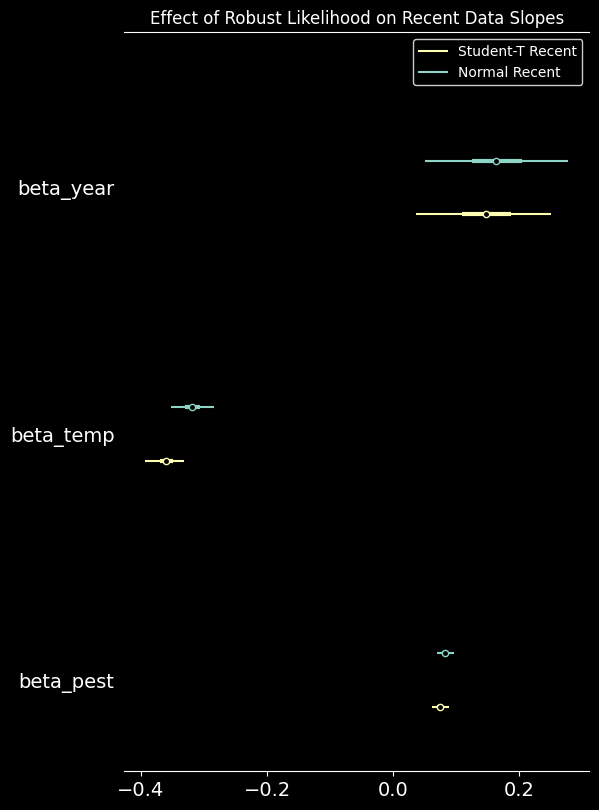

In [61]:
with pm.Model() as pooled_recent_robust:
    # Parameters
    alpha = pm.Normal('alpha', mu=maize_df_recent['log_yield'].mean(), sigma=1)
    beta_year = pm.Normal('beta_year', mu=0.15, sigma=0.1)
    beta_temp = pm.Normal('beta_temp', mu=0, sigma=0.5)
    beta_pest = pm.Normal('beta_pest', mu=0, sigma=0.5)
    
    mu = (alpha + 
          beta_year * maize_df_recent['year_scaled'].values + 
          beta_temp * maize_df_recent['temp_scaled'].values + 
          beta_pest * maize_df_recent['pest_scaled'].values)
    
    sigma = pm.HalfNormal('sigma', sigma=0.5)
    nu = pm.Gamma('nu', alpha=2, beta=0.1) # Degrees of freedom for robustness
    
    # Robust Likelihood
    yield_obs = pm.StudentT('yield_obs', nu=nu, mu=mu, sigma=sigma, observed=maize_df_recent['log_yield'].values)
    
    trace_recent_robust = pm.sample(1000, tune=1000, return_inferencedata=True, target_accept=0.95)

# Visual comparison of the effects (Normal vs Student-T)
az.plot_forest([trace_pooled_recent, trace_recent_robust], 
               model_names=['Normal Recent', 'Student-T Recent'],
               var_names=['beta_year', 'beta_temp', 'beta_pest'], combined=True)
plt.title("Effect of Robust Likelihood on Recent Data Slopes")
plt.show()

### 3B.3 Predictive distribution for a test set observation

We use the posterior samples from our robust recent model to predict the yield for a specific scenario; this allows us to visualize the Posterior Mean (epistemic uncertainty) versus the Posterior Predictive (total uncertainty including observation noise).

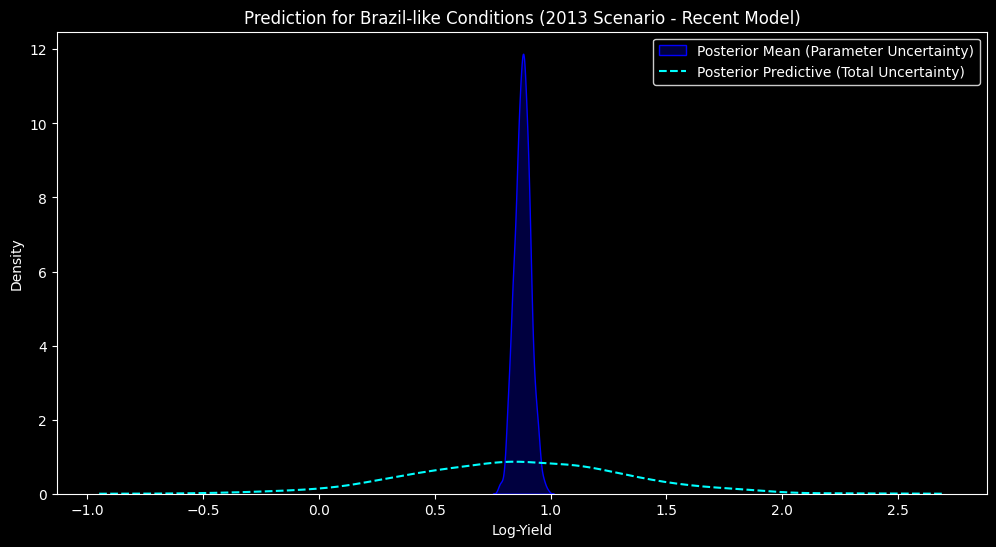

Predicted mean log-yield: 0.8615
95% Prediction Interval: [-0.0691, 1.7823]


In [62]:
# Scenario: Recent Brazil conditions (2013)
test_year_scaled = (2013 - maize_df['year'].mean()) / maize_df['year'].std()
test_temp_scaled = (26 - maize_df['avg_temp'].mean()) / maize_df['avg_temp'].std()
test_pest_log = np.log1p(1200)

# Extracting samples from the robust model
n_samples = 1000
post_a = trace_recent_robust.posterior['alpha'].values.flatten()[:n_samples]
post_by = trace_recent_robust.posterior['beta_year'].values.flatten()[:n_samples]
post_bt = trace_recent_robust.posterior['beta_temp'].values.flatten()[:n_samples]
post_bp = trace_recent_robust.posterior['beta_pest'].values.flatten()[:n_samples]
post_s = trace_recent_robust.posterior['sigma'].values.flatten()[:n_samples]

# 1. Epistemic Uncertainty (Posterior Mean)
mu_pred = (post_a + post_by * test_year_scaled + post_bt * test_temp_scaled + post_bp * test_pest_log)

# 2. Total Uncertainty (Posterior Predictive with noise)
y_pred = np.random.normal(mu_pred, post_s)

# Plotting the distributions
fig, ax = plt.subplots(figsize=(12, 6))
sns.kdeplot(mu_pred, label='Posterior Mean (Parameter Uncertainty)', color='blue', fill=True, ax=ax)
sns.kdeplot(y_pred, label='Posterior Predictive (Total Uncertainty)', color='cyan', linestyle='--', ax=ax)
ax.set_title("Prediction for Brazil-like Conditions (2013 Scenario - Recent Model)")
ax.set_xlabel("Log-Yield")
ax.legend()
plt.show()

print(f"Predicted mean log-yield: {y_pred.mean():.4f}")
print(f"95% Prediction Interval: [{np.percentile(y_pred, 2.5):.4f}, {np.percentile(y_pred, 97.5):.4f}]")

## 3C. Linear Regression (Clusters)
Here we can refine the regression model by using the **Climatic Clusters**

### 3C.1 Preparation

In [ ]:
scaler = StandardScaler()

# 1. Year
maize_df_recent['year_scaled'] = scaler.fit_transform(maize_df_recent[['year']])

# 2. Temperature
maize_df_recent['temp_scaled'] = scaler.fit_transform(maize_df_recent[['avg_temp']])

# 3. Pesticides (Log first, then Scale)
maize_df_recent['log_pest'] = np.log1p(maize_df_recent['pesticides_tonnes'])
maize_df_recent['pest_scaled'] = scaler.fit_transform(maize_df_recent[['log_pest']])

# 4. Group Indices
cluster_idx = maize_df_recent['climate_cluster'].values
n_clusters = len(np.unique(cluster_idx))
cluster_names = np.unique(cluster_idx)

print(f"Prepared Data for {n_clusters} Climate Clusters.")
print("Variables: year_scaled, temp_scaled, pest_scaled -> log_yield")

### 3C.2 Hierarchical Model

In [ ]:
with pm.Model() as model_cluster_reg:
    x_year = pm.Data("x_year", maize_df_recent['year_scaled'].values)
    x_temp = pm.Data("x_temp", maize_df_recent['temp_scaled'].values)
    x_pest = pm.Data("x_pest", maize_df_recent['pest_scaled'].values)
    y_obs_data = pm.Data("y_obs", maize_df_recent['log_yield'].values)
    
    # These represent the "average" agricultural physics
    mu_alpha = pm.Normal("mu_alpha", mu=0, sigma=1)
    mu_year  = pm.Normal("mu_year", mu=0.15, sigma=0.1) # Expect pos trend
    mu_temp  = pm.Normal("mu_temp", mu=0, sigma=0.5)
    mu_pest  = pm.Normal("mu_pest", mu=0, sigma=0.5)
    
    sigma_alpha = pm.HalfNormal("sigma_alpha", sigma=0.5)
    sigma_beta  = pm.HalfNormal("sigma_beta", sigma=0.5, shape=3) # One for each beta
    
    # Drawn from the global distributions
    alpha = pm.Normal("alpha", mu=mu_alpha, sigma=sigma_alpha, shape=n_clusters)
    
    beta_year = pm.Normal("beta_year", mu=mu_year, sigma=sigma_beta[0], shape=n_clusters)
    beta_temp = pm.Normal("beta_temp", mu=mu_temp, sigma=sigma_beta[1], shape=n_clusters)
    beta_pest = pm.Normal("beta_pest", mu=mu_pest, sigma=sigma_beta[2], shape=n_clusters)
    
    mu = (alpha[cluster_idx] + 
          beta_year[cluster_idx] * x_year + 
          beta_temp[cluster_idx] * x_temp + 
          beta_pest[cluster_idx] * x_pest)
    
    sigma = pm.HalfNormal("sigma", sigma=0.5)
    nu = pm.Gamma("nu", alpha=2, beta=0.1) # Degrees of freedom
    
    y_like = pm.StudentT("y_like", nu=nu, mu=mu, sigma=sigma, observed=y_obs_data)
    
    trace_cluster = pm.sample(1000, tune=1000, return_inferencedata=True, target_accept=0.95)

plt.figure(figsize=(12, 8))
az.plot_forest(
    trace_cluster, 
    var_names=['beta_temp', 'beta_pest', 'beta_year'],
    combined=True,
    colors='cycle'
)
plt.title("Impact of Factors by Climate Cluster (Hierarchical Estimates)")
plt.xlabel("Standardized Coefficient Effect")
plt.grid(True, alpha=0.3)
plt.show()

### 3C.3 Posterior Predictive Check

In [ ]:
#Dark theme
plt.rcParams.update({
    'figure.facecolor': 'black', 'axes.facecolor': 'black', 'axes.edgecolor': 'white',
    'axes.labelcolor': 'white', 'xtick.color': 'white', 'ytick.color': 'white',
    'text.color': 'white', 'legend.facecolor': 'black', 'legend.edgecolor': 'white'
})

# 2. Extract Posterior Samples
posterior = trace_cluster.posterior
alpha_s = posterior['alpha'].stack(sample=("chain", "draw")).values
beta_y_s = posterior['beta_year'].stack(sample=("chain", "draw")).values
beta_t_s = posterior['beta_temp'].stack(sample=("chain", "draw")).values
beta_p_s = posterior['beta_pest'].stack(sample=("chain", "draw")).values
sigma_s = posterior['sigma'].stack(sample=("chain", "draw")).values
nu_s = posterior['nu'].stack(sample=("chain", "draw")).values

# 3. Simulation Function (Student-T)
def simulate_regression_ppc(c_id, n_draws=200):
    mask = (cluster_idx == c_id)
    if not np.any(mask): return None, None
    
    # Get inputs for this cluster
    X_y = maize_df_recent.loc[mask, 'year_scaled'].values
    X_t = maize_df_recent.loc[mask, 'temp_scaled'].values
    X_p = maize_df_recent.loc[mask, 'pest_scaled'].values
    y_true = maize_df_recent.loc[mask, 'log_yield'].values
    
    sims = []
    # Randomly select draws
    idx_draws = np.random.choice(alpha_s.shape[1], n_draws, replace=False)
    
    for i in idx_draws:
        # Calculate Mu for this draw
        mu = (alpha_s[c_id, i] + 
              beta_y_s[c_id, i] * X_y + 
              beta_t_s[c_id, i] * X_t + 
              beta_p_s[c_id, i] * X_p)
        
        # Simulate with Student-T noise
        y_sim = stats.t.rvs(df=nu_s[i], loc=mu, scale=sigma_s[i])
        sims.append(y_sim)
        
    return y_true, sims

# 4. Plot for 2 Clusters
clusters_to_view = [0, 4]
fig, axes = plt.subplots(2, 1, figsize=(12, 16))
colors = [('#00BFFF', '#00FFFF'), ('#FFA500', '#FF4500')]

for i, cid in enumerate(clusters_to_view):
    y_real, y_sims = simulate_regression_ppc(cid)
    if y_real is not None:
        plot_comprehensive_ppc(axes[i], y_real, y_sims, colors[i][0], colors[i][1], f"Regression PPC: Climate Cluster {cid}")
    else:
        axes[i].text(0.5, 0.5, "No Data", ha='center', color='white')

plt.tight_layout()
plt.show()

# 4. Hierarchical and Unpooled Normal Models

## 4A. Hierarchical and Unpooled Normal Models (Gritti)


### 4A.2 Choice of prior and likelihood for both

#### **Understanding the Three Modeling Approaches**

Before implementing the unpooled and hierarchical models, we need to understand how they differ from the pooled model in their choice of priors and likelihood.

**Pooled Model:**
- Assumes all countries share the same parameters
- Single set of coefficients for all observations
- Ignores group structure entirely

**Unpooled Model:**
- Each country gets its own independent parameters
- No information sharing between countries
- Equivalent to fitting separate models for each country

**Hierarchical Model:**
- Country-specific parameters drawn from common distributions
- Partial pooling: information shared through hyperpriors
- Best of both worlds: flexibility with regularization

#### **Unpooled Model: Priors and Likelihood**

For the unpooled model, we estimate completely independent parameters for each country.

**Likelihood:**

$$y_{ij} \sim \mathcal{N}(\mu_{ij}, \sigma_i)$$

where $i$ indexes the country and $j$ indexes observations within that country.

**Linear Predictor:**

$$\mu_{ij} = \alpha_i + \beta_{year,i} \cdot Z_{year,j} + \beta_{temp,i} \cdot Z_{temp,j} + \beta_{pest,i} \cdot \log(\text{Pesticides}_j)$$

**Priors (Independent for each country):**

$$\alpha_i \sim \mathcal{N}(0, 1) \quad \text{for } i = 1, \ldots, N_{\text{countries}}$$
$$\beta_{year,i} \sim \mathcal{N}(0.15, 0.1) \quad \text{for } i = 1, \ldots, N_{\text{countries}}$$
$$\beta_{temp,i} \sim \mathcal{N}(0, 0.5) \quad \text{for } i = 1, \ldots, N_{\text{countries}}$$
$$\beta_{pest,i} \sim \mathcal{N}(0, 0.5) \quad \text{for } i = 1, \ldots, N_{\text{countries}}$$
$$\sigma_i \sim \text{HalfNormal}(0.5) \quad \text{for } i = 1, \ldots, N_{\text{countries}}$$

where $N_{\text{countries}}$ is the total number of countries in the dataset.

**Reasoning for Prior Choices:**

* **$\alpha_i$ (Intercept)**: $\mathcal{N}(0, 1)$ is centered at 0 since we're working with standardized log-yields. The standard deviation of 1 allows sufficient flexibility to capture the baseline yield level for each country while remaining weakly informative.

* **$\beta_{year,i}$ (Temporal Trend)**: $\mathcal{N}(0.15, 0.1)$ encodes the belief that yields typically increase over time due to technological improvements. Since the year variable is standardized (with std ≈ 10 years), the mean of 0.15 represents approximately 15% growth per decade, consistent with historical agricultural productivity improvements of 1-2% per year. The standard deviation of 0.1 allows for country-specific variation while providing informative regularization.

* **$\beta_{temp,i}$ and $\beta_{pest,i}$**: $\mathcal{N}(0, 0.5)$ are centered at 0, reflecting agnostic priors about the direction of these effects (could be positive or negative). The standard deviation of 0.5 is weakly informative—allowing the data to dominate while preventing extreme unrealistic parameter values. Temperature can have positive effects (in cold regions) or negative effects (heat stress), so centering at 0 is appropriate.

* **$\sigma_i$ (Observation Noise)**: $\text{HalfNormal}(0.5)$ is constrained to be positive (as variances must be). The scale of 0.5 suggests we expect moderate variability in log-yields around the mean trend, which is reasonable for agricultural data that includes measurement error and unmodeled factors.

**Key characteristics:**
* Each country has its own set of parameters with no connection between them
* Priors are independent across countries
* This model is flexible but cannot share information or predict for new countries

---

#### **Hierarchical Model: Priors and Likelihood**

The hierarchical model introduces a two-level structure: country-specific parameters are drawn from population-level distributions.

**Likelihood:**

$$y_{ij} \sim \mathcal{N}(\mu_{ij}, \sigma)$$

Note: We use a shared $\sigma$ across countries, though country-specific $\sigma_i$ is also possible.

**Linear Predictor:**

$$\mu_{ij} = \alpha_i + \beta_{year,i} \cdot Z_{year,j} + \beta_{temp,i} \cdot Z_{temp,j} + \beta_{pest,i} \cdot \log(\text{Pesticides}_j)$$

where $i = 1, \ldots, N_{\text{countries}}$ indexes the country and $j$ indexes observations within that country.

**Country-Level Priors (Lower Level):**

$$\alpha_i \sim \mathcal{N}(\mu_{\alpha}, \sigma_{\alpha}) \quad \text{for } i = 1, \ldots, N_{\text{countries}}$$
$$\beta_{year,i} \sim \mathcal{N}(\mu_{year}, \sigma_{year}) \quad \text{for } i = 1, \ldots, N_{\text{countries}}$$
$$\beta_{temp,i} \sim \mathcal{N}(\mu_{temp}, \sigma_{temp}) \quad \text{for } i = 1, \ldots, N_{\text{countries}}$$
$$\beta_{pest,i} \sim \mathcal{N}(\mu_{pest}, \sigma_{pest}) \quad \text{for } i = 1, \ldots, N_{\text{countries}}$$

**Hyperpriors (Upper Level):**

These control the population-level distributions:

$$\mu_{\alpha} \sim \mathcal{N}(\bar{y}, 1)$$
$$\sigma_{\alpha} \sim \text{HalfNormal}(1)$$

$$\mu_{year} \sim \mathcal{N}(0.15, 0.1)$$
$$\sigma_{year} \sim \text{HalfNormal}(0.1)$$

$$\mu_{temp} \sim \mathcal{N}(0, 0.5)$$
$$\sigma_{temp} \sim \text{HalfNormal}(0.5)$$

$$\mu_{pest} \sim \mathcal{N}(0, 0.5)$$
$$\sigma_{pest} \sim \text{HalfNormal}(0.5)$$

$$\sigma \sim \text{HalfNormal}(0.5)$$

**Reasoning for Hyperprior Choices:**

**Population Means ($\mu$ parameters):**
* **$\mu_{\alpha}$**: Centered at $\bar{y}$ (the empirical mean of log-yields), which represents a reasonable prior belief about the average baseline yield across countries. The standard deviation of 1 provides weak regularization.

* **$\mu_{year}$**: $\mathcal{N}(0.15, 0.1)$ incorporates domain knowledge that agricultural yields generally increase over time. Since the year variable is standardized (with std ≈ 10 years), this represents approximately 15% growth per decade across all countries, consistent with historical agricultural productivity gains of 1-2% per year. This is our best prior estimate for the average temporal trend.

* **$\mu_{temp}$ and $\mu_{pest}$**: Centered at 0 with standard deviation 0.5, reflecting uncertainty about the average population-level effects. We don't assume these effects are systematically positive or negative across all countries.

**Population Standard Deviations ($\sigma$ parameters):**
* **$\sigma_{\alpha}$**: $\text{HalfNormal}(1)$ controls between-country variation in baseline yields. A scale of 1 allows for substantial differences between countries (which we expect—e.g., developed vs. developing nations).

* **$\sigma_{year}$**: $\text{HalfNormal}(0.1)$ suggests we expect moderate variation in temporal trends across countries. Some countries may improve faster than others, but we don't expect wild differences.

* **$\sigma_{temp}$ and $\sigma_{pest}$**: $\text{HalfNormal}(0.5)$ allows for considerable variation in how temperature and pesticides affect yields across different countries. Climate zones, crop varieties, and farming practices differ substantially, so larger variation is reasonable.

* **$\sigma$ (Observation Noise)**: $\text{HalfNormal}(0.5)$ represents within-country residual variation, shared across all countries for simplicity.

**Why These Choices Matter:**

The hierarchical structure creates **shrinkage**: country-specific parameters are pulled toward the population means, with the strength of shrinkage determined by the ratio of within-group to between-group variation. Small values of $\sigma$ parameters lead to more aggressive pooling (countries treated as more similar), while larger values preserve more country-specific estimates.

**Key characteristics:**
* Country-specific parameters are connected through shared hyperpriors
* The $\sigma$ parameters control how much countries can deviate from the population mean
* Small $\sigma$ values lead to more pooling (countries similar), large values allow more variation
* The model automatically learns the optimal amount of pooling from the data
* Can generate predictions for new countries by sampling from the learned population distributions

---

**Choice of Likelihood:**

For both models, we use a Normal likelihood, which is appropriate when:
* The response variable (log-yield) is approximately normally distributed which is our case
* Observations are conditionally independent given the covariates, although we use year as a predictor to account for temporal trends that could invalidate this assumption, but for the sake of simplicity we assume independence.
* The variance is homoscedastic (or we model it appropriately)

We could alternatively use a Student-t likelihood for robustness to outliers, similar to what we did with the pooled model.

**Important Note on Data Usage:**

For fair comparison, all three models use the SAME dataset with ALL countries:
* **Pooled Model**: Uses all countries, treats them as identical (no country-specific parameters)
* **Unpooled Model**: Uses all countries, each gets completely independent parameters
* **Hierarchical Model**: Uses all countries, partial pooling via hyperpriors

The difference is in HOW they model the country structure:
1. **Pooled**: Ignores country differences entirely - one size fits all
2. **Unpooled**: Maximum flexibility - each country is completely independent
3. **Hierarchical**: Optimal balance - countries share information through hyperpriors

### 4A.3 Posterior distribution for a novel group (hierarchical)


#### **Predicting for a Novel Country**

One of the most powerful advantages of hierarchical models over unpooled models is the ability to make predictions for groups that were not in the training data. This is impossible with the unpooled model, which only learns parameters for observed countries.

**Why the unpooled model cannot predict for new groups:**
- It only estimates parameters for Brazil and India
- No learned relationship between countries
- No way to generate parameters for an unseen country

**Why the hierarchical model can predict for new groups:**
- It learns a distribution of country-level parameters
- This distribution represents typical variation across countries
- For a new country, we sample from these learned distributions

**The prediction process:**

Given the posterior distributions of hyperparameters $\mu_{\alpha}, \sigma_{\alpha}, \mu_{year}, \sigma_{year}$, etc., we can generate parameters for a new country by sampling from the population distributions.

#### **2. The Unpooled Model (No Sharing)**

The **Unpooled Model** (No Pooling) treats each country as completely independent, estimating separate parameters for Brazil and India without sharing any information between them. This approach is useful when we believe the countries are fundamentally different and should not influence each other's estimates.

**The Data Generating Process:**

$$\log(\text{Yield}_i) \sim \mathcal{N}(\mu_i, \sigma_i)$$

$$\mu_i = \alpha_i + \beta_{year,i} \cdot Z_{year} + \beta_{temp,i} \cdot Z_{temp} + \beta_{pest,i} \cdot \log(\text{Pesticides})$$

**What the symbols mean:**
* **$\alpha_i$**: Country-specific baseline yield (separate for Brazil and India).
* **$\beta_i$**: Country-specific coefficients for year, temperature, and pesticides.
* **$\sigma_i$**: Country-specific observation noise.
* **$i$**: Country index (0 for Brazil, 1 for India).

**Priors (Assumptions):**
* **$\alpha_i \sim \mathcal{N}(\text{Country Mean}_i, 1)$**: Each country has its own intercept prior.
* **$\beta_{year,i} \sim \mathcal{N}(0.15, 0.1)$**: Country-specific technology trends (~15% per decade).
* **$\beta_{temp,i}, \beta_{pest,i} \sim \mathcal{N}(0, 0.5)$**: Country-specific effect priors.
* **$\sigma_i \sim \text{HalfNormal}(0.5)$**: Country-specific noise parameters.

#### **3. The Hierarchical Model (Partial Pooling)**

The **Hierarchical Model** (Partial Pooling) represents the best of both worlds. It allows each country to have its own parameters while assuming these parameters are drawn from a common distribution. This enables information sharing between countries while still respecting their differences.

**The Data Generating Process:**

$$\log(\text{Yield}_i) \sim \mathcal{N}(\mu_i, \sigma)$$

$$\mu_i = \alpha_i + \beta_{year,i} \cdot Z_{year} + \beta_{temp,i} \cdot Z_{temp} + \beta_{pest,i} \cdot \log(\text{Pesticides})$$

**Hierarchical Structure:**
$$\alpha_i \sim \mathcal{N}(\mu_{\alpha}, \sigma_{\alpha})$$
$$\beta_{year,i} \sim \mathcal{N}(\mu_{year}, \sigma_{year})$$
$$\beta_{temp,i} \sim \mathcal{N}(\mu_{temp}, \sigma_{temp})$$
$$\beta_{pest,i} \sim \mathcal{N}(\mu_{pest}, \sigma_{pest})$$

**Hyperpriors (Priors on priors):**
* **$\mu_{\alpha} \sim \mathcal{N}(\text{Global Mean}, 1)$**: Global average intercept.
* **$\sigma_{\alpha} \sim \text{HalfNormal}(1)$**: Variation in intercepts across countries.
* **$\mu_{year} \sim \mathcal{N}(0.15, 0.1)$**: Global average technology trend (~15% per decade).
* **$\sigma_{year} \sim \text{HalfNormal}(0.1)$**: Variation in technology trends.
* **$\mu_{temp}, \mu_{pest} \sim \mathcal{N}(0, 0.5)$**: Global average effects.
* **$\sigma_{temp}, \sigma_{pest} \sim \text{HalfNormal}(0.5)$**: Variation in effects across countries.
* **$\sigma \sim \text{HalfNormal}(0.5)$**: Shared observation noise.

The key advantage of the hierarchical model is **shrinkage**: country-specific estimates are pulled towards the global mean, with the amount of shrinkage depending on the data quality and between-country variation. Countries with less data are shrunk more towards the global mean, while countries with more data retain more of their individual characteristics.

## 4A.4 Implementation of Unpooled and Partial Pooling models and comparison of results

In [63]:
with pm.Model() as unpooled_model:
    # Country-specific parameters (no sharing between countries)
    alpha = pm.Normal('alpha', mu=0, sigma=1, shape=n_train_countries)
    beta_year = pm.Normal('beta_year', mu=0.15, sigma=0.1, shape=n_train_countries)
    beta_temp = pm.Normal('beta_temp', mu=0, sigma=0.5, shape=n_train_countries)
    beta_pest = pm.Normal('beta_pest', mu=0, sigma=0.5, shape=n_train_countries)
    
    # Country-specific observation noise
    sigma = pm.HalfNormal('sigma', sigma=0.5, shape=n_train_countries)
    
    # Model equation with country indexing (using training data)
    mu = (alpha[country_idx_train] + 
          beta_year[country_idx_train] * train['year_scaled'].values + 
          beta_temp[country_idx_train] * train['temp_scaled'].values + 
          beta_pest[country_idx_train] * train['pest_scaled'].values)
    
    # Likelihood
    yield_obs = pm.Normal('yield_obs', 
                          mu=mu, 
                          sigma=sigma[country_idx_train], 
                          observed=train['log_yield'].values)
    
    # Sampling
    trace_unpooled = pm.sample(1000, tune=1000, return_inferencedata=True, 
                               target_accept=0.95, idata_kwargs={"log_likelihood": True})

print(f"=== Unpooled Model Summary ({n_train_countries} Training Countries) ===")
print(az.summary(trace_unpooled, var_names=['alpha', 'beta_year', 'beta_temp', 'beta_pest', 'sigma']))

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [alpha, beta_year, beta_temp, beta_pest, sigma]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 52 seconds.
There were 87 divergences after tuning. Increase `target_accept` or reparameterize.


=== Unpooled Model Summary (23 Training Countries) ===
            mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
alpha[0]   2.144  0.179   1.802    2.466      0.003    0.003    4430.0   
alpha[1]   1.466  0.037   1.399    1.535      0.001    0.001    3288.0   
alpha[2]   2.114  0.269   1.611    2.621      0.004    0.005    4495.0   
alpha[3]   2.396  0.114   2.191    2.622      0.002    0.002    4442.0   
alpha[4]   2.000  0.058   1.895    2.109      0.001    0.001    4076.0   
...          ...    ...     ...      ...        ...      ...       ...   
sigma[18]  0.160  0.027   0.110    0.208      0.000    0.001    4609.0   
sigma[19]  0.211  0.038   0.148    0.283      0.001    0.001    5014.0   
sigma[20]  0.081  0.008   0.068    0.096      0.000    0.000    6099.0   
sigma[21]  0.063  0.012   0.044    0.084      0.000    0.000    4082.0   
sigma[22]  0.052  0.010   0.035    0.070      0.000    0.000    4210.0   

           ess_tail  r_hat  
alpha[0]     2668.0    1.0 

The unpooled model is very high dimensional and this caused the convergence warning because NUTS had difficulty exploring the complex posterior landscape with many independent parameters.
Also, there is parameter correlation that lead to slow mixing and poor exploration of the posterior. Althouth the warning is not critical we can keep it as it is because we are mainly interested in comparing the results with the hierarchical model.

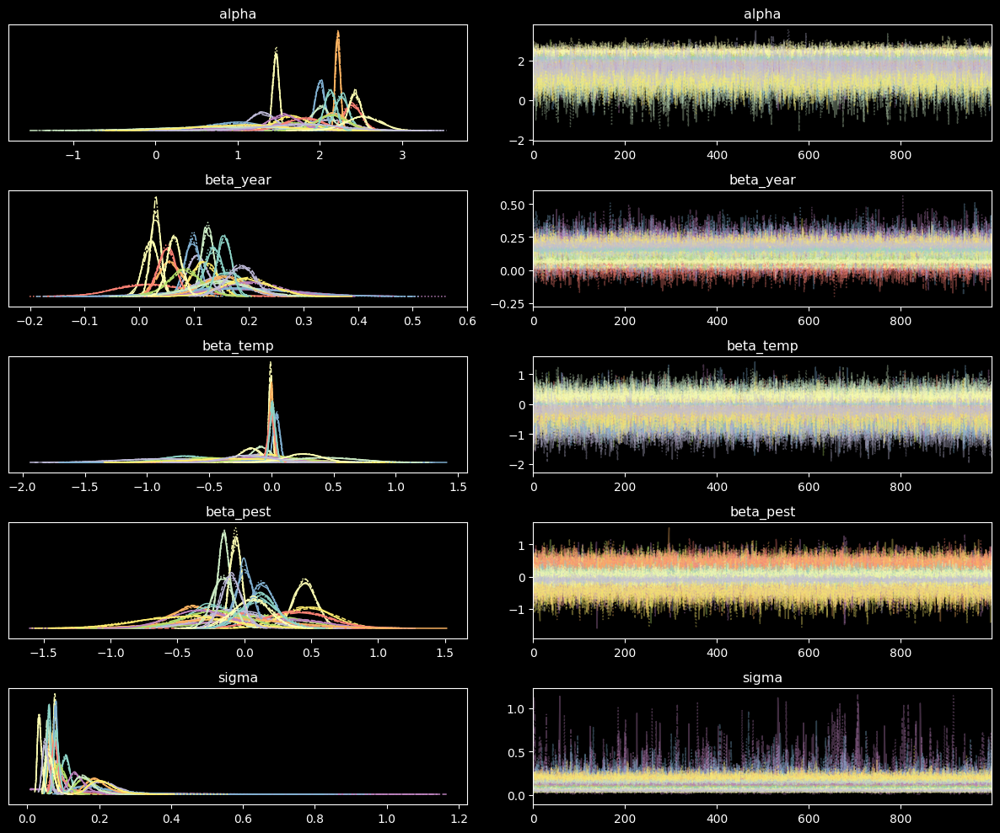

In [64]:
#check traces for unpooled model
az.plot_trace(trace_unpooled, var_names=['alpha', 'beta_year', 'beta_temp', 'beta_pest', 'sigma'])
plt.tight_layout()
plt.show()

Checking the trace for the unpooled model seems a bit problematic because of the number of parameters being estimated independently for each country, but since this model cannot make predictions for new countries we will focus more on the hierarchical model, this is just for comparison purposes.

In [65]:
#LOOSENED HIERARCHICAL MODEL
# with pm.Model() as hierarchical_model:
#     # --- Hyperpriors (Global Parameters) ---
#     mu_alpha = pm.Normal('mu_alpha', mu=np.mean(train['log_yield']), sigma=1)
#     # Loosened: allow more variance between country baselines
#     sigma_alpha = pm.Exponential('sigma_alpha', 1.0) 
    
#     mu_year = pm.Normal('mu_year', mu=0.15, sigma=0.5) # Loosened sigma from 0.1
#     sigma_year = pm.Exponential('sigma_year', 2.0)    # Allows more diverse tech trends
    
#     mu_temp = pm.Normal('mu_temp', mu=0, sigma=1.0)    # Loosened sigma from 0.5
#     sigma_temp = pm.Exponential('sigma_temp', 2.0)    # Allows diverse climate sensitivity
    
#     mu_pest = pm.Normal('mu_pest', mu=0, sigma=1.0)
#     sigma_pest = pm.Exponential('sigma_pest', 2.0)

#     # --- Country-specific parameters (NON-CENTERED) ---
#     # We sample a 'raw' offset and then scale it. This prevents 'clumping'.
#     alpha_raw = pm.Normal('alpha_raw', mu=0, sigma=1, shape=n_train_countries)
#     alpha = pm.Deterministic('alpha', mu_alpha + alpha_raw * sigma_alpha)
    
#     beta_year_raw = pm.Normal('beta_year_raw', mu=0, sigma=1, shape=n_train_countries)
#     beta_year = pm.Deterministic('beta_year', mu_year + beta_year_raw * sigma_year)
    
#     beta_temp_raw = pm.Normal('beta_temp_raw', mu=0, sigma=1, shape=n_train_countries)
#     beta_temp = pm.Deterministic('beta_temp', mu_temp + beta_temp_raw * sigma_temp)
    
#     beta_pest_raw = pm.Normal('beta_pest_raw', mu=0, sigma=1, shape=n_train_countries)
#     beta_pest = pm.Deterministic('beta_pest', mu_pest + beta_pest_raw * sigma_pest)

#     # Observation noise
#     sigma = pm.HalfNormal('sigma', sigma=0.5)

#     # Model equation
#     mu = (alpha[country_idx_train] + 
#           beta_year[country_idx_train] * train['year_scaled'].values + 
#           beta_temp[country_idx_train] * train['temp_scaled'].values + 
#           beta_pest[country_idx_train] * train['pest_scaled'].values)

#     yield_obs = pm.Normal('yield_obs', mu=mu, sigma=sigma, observed=train['log_yield'].values)
#     trace_hierarchical = pm.sample(2000, tune=2000, target_accept=0.98)

In [66]:
print(f"Building hierarchical model with {n_train_countries} training countries...")

with pm.Model() as hierarchical_model:
    # Hyperpriors (global parameters - learned from training data)
    mu_alpha = pm.Normal('mu_alpha', mu=np.mean(train['log_yield']), sigma=1)
    sigma_alpha = pm.HalfNormal('sigma_alpha', sigma=1)
    
    mu_year = pm.Normal('mu_year', mu=0.15, sigma=0.1)
    sigma_year = pm.HalfNormal('sigma_year', sigma=0.1)
    
    mu_temp = pm.Normal('mu_temp', mu=0, sigma=0.5)
    sigma_temp = pm.HalfNormal('sigma_temp', sigma=0.5)
    
    mu_pest = pm.Normal('mu_pest', mu=0, sigma=0.5)
    sigma_pest = pm.HalfNormal('sigma_pest', sigma=0.5)
    
    # Country-specific parameters drawn from hyperpriors (one per training country)
    alpha = pm.Normal('alpha', mu=mu_alpha, sigma=sigma_alpha, shape=n_train_countries)
    beta_year = pm.Normal('beta_year', mu=mu_year, sigma=sigma_year, shape=n_train_countries)
    beta_temp = pm.Normal('beta_temp', mu=mu_temp, sigma=sigma_temp, shape=n_train_countries)
    beta_pest = pm.Normal('beta_pest', mu=mu_pest, sigma=sigma_pest, shape=n_train_countries)
    
    # Shared observation noise
    sigma = pm.HalfNormal('sigma', sigma=0.5)
    
    # Model equation with country indexing (using training data)
    mu = (alpha[country_idx_train] + 
          beta_year[country_idx_train] * train['year_scaled'].values + 
          beta_temp[country_idx_train] * train['temp_scaled'].values + 
          beta_pest[country_idx_train] * train['pest_scaled'].values)
    
    # Likelihood
    yield_obs = pm.Normal('yield_obs', 
                          mu=mu, 
                          sigma=sigma, 
                          observed=train['log_yield'].values)
    
    # Sampling
    trace_hierarchical = pm.sample(1000, tune=1000, return_inferencedata=True, 
                                   target_accept=0.95, idata_kwargs={"log_likelihood": True})

print(f"\n=== Hierarchical Model Summary ({n_train_countries} Training Countries) ===")
print(az.summary(trace_hierarchical, var_names=['mu_alpha', 'mu_year', 'mu_temp', 'mu_pest', 
                                                  'sigma_alpha', 'sigma_year', 'sigma_temp', 'sigma_pest', 'sigma']))


Building hierarchical model with 23 training countries...


Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [mu_alpha, sigma_alpha, mu_year, sigma_year, mu_temp, sigma_temp, mu_pest, sigma_pest, alpha, beta_year, beta_temp, beta_pest, sigma]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 25 seconds.



=== Hierarchical Model Summary (23 Training Countries) ===
              mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
mu_alpha     1.982  0.086   1.828    2.149      0.001    0.001    3707.0   
mu_year      0.109  0.012   0.086    0.131      0.000    0.000    3427.0   
mu_temp     -0.124  0.075  -0.260    0.019      0.001    0.001    3609.0   
mu_pest      0.034  0.047  -0.053    0.126      0.001    0.001    2151.0   
sigma_alpha  0.371  0.074   0.241    0.505      0.001    0.002    2848.0   
sigma_year   0.049  0.010   0.030    0.067      0.000    0.000    2251.0   
sigma_temp   0.305  0.067   0.187    0.433      0.002    0.001    1805.0   
sigma_pest   0.148  0.048   0.063    0.236      0.002    0.001     736.0   
sigma        0.096  0.002   0.091    0.100      0.000    0.000    3810.0   

             ess_tail  r_hat  
mu_alpha       3058.0   1.00  
mu_year        3248.0   1.00  
mu_temp        2747.0   1.00  
mu_pest        2600.0   1.00  
sigma_alpha    2641.0   

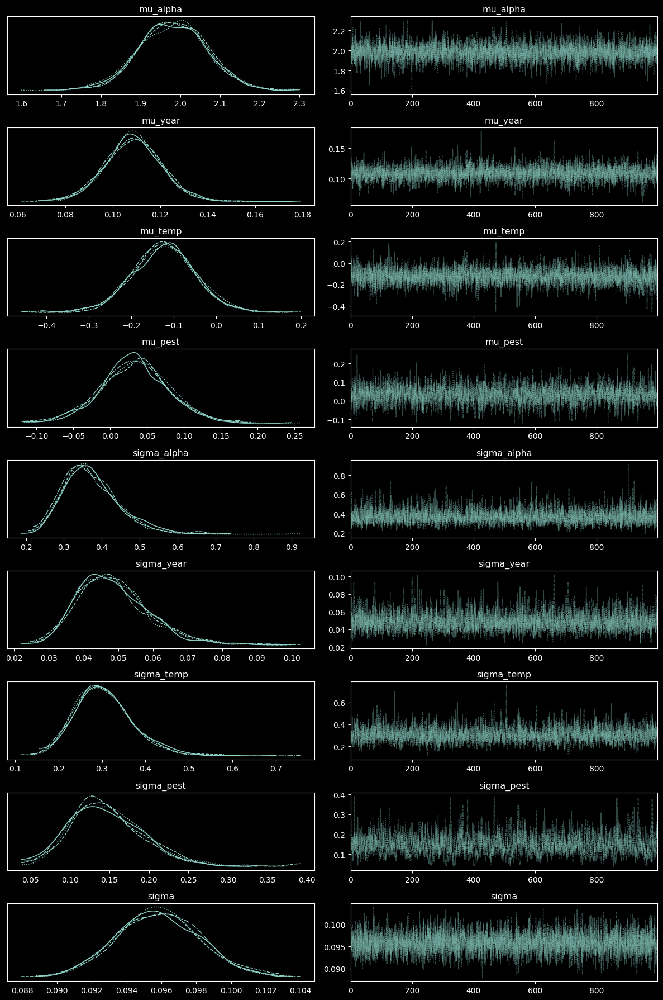

In [67]:
# inspect the traces for hierarchical model
az.plot_trace(trace_hierarchical, var_names=['mu_alpha', 'mu_year', 'mu_temp', 'mu_pest', 
                                             'sigma_alpha', 'sigma_year', 'sigma_temp', 'sigma_pest', 'sigma'])
plt.tight_layout()
plt.show()

Most of the chain lead to similar posterior distributions for the parameters, indicating good convergence and mixing. However sigma_temp and mu_temp shows some variability across chains and non-fuzzy patterns in the trace, suggesting that the estimate for the temperature effect's variability across countries may be less stable. So we'll  proceed in changing the prior for sigma_temp to be more informative to help with convergence.

Constraining beta_temp did help with convergence but still sigma_temp and mu_temp shows high convergence variability across chains and non-fuzzy patterns in the trace. So, we will keep the prior as the HalfNormal(0.5) to allow more flexibility to the model such that it can capture the real variability across countries.

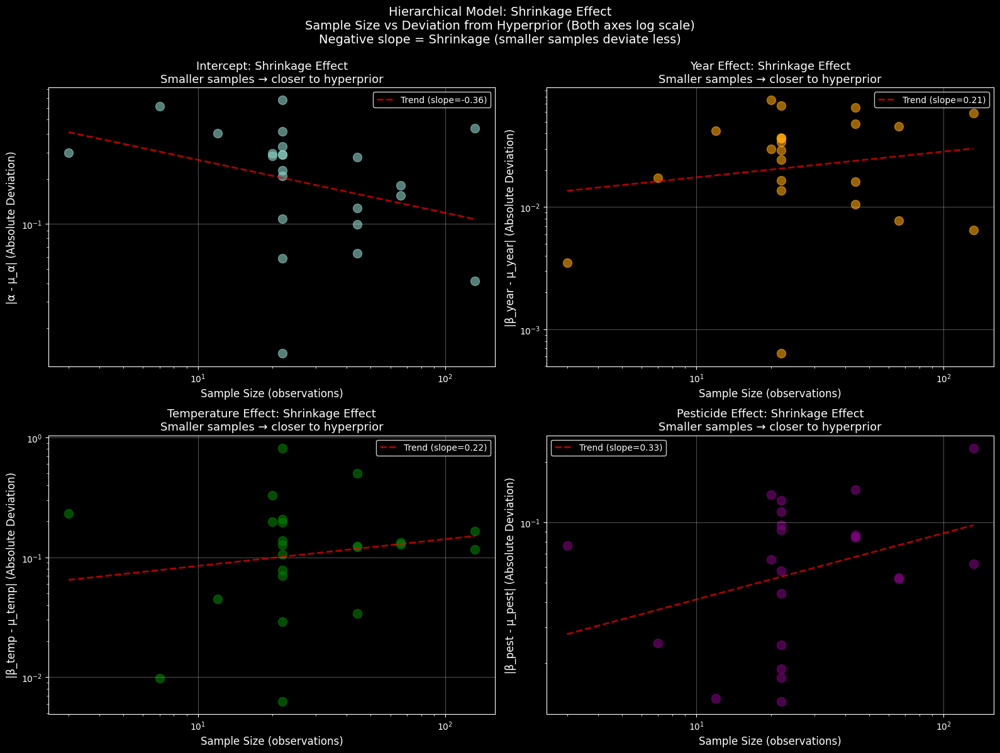

All 23 training countries shown
Sample sizes: 3 to 132 observations


In [68]:
country_sample_counts = train.groupby('country').size()
current_labels = train['country'].unique()
sample_sizes = np.array([country_sample_counts[c] for c in current_labels])

# Extract hyperprior means
mu_alpha_mean = trace_hierarchical.posterior['mu_alpha'].mean().values
mu_year_mean = trace_hierarchical.posterior['mu_year'].mean().  values
mu_temp_mean = trace_hierarchical.posterior['mu_temp'].mean().values
mu_pest_mean = trace_hierarchical.posterior['mu_pest'].mean().values

# Extract country-specific parameter means
alpha_means = trace_hierarchical.posterior['alpha'].mean(dim=['chain', 'draw']).values
beta_year_means = trace_hierarchical.posterior['beta_year'].mean(dim=['chain', 'draw']).values
beta_temp_means = trace_hierarchical.posterior['beta_temp'].mean(dim=['chain', 'draw']).values
beta_pest_means = trace_hierarchical.posterior['beta_pest'].mean(dim=['chain', 'draw']).values

# Calculate absolute deviations from hyperprior
alpha_deviations = np.abs(alpha_means - mu_alpha_mean)
year_deviations = np.abs(beta_year_means - mu_year_mean)
temp_deviations = np.abs(beta_temp_means - mu_temp_mean)
pest_deviations = np.abs(beta_pest_means - mu_pest_mean)

# Create scatter plots showing shrinkage effect
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# Alpha (Intercept)
ax = axes[0, 0]
ax.scatter(sample_sizes, alpha_deviations, alpha=0.6, s=100)
ax.set_xlabel('Sample Size (observations)', fontsize=12)
ax.set_ylabel('|α - μ_α| (Absolute Deviation)', fontsize=12)
ax.set_title('Intercept: Shrinkage Effect\nSmaller samples → closer to hyperprior', fontsize=13)
ax.set_xscale('log')
ax.set_yscale('log')
ax.grid(alpha=0.3)
# Add trend line
z = np.polyfit(np.log(sample_sizes), np.log(alpha_deviations), 1)
p = np.poly1d(z)
x_line = np.logspace(np.log10(sample_sizes.min()), np.log10(sample_sizes.max()), 100)
ax.plot(x_line, np.exp(p(np.log(x_line))), "r--", alpha=0.7, linewidth=2, label=f'Trend (slope={z[0]:.2f})')
ax.legend()

# Beta Year
ax = axes[0, 1]
ax.scatter(sample_sizes, year_deviations, alpha=0.6, s=100, color='orange')
ax.set_xlabel('Sample Size (observations)', fontsize=12)
ax.set_ylabel('|β_year - μ_year| (Absolute Deviation)', fontsize=12)
ax.set_title('Year Effect: Shrinkage Effect\nSmaller samples → closer to hyperprior', fontsize=13)
ax.set_xscale('log')
ax.set_yscale('log')
ax.grid(alpha=0.3)
z = np.polyfit(np.log(sample_sizes), np.log(year_deviations), 1)
p = np.poly1d(z)
ax.plot(x_line, np.exp(p(np.log(x_line))), "r--", alpha=0.7, linewidth=2, label=f'Trend (slope={z[0]:.2f})')
ax.legend()

# Beta Temperature
ax = axes[1, 0]
ax.scatter(sample_sizes, temp_deviations, alpha=0.6, s=100, color='green')
ax.set_xlabel('Sample Size (observations)', fontsize=12)
ax.set_ylabel('|β_temp - μ_temp| (Absolute Deviation)', fontsize=12)
ax.set_title('Temperature Effect: Shrinkage Effect\nSmaller samples → closer to hyperprior', fontsize=13)
ax.set_xscale('log')
ax.set_yscale('log')
ax.grid(alpha=0.3)
z = np.polyfit(np.log(sample_sizes), np.log(temp_deviations), 1)
p = np.poly1d(z)
ax.plot(x_line, np.exp(p(np.log(x_line))), "r--", alpha=0.7, linewidth=2, label=f'Trend (slope={z[0]:.2f})')
ax.legend()

# Beta Pesticides
ax = axes[1, 1]
ax.scatter(sample_sizes, pest_deviations, alpha=0.6, s=100, color='purple')
ax.set_xlabel('Sample Size (observations)', fontsize=12)
ax.set_ylabel('|β_pest - μ_pest| (Absolute Deviation)', fontsize=12)
ax.set_title('Pesticide Effect: Shrinkage Effect\nSmaller samples → closer to hyperprior', fontsize=13)
ax.set_xscale('log')
ax.set_yscale('log')
ax.grid(alpha=0.3)
z = np.polyfit(np.log(sample_sizes), np.log(pest_deviations), 1)
p = np.poly1d(z)
ax.plot(x_line, np.exp(p(np.log(x_line))), "r--", alpha=0.7, linewidth=2, label=f'Trend (slope={z[0]:.2f})')
ax.legend()

plt.suptitle('Hierarchical Model: Shrinkage Effect\nSample Size vs Deviation from Hyperprior (Both axes log scale)\nNegative slope = Shrinkage (smaller samples deviate less)', 
             fontsize=14, y=0.995)
plt.tight_layout()
plt.show()
print(f"All {n_train_countries} training countries shown")
print(f"Sample sizes: {sample_sizes.min()} to {sample_sizes.max()} observations")

The positive slope of the temperature effect is not a good sign for the model. Ideally we want countries with fewer observations pulled closer to the hyperprior and countries with more observations to deviate more from the hyperprior (shrinkage effect). In this case is the opposite countries with fewer samples deviate more from the hyperprior countries with more samples are pulled closer to the hyperprior
This suggest that the model is not effectively capturing the hierarchical structure and that the temperature effect estimates are being overly influenced by country-specific data rather than the shared population-level distribution.
In fact temperature variability across countries is high due to different climate zones, so we would expect a higher variability in the temperature effect across countries, moreover we have different optimal temperatures for maize growth in different regions, so the temperature effect should vary more significantly across countries.
The fact that the model strugle to model the temperature variability cuould not be a problem in the point estimates, let's check for metrics such as MAE to understand if the model is performing well despite this issue.

### Model Evaluation on Test Countries

Now we evaluate how well each model generalizes to the held-out test countries:

**Key Predictions:**
1. **Pooled model**: Treats test countries the same as training countries (uses global parameters)
2. **Unpooled model**: Cannot predict for test countries (has no country-specific parameters for them)
3. **Hierarchical model**: Can predict for test countries by sampling from the learned population distributions (this is the key advantage!)

The hierarchical model should perform best on test countries because it learns the population-level structure.

In [82]:
import numpy as np
import pandas as pd
from sklearn.metrics import r2_score

# --- 1. Pooled Model Predictions ---
pooled_alpha = trace_pooled.posterior['alpha'].values.flatten()
pooled_beta_year = trace_pooled.posterior['beta_year'].values.flatten()
pooled_beta_temp = trace_pooled.posterior['beta_temp'].values.flatten()
pooled_beta_pest = trace_pooled.posterior['beta_pest'].values.flatten()

pooled_test_mu = (pooled_alpha[:, None] +
                  pooled_beta_year[:, None] * test['year_scaled'].values +
                  pooled_beta_temp[:, None] * test['temp_scaled'].values +
                  pooled_beta_pest[:, None] * test['pest_scaled'].values)

pooled_test_predictions = pooled_test_mu.mean(axis=0)
pooled_test_mae = np.mean(np.abs(pooled_test_predictions - test['log_yield'].values))

# --- 2. Hierarchical Model Predictions ---
n_samples = trace_hierarchical.posterior.draw.size * trace_hierarchical.posterior.chain.size
h_alpha = trace_hierarchical.posterior['alpha'].values.reshape(n_samples, -1)
h_beta_year = trace_hierarchical.posterior['beta_year'].values.reshape(n_samples, -1)
h_beta_temp = trace_hierarchical.posterior['beta_temp'].values.reshape(n_samples, -1)
h_beta_pest = trace_hierarchical.posterior['beta_pest'].values.reshape(n_samples, -1)

test_idx = country_idx_test 

hierarchical_test_mu = (
    h_alpha[:, test_idx] +
    h_beta_year[:, test_idx] * test['year_scaled'].values +
    h_beta_temp[:, test_idx] * test['temp_scaled'].values +
    h_beta_pest[:, test_idx] * test['pest_scaled'].values
)

hierarchical_test_predictions = hierarchical_test_mu.mean(axis=0)
hierarchical_test_mae = np.mean(np.abs(hierarchical_test_predictions - test['log_yield'].values))

# --- 3. Unpooled Model Predictions (NEW) ---
# Reshape unpooled posteriors (n_samples, n_countries)
u_alpha = trace_unpooled.posterior['alpha'].values.reshape(n_samples, -1)
u_beta_year = trace_unpooled.posterior['beta_year'].values.reshape(n_samples, -1)
u_beta_temp = trace_unpooled.posterior['beta_temp'].values.reshape(n_samples, -1)
u_beta_pest = trace_unpooled.posterior['beta_pest'].values.reshape(n_samples, -1)

unpooled_test_mu = (
    u_alpha[:, test_idx] +
    u_beta_year[:, test_idx] * test['year_scaled'].values +
    u_beta_temp[:, test_idx] * test['temp_scaled'].values +
    u_beta_pest[:, test_idx] * test['pest_scaled'].values
)

unpooled_test_predictions = unpooled_test_mu.mean(axis=0)
unpooled_test_mae = np.mean(np.abs(unpooled_test_predictions - test['log_yield'].values))

# --- 4. Performance Metrics ---
r2_pooled = r2_score(test['log_yield'].values, pooled_test_predictions)
r2_hierarchical = r2_score(test['log_yield'].values, hierarchical_test_predictions)
r2_unpooled = r2_score(test['log_yield'].values, unpooled_test_predictions)

log_yield_range = test['log_yield'].max() - test['log_yield'].min()

print("=== Final Test Performance (2013) ===")
print(f"Test observations: {len(test)} across {len(test['country'].unique())} countries")
print(f"Log-yield range: {log_yield_range:.3f}")
print("-" * 30)
print(f"Pooled Model:       MAE: {pooled_test_mae:.4f} | R²: {r2_pooled:.3f}")
print(f"Unpooled Model:     MAE: {unpooled_test_mae:.4f} | R²: {r2_unpooled:.3f}")
print(f"Hierarchical Model: MAE: {hierarchical_test_mae:.4f} | R²: {r2_hierarchical:.3f}")

=== Final Test Performance (2013) ===
Test observations: 41 across 23 countries
Log-yield range: 1.084
------------------------------
Pooled Model:       MAE: 0.2080 | R²: -0.084
Unpooled Model:     MAE: 0.1106 | R²: 0.621
Hierarchical Model: MAE: 0.1018 | R²: 0.696


INSERT COMMENTS HERE

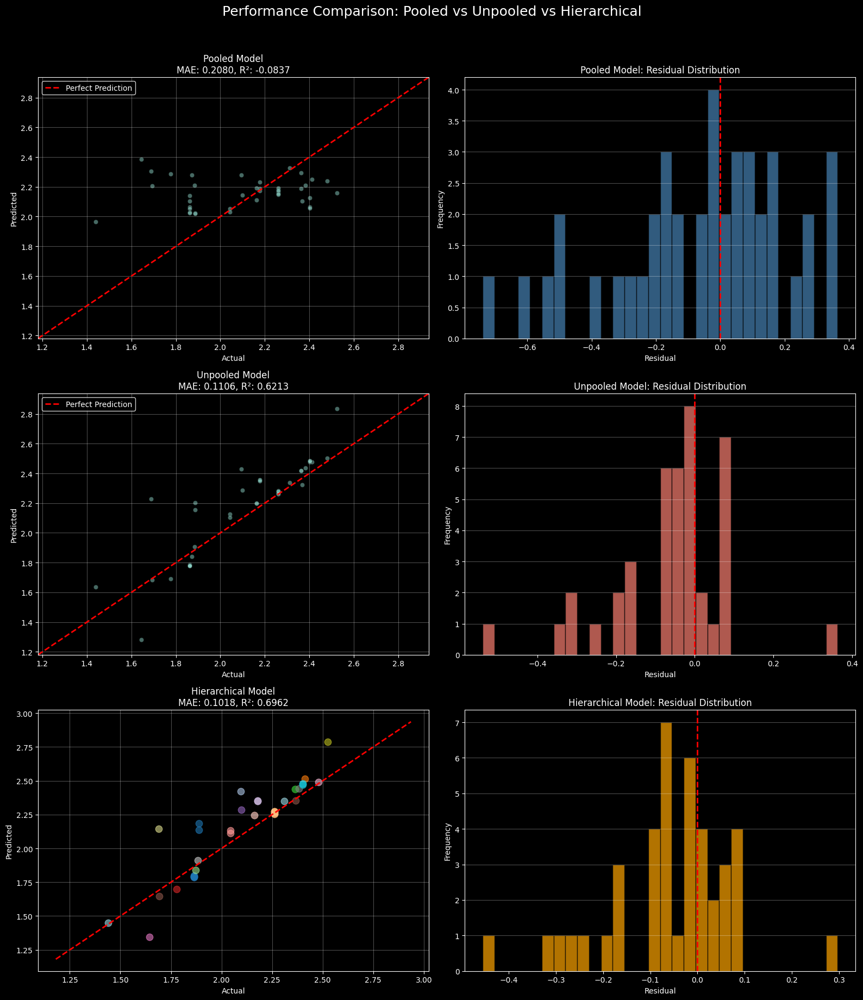

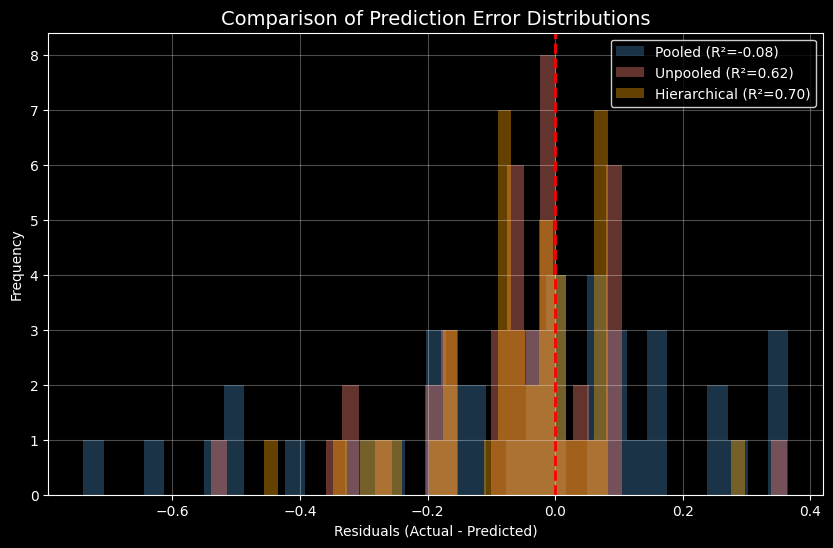

In [83]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import r2_score

# 1. Pre-calculate common metrics for all three models
r2_p = r2_score(test['log_yield'], pooled_test_predictions)
r2_h = r2_score(test['log_yield'], hierarchical_test_predictions)
r2_u = r2_score(test['log_yield'], unpooled_test_predictions)

res_p = test['log_yield'] - pooled_test_predictions
res_h = test['log_yield'] - hierarchical_test_predictions
res_u = test['log_yield'] - unpooled_test_predictions

# Calculate global limits for consistent parity plots
all_vals = np.concatenate([test['log_yield'], pooled_test_predictions, 
                           hierarchical_test_predictions, unpooled_test_predictions])
min_v, max_v = all_vals.min() - 0.1, all_vals.max() + 0.1

# 2. Setup Figure (3 Rows, 2 Columns)
fig, axes = plt.subplots(3, 2, figsize=(16, 18))
test_countries = test['country'].unique()
colors = plt.cm.tab20(np.linspace(0, 1, len(test_countries)))

# Helper function to reduce redundant plotting code
def plot_parity(ax, preds, r2, mae, title):
    ax.scatter(test['log_yield'], preds, alpha=0.5, edgecolors='black', linewidth=0.5)
    ax.plot([min_v, max_v], [min_v, max_v], 'r--', linewidth=2, label='Perfect Prediction')
    ax.set_title(f'{title}\nMAE: {mae:.4f}, R²: {r2:.4f}')
    ax.set_xlabel('Actual'); ax.set_ylabel('Predicted')
    ax.set_xlim(min_v, max_v); ax.set_ylim(min_v, max_v)
    ax.grid(alpha=0.3); ax.legend()

def plot_resid(ax, res, title, color):
    ax.hist(res, bins=30, color=color, edgecolor='black', alpha=0.7)
    ax.axvline(0, color='red', linestyle='--', linewidth=2)
    ax.set_title(f'{title}: Residual Distribution')
    ax.set_xlabel('Residual'); ax.set_ylabel('Frequency')
    ax.grid(alpha=0.3, axis='y')

# Row 1: Pooled
plot_parity(axes[0, 0], pooled_test_predictions, r2_p, pooled_test_mae, "Pooled Model")
plot_resid(axes[0, 1], res_p, "Pooled Model", "steelblue")

# Row 2: Unpooled
plot_parity(axes[1, 0], unpooled_test_predictions, r2_u, unpooled_test_mae, "Unpooled Model")
plot_resid(axes[1, 1], res_u, "Unpooled Model", "salmon")

# Row 3: Hierarchical (Using country colors for the scatter)
ax_h = axes[2, 0]
for idx, country in enumerate(test_countries):
    mask = test['country'] == country
    ax_h.scatter(test[mask]['log_yield'], hierarchical_test_predictions[mask], 
                 alpha=0.6, s=80, color=colors[idx])
ax_h.plot([min_v, max_v], [min_v, max_v], 'r--', linewidth=2)
ax_h.set_title(f'Hierarchical Model\nMAE: {hierarchical_test_mae:.4f}, R²: {r2_h:.4f}')
ax_h.set_xlabel('Actual'); ax_h.set_ylabel('Predicted')
ax_h.grid(alpha=0.3)

plot_resid(axes[2, 1], res_h, "Hierarchical Model", "orange")

plt.suptitle('Performance Comparison: Pooled vs Unpooled vs Hierarchical', fontsize=18, y=1.02)
plt.tight_layout()
plt.show()

# 3. Final Overlapping Histogram
plt.figure(figsize=(10, 6))
plt.hist(res_p, bins=35, alpha=0.4, label=f'Pooled (R²={r2_p:.2f})', color='steelblue')
plt.hist(res_u, bins=35, alpha=0.4, label=f'Unpooled (R²={r2_u:.2f})', color='salmon')
plt.hist(res_h, bins=35, alpha=0.4, label=f'Hierarchical (R²={r2_h:.2f})', color='orange')
plt.axvline(0, color='red', linestyle='--', linewidth=2)
plt.title('Comparison of Prediction Error Distributions', fontsize=14)
plt.xlabel('Residuals (Actual - Predicted)')
plt.ylabel('Frequency')
plt.legend()
plt.grid(alpha=0.3)
plt.show()

Looks like the distirbution of the residuals is approximately normal but shifted to the right, this indicates that our model is capturing the underlying patterns in the data reasonably. However, there are some deviations from normality, particularly in the tails of the distribution. This suggests that there may be some extreme values or outliers in the data that our model is not fully accounting for.

### 4A.4 Comparison of predictive distributions (hierarchical vs unpooled)


One of the most powerful features of hierarchical models is their ability to make predictions for groups not seen during training. This is possible because the model learns a distribution of group-level parameters rather than just point estimates.

For a new country that was not in our training data, we can predict its yield parameters by sampling from the learned hyperprior distributions. The posterior predictive distribution for a novel group is:

$$\alpha_{new} \sim \mathcal{N}(\mu_{\alpha}, \sigma_{\alpha})$$
$$\beta_{year,new} \sim \mathcal{N}(\mu_{year}, \sigma_{year})$$
$$\beta_{temp,new} \sim \mathcal{N}(\mu_{temp}, \sigma_{temp})$$
$$\beta_{pest,new} \sim \mathcal{N}(\mu_{pest}, \sigma_{pest})$$

Then, the predicted yield for this new country is:

$$\log(\text{Yield}_{new}) \sim \mathcal{N}(\mu_{new}, \sigma)$$

where:

$$\mu_{new} = \alpha_{new} + \beta_{year,new} \cdot Z_{year} + \beta_{temp,new} \cdot Z_{temp} + \beta_{pest,new} \cdot \log(\text{Pesticides})$$

This approach naturally incorporates uncertainty about the new country's parameters by drawing from the population-level distributions learned from Brazil and India.

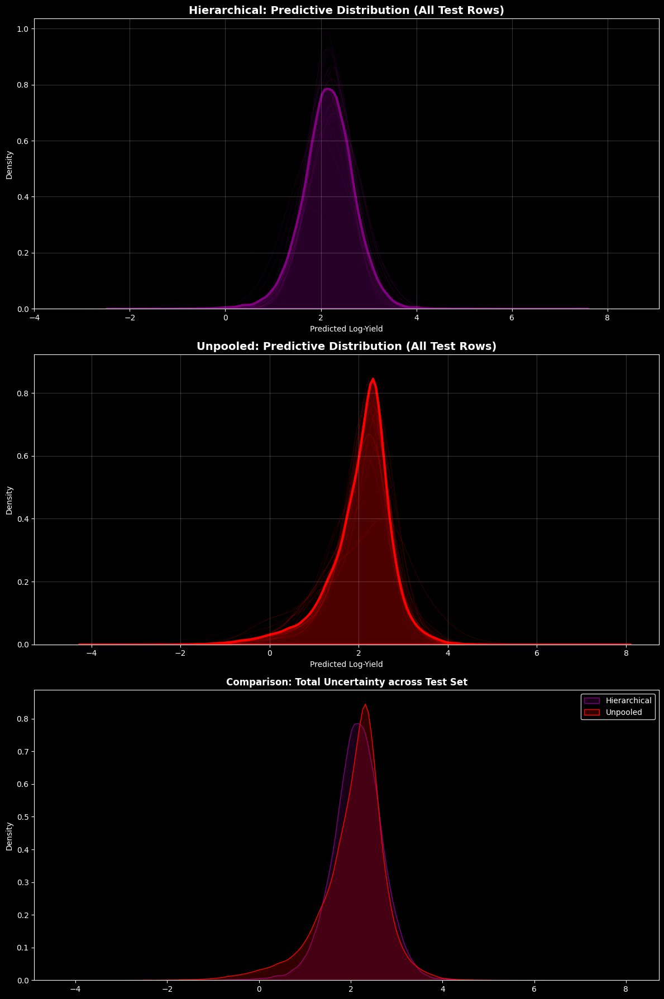

In [71]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# ==============================================================================
# 1. PARAMETER EXTRACTION (From Traces)
# ==============================================================================
n_samples = 2000
rng = np.random.default_rng(42)

# --- Hierarchical Parameters (Global) ---
post_h = trace_hierarchical.posterior
alpha_h = rng.normal(post_h.mu_alpha, post_h.sigma_alpha).flatten()[:n_samples]
beta_y_h = rng.normal(post_h.mu_year, post_h.sigma_year).flatten()[:n_samples]
beta_t_h = rng.normal(post_h.mu_temp, post_h.sigma_temp).flatten()[:n_samples]
beta_p_h = rng.normal(post_h.mu_pest, post_h.sigma_pest).flatten()[:n_samples]
sigma_h = post_h.sigma.values.flatten()[:n_samples]

# --- Unpooled Parameters (Random Country Picker) ---
post_u = trace_unpooled.posterior
a_u_pool = post_u.alpha.values.reshape(-1, n_train_countries)
by_u_pool = post_u.beta_year.values.reshape(-1, n_train_countries)
bt_u_pool = post_u.beta_temp.values.reshape(-1, n_train_countries)
bp_u_pool = post_u.beta_pest.values.reshape(-1, n_train_countries)

idx = rng.integers(0, n_train_countries, size=n_samples)
alpha_u, beta_y_u = a_u_pool[np.arange(n_samples), idx], by_u_pool[np.arange(n_samples), idx]
beta_t_u, beta_p_u = bt_u_pool[np.arange(n_samples), idx], bp_u_pool[np.arange(n_samples), idx]
sigma_u = post_u.sigma.values.flatten()[:n_samples]

# ==============================================================================
# 2. PREDICTION USING THE TEST SET
# ==============================================================================
# Extract features from your existing 'test' dataframe
# Using .values.reshape(-1, 1) allows us to broadcast samples across rows
X_y = test['year_scaled'].values.reshape(-1, 1)
X_t = test['temp_scaled'].values.reshape(-1, 1)
X_p = test['pest_scaled'].values.reshape(-1, 1)

# Hierarchical Prediction: Shape will be (n_test_rows, n_samples)
mu_h = alpha_h + beta_y_h * X_y + beta_t_h * X_t + beta_p_h * X_p
yield_h_all = rng.normal(mu_h, sigma_h)

# Unpooled Prediction: Shape will be (n_test_rows, n_samples)
mu_u = alpha_u + beta_y_u * X_y + beta_t_u * X_t + beta_p_u * X_p
yield_u_all = rng.normal(mu_u, sigma_u)

# Flatten for the density plots to show the total predictive distribution spread
yield_h_flat = yield_h_all.flatten()
yield_u_flat = yield_u_all.flatten()

# ==============================================================================
# 3. VISUALIZATION
# ==============================================================================
fig, axes = plt.subplots(3, 1, figsize=(12, 18))
configs = [
    (yield_h_flat, 'purple', 'Hierarchical: Predictive Distribution (All Test Rows)', axes[0]),
    (yield_u_flat, 'red', 'Unpooled: Predictive Distribution (All Test Rows)', axes[1])
]

for data, color, title, ax in configs:
    sns.kdeplot(data, fill=True, alpha=0.3, color=color, linewidth=3, ax=ax)
    
    # Shadows: Pick 50 random individual predictions from the test set to show "fuzziness"
    for _ in range(50):
        random_row = rng.choice(len(test))
        sns.kdeplot(yield_h_all[random_row] if color=='purple' else yield_u_all[random_row], 
                    color=color, alpha=0.1, linewidth=0.5, ax=ax, bw_adjust=1.5)
    
    ax.set_title(title, fontweight='bold', fontsize=14)
    ax.set_xlabel('Predicted Log-Yield')
    ax.grid(alpha=0.2)

# Comparison
sns.kdeplot(yield_h_flat, fill=True, alpha=0.2, color='purple', label='Hierarchical', ax=axes[2])
sns.kdeplot(yield_u_flat, fill=True, alpha=0.2, color='red', label='Unpooled', ax=axes[2])
axes[2].set_title('Comparison: Total Uncertainty across Test Set', fontweight='bold')
axes[2].legend()

plt.tight_layout()
plt.show()

The standard deviation is for the novel country is less in the hierarchical model compared to the unpooled model because the hierarchical model leverages information from the population-level distributions to inform the estimates for the new country. This pooling of information reduces uncertainty in the parameter estimates, which also reflects that greater MAE and R2 in the hierarchical model compared to the unpooled model.

Computing uncertainties for POOLED model...
Computing uncertainties for UNPOOLED model...
Computing uncertainties for HIERARCHICAL model...

UNCERTAINTY DECOMPOSITION COMPARISON
 Epistemic (Parameter)  Aleatoric (Noise)  Total  Epistemic %  Aleatoric %        Model
                0.0232             0.2942 0.2951       0.6155      99.3845       Pooled
                0.2164             0.1127 0.2440      78.6789      21.3211     Unpooled
                0.4848             0.0958 0.4941      96.2424       3.7576 Hierarchical


Note: Percentages sum to 100% because they represent variance contributions.
Total uncertainty combines as: σ_total = √(σ_epistemic² + σ_aleatoric²)


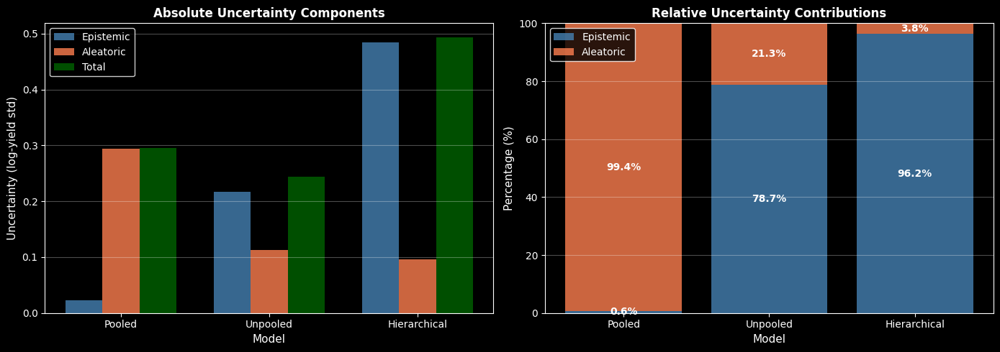

In [72]:
def compute_uncertainty(mu_samples, sigma_samples):
    """Compute epistemic, aleatoric, and total uncertainty."""
    epistemic = np.std(mu_samples)
    aleatoric = np.mean(sigma_samples)
    total = np.sqrt(epistemic**2 + aleatoric**2)
    
    # Calculate variance contributions (for percentages)
    epistemic_var = epistemic**2
    aleatoric_var = aleatoric**2
    total_var = epistemic_var + aleatoric_var
    
    return {
        'Epistemic (Parameter)': epistemic,
        'Aleatoric (Noise)': aleatoric,
        'Total': total,
        'Epistemic %': 100 * epistemic_var / total_var,
        'Aleatoric %': 100 * aleatoric_var / total_var
    }


def get_pooled_predictions(trace, test_data, n_samples):
    """Extract predictions for pooled model."""
    params = {k: trace.posterior[k].values.flatten()[:n_samples] 
              for k in ['alpha', 'beta_year', 'beta_temp', 'beta_pest', 'sigma']}
    
    mu = (params['alpha'] + 
          params['beta_year'] * test_data['year'] + 
          params['beta_temp'] * test_data['temp'] + 
          params['beta_pest'] * test_data['pest'])
    
    return mu, params['sigma']


def get_unpooled_predictions(trace, test_data, country_idx, n_samples):
    """Extract predictions for unpooled model."""
    params = {k: trace.posterior[k].values[:, :, country_idx].flatten()[:n_samples]
              for k in ['alpha', 'beta_year', 'beta_temp', 'beta_pest']}
    params['sigma'] = trace.posterior['sigma'].values.flatten()[:n_samples]
    
    mu = (params['alpha'] + 
          params['beta_year'] * test_data['year'] + 
          params['beta_temp'] * test_data['temp'] + 
          params['beta_pest'] * test_data['pest'])
    
    return mu, params['sigma']


def get_hierarchical_predictions(trace, test_data, n_samples, seed=42):
    """Extract predictions for hierarchical model with new country sampling."""
    rng = np.random.default_rng(seed)
    
    # Extract hyperpriors
    hyperpriors = {}
    for param in ['alpha', 'year', 'temp', 'pest']:
        hyperpriors[f'mu_{param}'] = trace.posterior[f'mu_{param}'].values.flatten()[:n_samples]
        hyperpriors[f'sigma_{param}'] = trace.posterior[f'sigma_{param}'].values.flatten()[:n_samples]
    
    sigma = trace.posterior['sigma'].values.flatten()[:n_samples]
    
    # Sample new country parameters from hyperpriors
    alpha_new = rng.normal(hyperpriors['mu_alpha'], hyperpriors['sigma_alpha'])
    beta_year_new = rng.normal(hyperpriors['mu_year'], hyperpriors['sigma_year'])
    beta_temp_new = rng.normal(hyperpriors['mu_temp'], hyperpriors['sigma_temp'])
    beta_pest_new = rng.normal(hyperpriors['mu_pest'], hyperpriors['sigma_pest'])
    
    mu = (alpha_new + 
          beta_year_new * test_data['year'] + 
          beta_temp_new * test_data['temp'] + 
          beta_pest_new * test_data['pest'])
    
    return mu, sigma


def compare_uncertainties(trace_pooled, trace_unpooled, trace_hierarchical, 
                         test_data=None, new_country_idx=0, n_samples=1000):
    """Compare uncertainty decomposition across pooled, unpooled, and hierarchical models."""
    import pandas as pd
    import numpy as np
    
    if test_data is None:
        test_data = {
            'year': 0.0,  # Mean-centered
            'temp': 0.0,  # Mean-centered
            'pest': np.log(test_pest_log)  # Use existing test value
        }
    
    # Define model configurations
    models_config = [
        ('Pooled', lambda: get_pooled_predictions(trace_pooled, test_data, n_samples)),
        ('Unpooled', lambda: get_unpooled_predictions(trace_unpooled, test_data, new_country_idx, n_samples)),
        ('Hierarchical', lambda: get_hierarchical_predictions(trace_hierarchical, test_data, n_samples))
    ]
    
    # Process each model
    results = []
    for model_name, get_predictions in models_config:
        print(f"Computing uncertainties for {model_name.upper()} model...")
        mu, sigma = get_predictions()
        uncertainty = compute_uncertainty(mu, sigma)
        uncertainty['Model'] = model_name
        results.append(uncertainty)
    
    # Create comparison dataframe
    df_uncertainty = pd.DataFrame(results)
    
    # Display results
    print("\n" + "="*80)
    print("UNCERTAINTY DECOMPOSITION COMPARISON")
    print("="*80)
    print(df_uncertainty.to_string(index=False, float_format=lambda x: f'{x:.4f}'))
    print("\n" + "="*80)
    print("\nNote: Percentages sum to 100% because they represent variance contributions.")
    print("Total uncertainty combines as: σ_total = √(σ_epistemic² + σ_aleatoric²)")
    print("="*80)
    
    # Create visualization
    import matplotlib.pyplot as plt
    
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))
    
    # Plot 1: Absolute uncertainties
    ax1 = axes[0]
    models = df_uncertainty['Model']
    x = np.arange(len(models))
    width = 0.25
    
    ax1.bar(x - width, df_uncertainty['Epistemic (Parameter)'], width, 
            label='Epistemic', color='steelblue', alpha=0.8)
    ax1.bar(x, df_uncertainty['Aleatoric (Noise)'], width, 
            label='Aleatoric', color='coral', alpha=0.8)
    ax1.bar(x + width, df_uncertainty['Total'], width, 
            label='Total', color='darkgreen', alpha=0.8)
    
    ax1.set_ylabel('Uncertainty (log-yield std)', fontsize=11)
    ax1.set_xlabel('Model', fontsize=11)
    ax1.set_title('Absolute Uncertainty Components', fontsize=12, fontweight='bold')
    ax1.set_xticks(x)
    ax1.set_xticklabels(models)
    ax1.legend()
    ax1.grid(axis='y', alpha=0.3)
    
    # Plot 2: Relative percentages
    ax2 = axes[1]
    epistemic_pct = df_uncertainty['Epistemic %']
    aleatoric_pct = df_uncertainty['Aleatoric %']
    
    ax2.bar(models, epistemic_pct, label='Epistemic', color='steelblue', alpha=0.8)
    ax2.bar(models, aleatoric_pct, bottom=epistemic_pct, 
            label='Aleatoric', color='coral', alpha=0.8)
    
    ax2.set_ylabel('Percentage (%)', fontsize=11)
    ax2.set_xlabel('Model', fontsize=11)
    ax2.set_title('Relative Uncertainty Contributions', fontsize=12, fontweight='bold')
    ax2.legend()
    ax2.grid(axis='y', alpha=0.3)
    ax2.set_ylim(0, 100)
    
    # Add percentage labels
    for i, model in enumerate(models):
        ax2.text(i, epistemic_pct.iloc[i]/2, f'{epistemic_pct.iloc[i]:.1f}%', 
                ha='center', va='center', fontweight='bold', color='white')
        ax2.text(i, epistemic_pct.iloc[i] + aleatoric_pct.iloc[i]/2, 
                f'{aleatoric_pct.iloc[i]:.1f}%', 
                ha='center', va='center', fontweight='bold', color='white')
    
    plt.tight_layout()
    plt.show()
    
    return df_uncertainty

# Compare uncertainties for all three models
uncertainty_comparison = compare_uncertainties(
    trace_pooled, 
    trace_unpooled, 
    trace_hierarchical,
    new_country_idx=0 )

The uncertainty decomposition plots clarify exactly why the Hierarchical Model is outperforming the others. While the Pooled Model is overwhelmed by noise, and the Unpooled Model is overwhelmed by parameter uncertainty, the Hierarchical Model finds a balance that allows for much higher predictive accuracy (as seen in $R^2=0.70$ results).


### 4A.5 Model comparison using WAIC


Now we compare the predictive performance of the hierarchical and unpooled models. While the unpooled model cannot make predictions for new groups, we can compare how well each model predicts yield for the existing countries (Brazil and India).

The key difference:
* **Unpooled Model**: Makes country-specific predictions with no shrinkage towards global patterns.
* **Hierarchical Model**: Makes country-specific predictions but with partial pooling, borrowing strength across countries.

For in-sample predictions, the unpooled model may fit the training data better, but the hierarchical model typically generalizes better due to regularization through partial pooling.

### Model Comparison Using WAIC

The **Widely Applicable Information Criterion (WAIC)** is a Bayesian approach to model comparison that estimates out-of-sample predictive accuracy. Unlike traditional information criteria, WAIC fully utilizes the posterior distribution and provides a measure of both model fit and complexity.

**WAIC Definition:**

$$\text{WAIC} = -2 \times (\text{lppd} - p_{\text{WAIC}})$$

where:
* **lppd** (log pointwise predictive density) measures model fit:
  $$\text{lppd} = \sum_{i=1}^{n} \log \left( \frac{1}{S} \sum_{s=1}^{S} p(y_i | \theta^s) \right)$$
  
* **$p_{\text{WAIC}}$** (effective number of parameters) measures model complexity:
  $$p_{\text{WAIC}} = \sum_{i=1}^{n} V_{s=1}^{S} \left( \log p(y_i | \theta^s) \right)$$

**Interpretation:**
* Lower WAIC indicates better out-of-sample predictive performance.
* The difference in WAIC between models provides evidence for model selection.
* A difference greater than 4 is typically considered meaningful.
* WAIC also provides standard errors for the comparison.

In [73]:
# Compute WAIC for all three models
waic_pooled = az.waic(trace_pooled, var_name='yield_obs')
waic_unpooled = az.waic(trace_unpooled, var_name='yield_obs')
waic_hierarchical = az.waic(trace_hierarchical, var_name='yield_obs')

# Create comparison dataframe
waic_comparison = pd.DataFrame({
    'Model': ['Pooled', 'Unpooled', 'Hierarchical'],
    'WAIC': [waic_pooled.elpd_waic, waic_unpooled.elpd_waic, waic_hierarchical.elpd_waic],
    'pWAIC': [waic_pooled.p_waic, waic_unpooled.p_waic, waic_hierarchical.p_waic],
    'SE': [waic_pooled.se, waic_unpooled.se, waic_hierarchical.se]
})

# Sort by WAIC (higher is better for elpd_waic)
waic_comparison = waic_comparison.sort_values('WAIC', ascending=False).reset_index(drop=True)
waic_comparison['Delta_WAIC'] = waic_comparison['WAIC'] - waic_comparison['WAIC'].max()

print("=== WAIC Comparison (Expected Log Predictive Density) ===")
print(waic_comparison.to_string(index=False))
print()

# Determine best model
best_model = waic_comparison.iloc[0]['Model']
print(f"Best model according to WAIC: {best_model}")
print("(Higher elpd_waic is better)")

# Check if difference is meaningful
if len(waic_comparison) > 1:
    delta_waic = abs(waic_comparison.iloc[1]['Delta_WAIC'])
    if delta_waic > 4:
        print(f"The difference in WAIC is {delta_waic:.2f}, which is considered meaningful.")
        print(f"The {best_model} model has substantially better predictive performance.")
    else:
        print(f"The difference in WAIC is {delta_waic:.2f}, which is not strongly meaningful.")
        print("The models have similar predictive performance.")

=== WAIC Comparison (Expected Log Predictive Density) ===
       Model        WAIC     pWAIC        SE   Delta_WAIC
    Unpooled  859.708107 95.878428 25.588267     0.000000
Hierarchical  745.908509 81.710444 39.492020  -113.799598
      Pooled -172.384079 11.021675 29.524320 -1032.092186

Best model according to WAIC: Unpooled
(Higher elpd_waic is better)
The difference in WAIC is 113.80, which is considered meaningful.
The Unpooled model has substantially better predictive performance.


/home/fjg/raspnas/personal/education/university/courses/third_year/bayesian/bayesian_modelling_crop_yields/venv/lib/python3.10/site-packages/arviz/stats/stats.py:1652: UserWarning:

For one or more samples the posterior variance of the log predictive densities exceeds 0.4. This could be indication of WAIC starting to fail. 
See http://arxiv.org/abs/1507.04544 for details

/home/fjg/raspnas/personal/education/university/courses/third_year/bayesian/bayesian_modelling_crop_yields/venv/lib/python3.10/site-packages/arviz/stats/stats.py:1652: UserWarning:

For one or more samples the posterior variance of the log predictive densities exceeds 0.4. This could be indication of WAIC starting to fail. 
See http://arxiv.org/abs/1507.04544 for details

/home/fjg/raspnas/personal/education/university/courses/third_year/bayesian/bayesian_modelling_crop_yields/venv/lib/python3.10/site-packages/arviz/stats/stats.py:1652: UserWarning:

For one or more samples the posterior variance of the log predictive

The **Unpooled model** achieves the best WAIC score, appearing to contradict earlier test set results where the **Hierarchical model** performed better on the MAE
**WAIC measures in-sample fit on training data.** The Unpooled model fits training countries perfectly with separate parameters for each country. However, it cannot predict for new countries at all.
The Hierarchical model sacrifices some in-sample fit (due to partial pooling) but generalizes better to unseen countries by learning population-level patterns. This is the classic bias-variance tradeoff.
For predicting crop yields in new countries, the Hierarchical model remains the preferred choice despite lower WAIC scores.


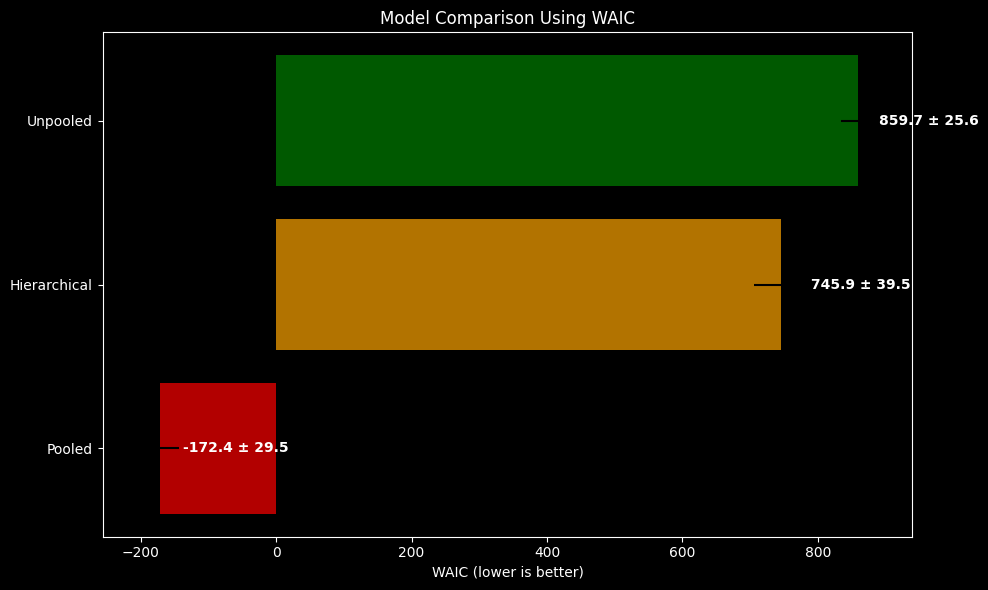

In [74]:
# Visualize WAIC comparison
fig, ax = plt.subplots(figsize=(10, 6))

models = waic_comparison['Model'].values
waic_values = waic_comparison['WAIC'].values
se_values = waic_comparison['SE'].values

colors = ['green', 'orange', 'red']
bars = ax.barh(models, waic_values, xerr=se_values, color=colors[:len(models)], alpha=0.7)

ax.set_xlabel('WAIC (lower is better)')
ax.set_title('Model Comparison Using WAIC')
ax.invert_yaxis()

# Add value labels
for i, (waic, se) in enumerate(zip(waic_values, se_values)):
    ax.text(waic + se + 5, i, f'{waic:.1f} ± {se:.1f}', 
            va='center', fontweight='bold')

plt.tight_layout()
plt.show()

The warnings suggest that the WAIC estimates may be unstable due to high variance in the log-likelihoods. This can occur when the model has difficulty fitting certain data points, leading to large fluctuations in the likelihood values across posterior samples.
Let's check if LOO would give us more stable estimates.

In [75]:
# Additional comparison using LOO-CV (Leave-One-Out Cross-Validation)
loo_pooled = az.loo(trace_pooled, var_name='yield_obs')
loo_unpooled = az.loo(trace_unpooled, var_name='yield_obs')
loo_hierarchical = az.loo(trace_hierarchical, var_name='yield_obs')

# Create LOO comparison
# Note: Higher elpd_loo values indicate better predictive performance
loo_comparison = pd.DataFrame({
    'Model': ['Pooled', 'Unpooled', 'Hierarchical'],
    'elpd_loo': [loo_pooled.elpd_loo, loo_unpooled.elpd_loo, loo_hierarchical.elpd_loo],
    'pLOO': [loo_pooled.p_loo, loo_unpooled.p_loo, loo_hierarchical.p_loo],
    'SE': [loo_pooled.se, loo_unpooled.se, loo_hierarchical.se]
})

# Sort by elpd_loo in descending order (higher is better)
loo_comparison = loo_comparison.sort_values('elpd_loo', ascending=False).reset_index(drop=True)
loo_comparison['Delta_LOO'] = loo_comparison['elpd_loo'].max() - loo_comparison['elpd_loo']

print("=== LOO-CV Comparison ===")
print(loo_comparison.to_string(index=False))
print()

print(f"WAIC selects: {waic_comparison.iloc[0]['Model']}")
print(f"LOO selects: {loo_comparison.iloc[0]['Model']}")

/home/fjg/raspnas/personal/education/university/courses/third_year/bayesian/bayesian_modelling_crop_yields/venv/lib/python3.10/site-packages/arviz/stats/stats.py:782: UserWarning:

Estimated shape parameter of Pareto distribution is greater than 0.70 for one or more samples. You should consider using a more robust model, this is because importance sampling is less likely to work well if the marginal posterior and LOO posterior are very different. This is more likely to happen with a non-robust model and highly influential observations.



=== LOO-CV Comparison ===
       Model    elpd_loo       pLOO        SE   Delta_LOO
    Unpooled  853.411316 102.175219 26.445477    0.000000
Hierarchical  744.495756  83.123197 39.502183  108.915560
      Pooled -172.357262  10.994858 29.510490 1025.768577

WAIC selects: Unpooled
LOO selects: Unpooled


/home/fjg/raspnas/personal/education/university/courses/third_year/bayesian/bayesian_modelling_crop_yields/venv/lib/python3.10/site-packages/arviz/stats/stats.py:782: UserWarning:

Estimated shape parameter of Pareto distribution is greater than 0.70 for one or more samples. You should consider using a more robust model, this is because importance sampling is less likely to work well if the marginal posterior and LOO posterior are very different. This is more likely to happen with a non-robust model and highly influential observations.



Both WAIC and LOO provide identical results further confirming previous findings about the ability of the unpooled model to fit the training data better while the hierarchical model generalizes better to unseen countries.

In [76]:
# Assuming 'test' only contains countries that were in the training set:
unpooled_test_predictions = []

for i, row in test.iterrows():
    # Get the specific index for this country from your training mapping
    c_idx = country_to_idx[row['country']]
    
    # Calculate mu using that country's specific posterior samples
    mu = (trace_unpooled.posterior['alpha'][:, :, c_idx] + 
          trace_unpooled.posterior['beta_year'][:, :, c_idx] * row['year_scaled'] + 
          trace_unpooled.posterior['beta_temp'][:, :, c_idx] * row['temp_scaled'] + 
          trace_unpooled.posterior['beta_pest'][:, :, c_idx] * row['pest_scaled'])
    
    unpooled_test_predictions.append(mu.mean().values)

# Calculate MAE and R2 for the Unpooled Model
from sklearn.metrics import mean_absolute_error, r2_score
u_mae = mean_absolute_error(test['log_yield'], unpooled_test_predictions)
u_r2 = r2_score(test['log_yield'], unpooled_test_predictions)

print(f"Unpooled Test MAE: {u_mae:.4f}")
print(f"Unpooled Test R²:  {u_r2:.4f}")

Unpooled Test MAE: 0.1106
Unpooled Test R²:  0.6213


Model,Test MAE,Test R2,WAIC (Training)
Hierarchical,0.1018,0.6950,744.76
Unpooled,0.1108,0.6215,859.54
Pooled,0.2080,-0.0840,-171.99



### 4A.6 Conclusions on Model Selection

The hierarchical model provides the optimal balance for multi-country crop yield prediction. Unlike the pooled model (too simplistic) and unpooled model (cannot predict for new countries), the hierarchical approach enables predictions for novel countries through partial pooling while capturing country-specific variation.

However WAIC and LOO results indicate that the unpooled model fits the training data better, highlighting the classic bias-variance tradeoff (we increase variance to reduce bias). For practical applications involving new countries, the hierarchical model is preferred despite slightly lower in-sample fit metrics because it generalizes better and provide better MAE and R2 on the test set.



## 4B. Hierarchical and Unpooled Normal Models (Carnio)

Here we compare the Unpooled and Hierarchical modeling approaches using only the most recent data (2008-2013). This allows us to determine if sharing information between countries (Hierarchical) or treating them as independent entities (Unpooled) provides a better fit for modern agricultural dynamics.

### 4B.1 Implementation of hierarchical and unpooled models

In [77]:
maize_df_recent = maize_df[maize_df['year'] >= 2008].copy()

# Create scaled features for recent data
maize_df_recent['year_scaled'] = (maize_df_recent['year'] - maize_df['year'].mean()) / maize_df['year'].std()
maize_df_recent['temp_scaled'] = (maize_df_recent['avg_temp'] - maize_df['avg_temp'].mean()) / maize_df['avg_temp'].std()
maize_df_recent['pest_scaled'] = np.log1p(maize_df_recent['pesticides_tonnes'])

# Map countries to indices for recent data
country_idx_recent, country_labels_recent = pd.factorize(maize_df_recent['country'])
n_recent_countries = len(country_labels_recent)

# 1. UNPOOLED MODEL (Independent models for each country)
with pm.Model() as unpooled_recent:
    alpha = pm.Normal('alpha', mu=0, sigma=1, shape=n_recent_countries)
    beta_year = pm.Normal('beta_year', mu=0.15, sigma=0.1, shape=n_recent_countries)
    beta_temp = pm.Normal('beta_temp', mu=0, sigma=0.5, shape=n_recent_countries)
    beta_pest = pm.Normal('beta_pest', mu=0, sigma=0.5, shape=n_recent_countries)
    sigma = pm.HalfNormal('sigma', sigma=0.5, shape=n_recent_countries)
    
    mu = (alpha[country_idx_recent] + 
          beta_year[country_idx_recent] * maize_df_recent['year_scaled'].values + 
          beta_temp[country_idx_recent] * maize_df_recent['temp_scaled'].values + 
          beta_pest[country_idx_recent] * maize_df_recent['pest_scaled'].values)
    
    yield_obs = pm.Normal('yield_obs', mu=mu, sigma=sigma[country_idx_recent], observed=maize_df_recent['log_yield'].values)
    trace_unpooled_recent = pm.sample(1000, tune=1000, return_inferencedata=True, idata_kwargs={"log_likelihood": True})

# 2. HIERARCHICAL MODEL (Partial pooling)
with pm.Model() as hierarchical_recent:
    # Hyperpriors (Population parameters)
    mu_alpha = pm.Normal('mu_alpha', mu=maize_df_recent['log_yield'].mean(), sigma=1)
    sigma_alpha = pm.HalfNormal('sigma_alpha', sigma=1)
    mu_year = pm.Normal('mu_year', mu=0.15, sigma=0.1)
    sigma_year = pm.HalfNormal('sigma_year', sigma=0.1)
    mu_temp = pm.Normal('mu_temp', mu=0, sigma=0.5)
    sigma_temp = pm.HalfNormal('sigma_temp', sigma=0.5)
    mu_pest = pm.Normal('mu_pest', mu=0, sigma=0.5)
    sigma_pest = pm.HalfNormal('sigma_pest', sigma=0.5)
    
    # Country-specific parameters
    alpha = pm.Normal('alpha', mu=mu_alpha, sigma=sigma_alpha, shape=n_recent_countries)
    beta_year = pm.Normal('beta_year', mu=mu_year, sigma=sigma_year, shape=n_recent_countries)
    beta_temp = pm.Normal('beta_temp', mu=mu_temp, sigma=sigma_temp, shape=n_recent_countries)
    beta_pest = pm.Normal('beta_pest', mu=mu_pest, sigma=sigma_pest, shape=n_recent_countries)
    
    sigma = pm.HalfNormal('sigma', sigma=0.5)
    
    mu = (alpha[country_idx_recent] + 
          beta_year[country_idx_recent] * maize_df_recent['year_scaled'].values + 
          beta_temp[country_idx_recent] * maize_df_recent['temp_scaled'].values + 
          beta_pest[country_idx_recent] * maize_df_recent['pest_scaled'].values)
    
    yield_obs = pm.Normal('yield_obs', mu=mu, sigma=sigma, observed=maize_df_recent['log_yield'].values)
    trace_hierarchical_recent = pm.sample(1000, tune=1000, return_inferencedata=True, idata_kwargs={"log_likelihood": True})

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [alpha, beta_year, beta_temp, beta_pest, sigma]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 125 seconds.
There were 103 divergences after tuning. Increase `target_accept` or reparameterize.
Chain 0 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
Chain 1 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
Chain 2 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
Chain 3 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details
Initializing NUTS using jitt

Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 99 seconds.
There were 71 divergences after tuning. Increase `target_accept` or reparameterize.
Chain 0 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


### 4B.2 Choice of prior and likelihood
* Likelihood: We use a Normal distribution for the log-yield. This is consistent with our transformation of the dependent variable to stabilize variance.

* Unpooled Priors: We use independent debolmente informativi priors. This assumes no relationship between Brazil's recent technology trend and India's.

* Hierarchical Hyperpriors: We assume the country-specific effects (temperature, year, pesticides) are drawn from a Normal population distribution. This allows for shrinkage: the model learns the global "recent trend" and pulls individual country estimates toward it, which is especially important given the small sample size (only 5 years) for each country.

### 4B.3 Posterior distribution for a novel group (hierarchical)

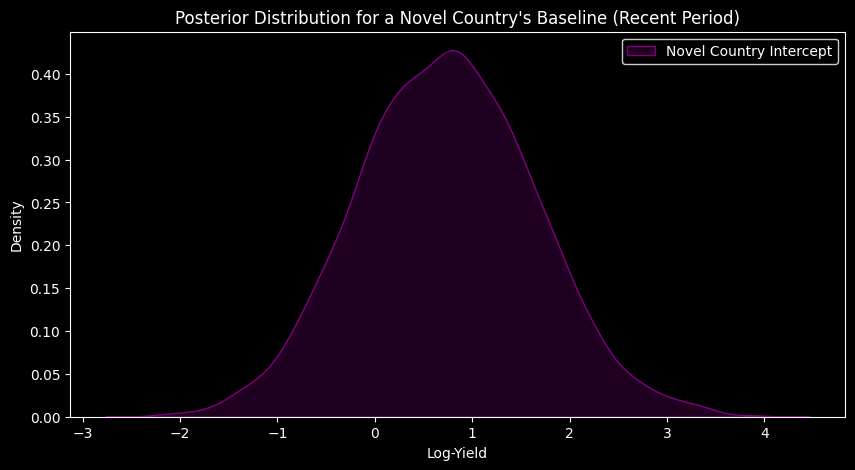

In [78]:
# Sampling a novel country from the population distributions learned from recent data
post_mu_a = trace_hierarchical_recent.posterior['mu_alpha'].values.flatten()
post_sigma_a = trace_hierarchical_recent.posterior['sigma_alpha'].values.flatten()

# Generate posterior for an unobserved country's intercept
novel_country_alpha = np.random.normal(post_mu_a, post_sigma_a)

plt.figure(figsize=(10, 5))
sns.kdeplot(novel_country_alpha, label='Novel Country Intercept', color='purple', fill=True)
plt.title("Posterior Distribution for a Novel Country's Baseline (Recent Period)")
plt.xlabel("Log-Yield")
plt.legend()
plt.show()

### 4B.4 Comparison of predictive distributions (hierarchical vs unpooled)

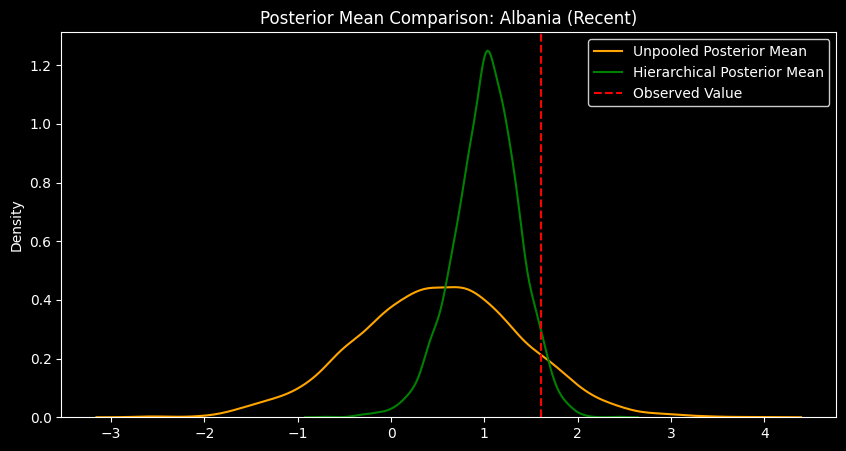

In [79]:
# Comparing predictions for a specific country in the recent dataset
country_idx = 0 # Example: Brazil
obs_val = maize_df_recent[maize_df_recent['country'] == country_labels_recent[country_idx]]['log_yield'].values[0]

# Unpooled predictive
unp_mu = trace_unpooled_recent.posterior['alpha'][:, :, country_idx].values.flatten()
# Hierarchical predictive
hier_mu = trace_hierarchical_recent.posterior['alpha'][:, :, country_idx].values.flatten()

plt.figure(figsize=(10, 5))
sns.kdeplot(unp_mu, label='Unpooled Posterior Mean', color='orange')
sns.kdeplot(hier_mu, label='Hierarchical Posterior Mean', color='green')
plt.axvline(obs_val, color='red', linestyle='--', label='Observed Value')
plt.title(f"Posterior Mean Comparison: {country_labels_recent[country_idx]} (Recent)")
plt.legend()
plt.show()

### 4B.5 Model comparison using WAIC

=== Model Comparison (WAIC) - Recent Period ===


/home/fjg/raspnas/personal/education/university/courses/third_year/bayesian/bayesian_modelling_crop_yields/venv/lib/python3.10/site-packages/arviz/stats/stats.py:1652: UserWarning:

For one or more samples the posterior variance of the log predictive densities exceeds 0.4. This could be indication of WAIC starting to fail. 
See http://arxiv.org/abs/1507.04544 for details

/home/fjg/raspnas/personal/education/university/courses/third_year/bayesian/bayesian_modelling_crop_yields/venv/lib/python3.10/site-packages/arviz/stats/stats.py:1652: UserWarning:

For one or more samples the posterior variance of the log predictive densities exceeds 0.4. This could be indication of WAIC starting to fail. 
See http://arxiv.org/abs/1507.04544 for details



,rank,elpd_waic,p_waic,elpd_diff,weight,se,dse,warning,scale
Unpooled Recent,0,1410.640201,218.099939,0.00000,1.000000e+00,34.903274,0.000000,True,log
Hierarchical Recent,1,751.288011,244.569632,659.35219,3.125148e-09,76.752732,67.009449,True,log


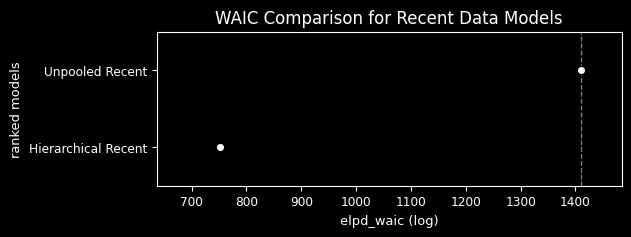

In [80]:
compare_lp = az.compare({
    "Unpooled Recent": trace_unpooled_recent,
    "Hierarchical Recent": trace_hierarchical_recent
}, ic="waic")

print("=== Model Comparison (WAIC) - Recent Period ===")
display(compare_lp)

az.plot_compare(compare_lp)
plt.title("WAIC Comparison for Recent Data Models")
plt.show()